In [1]:
#standard imports
import detprocess as dp
from pathlib import Path
import yaml
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from glob import glob
import math
import qetpy as qp
from pytesdaq.processing import ContinuousData


from pytesdaq.io.hdf5 import H5Reader, getrandevents

from scipy import stats, optimize, interpolate

from matplotlib import rc
rc('text', usetex=False)
rc('font', family="sans-serif")
rc('axes', labelsize=12)
rc('font', size=12)
rc('legend', fontsize=10)
rc('xtick', labelsize=12)
rc('ytick', labelsize=12)

h5_reader = H5Reader()

/usr/lib64/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)


In [3]:
#threshtrigv2_noBa_12hr_I2_D20221004_T151534 : trigger processed with same RQ template, includes lowchi2
##continuous_I2_D20220802_T174824 : 14 hours no Ba source
run = '_19/'
series = '_D20220802_T174824'
version = 'noBa_3pt5_gaas'
suffix = '/sdata1/runs/run19/processed/'
suffix_analysis = '/data/users/da_real_maggie_reed/analysis/run'+run
trigger_path = suffix + 'trig3pt5_gaas_I2_D20221109_T125417'
yaml_path = suffix_analysis + 'data/process_run19_nos.yaml'
save_path = '/sdata1/runs/run19/processed/' + 'deptprocessv3_'+ version + '_I2' + series
if not Path(save_path).is_dir():
    raise OSError(f"Please create {save_path} for saving processed files.")
series = [Path(s).parts[-1] for s in sorted(glob(f"{trigger_path}*"))]

In [4]:
#process over our data
for ii, file in enumerate(sorted(glob(f"{trigger_path}/*.hdf5"))):
    df = dp.process_data(
        file,
        yaml_path,
        savepath=save_path, # pass None if you don't want to save the file (for debugging)
        #nevents=10, # process only the first 10 events (for debugging)
        #external_file=None, # set to the path to an external file that contains different features than the default (see the README for more info)
    )
    print(ii)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [3]:
#loads all the features we got from the hdf5 made by dp
#returns a dataframe
#files are already created and ready to go from a prior build
df_r19nos = dp.io.load_features(save_path)
df_r18fe = dp.io.load_features('/data/users/da_real_maggie_reed/processed/run18/deptprocess_morerandoms_uptempvf_I2_D20220628_T132125')
df_r19Ba = dp.io.load_features('/sdata1/runs/run19/processed/deptprocess_ba_I2_D20220801_T193149')

In [4]:
df.keys()
# for some reason I am only getting lowchi2 for nodelay but not anything else. 

Index(['ofamp_nodelay_CPDv21Ge', 'ofchi2_nodelay_CPDv21Ge',
       'ofchi2low_nodelay_CPDv21Ge', 'ofamp_unconstrained_CPDv21Ge',
       'oft0_unconstrained_CPDv21Ge', 'ofchi2_unconstrained_CPDv21Ge',
       'ofamp_constrained_CPDv21Ge', 'oft0_constrained_CPDv21Ge',
       'ofchi2_constrained_CPDv21Ge', 'baseline_CPDv21Ge', 'integral_CPDv21Ge',
       'energyabsorbed_CPDv21Ge', 'eventnumber', 'eventindex', 'dumpnumber',
       'seriesnumber', 'eventtime', 'triggertype', 'triggeramp',
       'triggertime'],
      dtype='object')

In [5]:
template = np.loadtxt('/data/users/da_real_maggie_reed/analysis/run_18/templatevf_upvf_I2_D20220628_T132125.txt')


In [83]:
#setting triggers for both frames and the merged frames
ctrigger_r18fe = df_r18fe.triggertype == 1
ctrigger_r19nos = df_r19nos.triggertype == 1
ctrigger_r19Ba = df_r19Ba.triggertype == 1

crandoms_r18fe = df_r18fe.triggertype == 0
crandoms_r19nos = df_r19nos.triggertype == 0
crandoms_r19Ba = df_r19Ba.triggertype == 0

fs = 1.25e6
tracelength = 20e-3
#f_fold, psd_fold = qp.foldpsd(psd, fs)
#for plotting time in a way that makes sense and getting total time for rates etc
tot_runtime_r18fe = df_r18fe.eventtime[ctrigger_r18fe].iloc[-1]-df_r18fe.eventtime[ctrigger_r18fe].iloc[0]
tot_runtime_r19nos = df_r19nos.eventtime[ctrigger_r19nos].iloc[-1]-df_r19nos.eventtime[ctrigger_r19nos].iloc[0]
tot_runtime_r19Ba = df_r19Ba.eventtime[ctrigger_r19Ba].iloc[-1]-df_r19Ba.eventtime[ctrigger_r19Ba].iloc[0]

from scipy import constants

#defining calibrated ofamp from run 10 calculated calibration coeff
m_run10 = 8.045875997742481e-08

calibratedofamp_r18fe_nodelay = df_r18fe.ofamp_nodelay_CPDv21Ge/fitslope
calibratedofamp_r18fe_constrained= df_r18fe.ofamp_constrained_CPDv21Ge/fitslope
#defining calibrated energy (integrated) from collection efficiency of 16%
calibratedenergy_r18fe = -((df_r18fe.energyabsorbed_CPDv21Ge/constants.e)/161)


#defining calibrated energy (integrated) from collection efficiency of 16%
calibratedenergy_r19nos = -((df_r19nos.energyabsorbed_CPDv21Ge/constants.e)/161)

calibratedofamp_r19Ba_nodelay = df_r19Ba.ofamp_nodelay_CPDv21Ge/m_run10
calibratedofamp_r19Ba_constrained= df_r19Ba.ofamp_constrained_CPDv21Ge/m_run10
#defining calibrated energy (integrated) from collection efficiency of 16%
calibratedenergy_r19Ba = -((df_r19Ba.energyabsorbed_CPDv21Ge/constants.e)/161)

# Chi2 good time cuts

## r19 nos

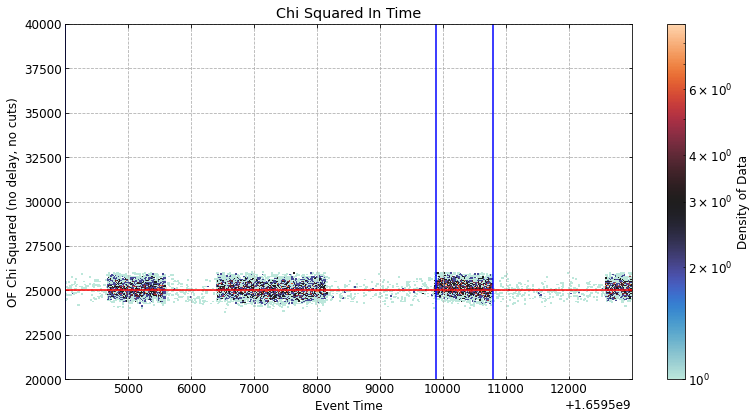

In [112]:
fig, ax = dp.densityplot(
    df_r19nos.eventtime,
    df_r19nos.ofchi2_nodelay_CPDv21Ge,
    cut=c_goodevents_r19nos&ctemp_r19nos_lowpop,
    ylims=[0.2e5, 4e4],
  #  xlims=[0, 1.2],
)

ax.axvline(9900+1.6595e9, c='b')
ax.axvline(10800+1.6595e9, c='b')

ax.axvline(504000+1.659e9, c='b')

#number of dof per trace (chi2 mean)
ax.axhline((fs*tracelength),c='r')
ax.set_xlabel('Event Time')
ax.set_ylabel('OF Chi Squared (no delay, no cuts)')
ax.set_title('Chi Squared In Time')
fig.tight_layout()

'''
fig.savefig(
'/data/users/da_real_maggie_reed/analysis/run_20/figs/run20_goodtime_postc.png',
dpi=500,
facecolor='none',
)
#''';

In [5]:
#defining our times
ctimenoise1 = dp.inrange(df_r19nos.eventtime,4700+1.6595e9,5700+1.6595e9)
ctimenoise2 = dp.inrange(df_r19nos.eventtime,6400+1.6595e9,8190+1.6595e9)
ctimenoise3 = dp.inrange(df_r19nos.eventtime,9900+1.6595e9,10800+1.6595e9)

cgoodtime_r19nos = (dp.inrange(df_r19nos.eventtime,504000+1.659e9,10800+1.6595e9)&np.invert(ctimenoise1)&np.invert(ctimenoise2)&np.invert(ctimenoise3))

cgoodtime_r19nosv2 = ((df_r19nos.eventtime>504000+1.659e9)&(df_r19nos.eventtime<513000+1.659e9))



In [8]:
#events_upper = sum(ctemp_up[ctrigger&cgood_time])/tot_time

#print('the rate of events in the lower distribution is:',events_lower,'\n')


## r18 fe55

In [6]:

ctime0=(df_r18fe.eventtime<90500+1.6564e9)
ctime_early = (df_r18fe.eventtime<83500+1.6564e9)
ctime_mid_noisy = ((df_r18fe.eventtime>83500+1.6564e9)&(df_r18fe.eventtime<87100+1.6564e9))
ctime_late = (df_r18fe.eventtime>87100+1.6564e9)
cgoodtime_r18fe = ctime0&np.invert(ctime_mid_noisy)

cgoodtime_r18v2 = dp.inrange(df_r18fe.eventtime,79700+1.6564e9,82500+1.6564e9)

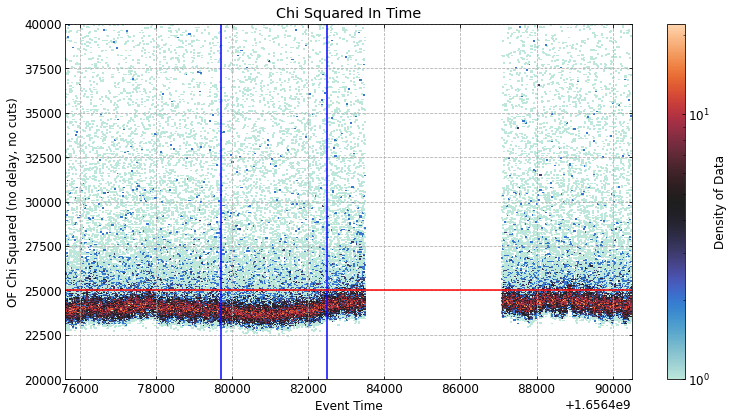

In [177]:
fig, ax = dp.densityplot(
    df_r18fe.eventtime,
    df_r18fe.ofchi2_nodelay_CPDv21Ge,
    cut=ctrigger_r18fe&cgoodtime_r18fe,
    ylims=[0.2e5, 4e4],
  #  xlims=[0, 1.2],
)

ax.axvline(79700+1.6564e9, c='b')
ax.axvline(82500+1.6564e9, c='b')

ax.axvline(504000+1.659e9, c='b')

#number of dof per trace (chi2 mean)
ax.axhline((fs*tracelength),c='r')
ax.set_xlabel('Event Time')
ax.set_ylabel('OF Chi Squared (no delay, no cuts)')
ax.set_title('Chi Squared In Time')
fig.tight_layout()

'''
fig.savefig(
'/data/users/da_real_maggie_reed/analysis/run_20/figs/run20_goodtime_postc.png',
dpi=500,
facecolor='none',
)
#''';

## run19 Ba

In [7]:
cgoodtime_r19Ba = (dp.inrange(df_r19Ba.eventtime,20000+1.6594e9,30000+1.6594e9))


# Baseline cut

## r19 nos

In [8]:
#more rigorous baseline cut
#binning the event time into 400s bins and then finding baseline cut that cuts 10% of high end of baseline in each bin
import math
start_time=df_r19nos.eventtime[ctrigger_r19nos].iloc[0]
binsize=400 #size in seconds of each bin used to partition eventtime for baseline cutting
binnumber=tot_runtime_r19nos/binsize

cbaseline_list=np.empty(math.ceil(binnumber),dtype='object')

for i in range(math.floor(binnumber)):
    ctime_temp = dp.inrange(df_r19nos.eventtime,(binsize*i)+start_time,(binsize*(i+1))+start_time)
    cut_value=np.percentile(df_r19nos.baseline_CPDv21Ge[ctime_temp],85)
    cbaseline_list[i]=dp.inrange(df_r19nos.baseline_CPDv21Ge,-np.inf,cut_value)&ctime_temp

if math.floor(binnumber)!=math.ceil(binnumber): #this fills in the cut for the last time bin, which isn't the full length of the other time bins unless your bin size perfectly divides your total time 
    ctime_temp=dp.inrange(df_r19nos.eventtime,(binsize*math.floor(binnumber))+start_time,start_time+tot_runtime_r19nos)
    cut_value=np.percentile(df_r19nos.baseline_CPDv21Ge[ctime_temp],85)
    cbaseline_list[-1]=dp.inrange(df_r19nos.baseline_CPDv21Ge,-np.inf,cut_value)&ctime_temp

In [9]:
#more rigorous baseline cut
cbaseline_r19nos=cbaseline_list[0]
for i in range(len(cbaseline_list)):
    cbaseline_r19nos=cbaseline_r19nos|cbaseline_list[i] #this takes all the baseline cuts from the previous step and bitwise ORs them into one cut


Text(0.5, 1.0, 'Baseline Cut')

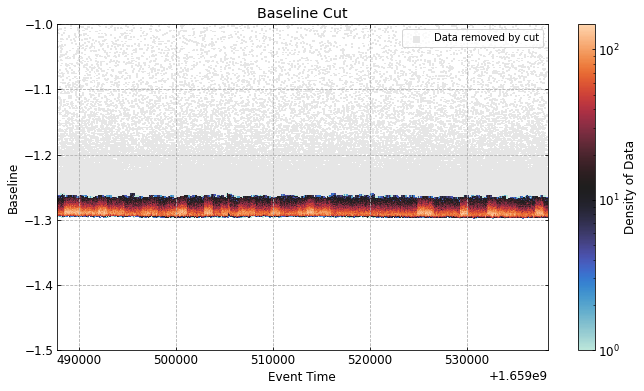

In [127]:
fig, ax = dp.densityplot(
    df_r19nos.eventtime,
    df_r19nos.baseline_CPDv21Ge*1e6,
    cut=cbaseline_r19nos,
    ylims=(-1.5,-1),
    plot_cut_data = True
    )
ax.set_xlabel('Event Time')
ax.set_ylabel('Baseline')
ax.set_title('Baseline Cut')

## Distribution 

1424598.832968636 1/V
0.0013204111520070123


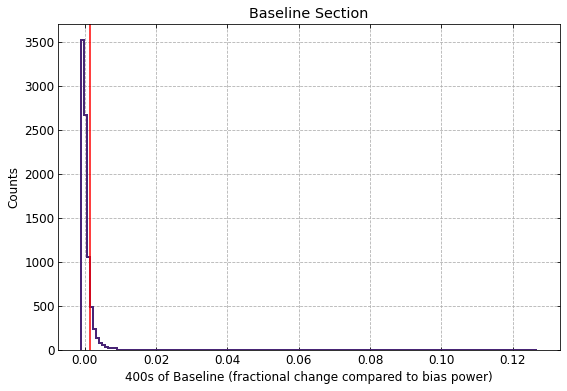

In [130]:
# checking baseline gaussian distribution for tail location to confirm percentage choice
# looking at scale in fractional change to bias power
#-1/i0[A]*(Rsh[Ohms]-R0[Ohms]
start_time=df_r19nos.eventtime[ctrigger_r19nos].iloc[0]
dIdP_zero = -1/(10.968e-6*((4+5)*1e-3-73e-3))#1/V
P0  =  8.78e-12
print(dIdP_zero, "1/V")
i=4
binsize1 = 400
ctime_temp_plotting = dp.inrange(df_r19nos.eventtime,(binsize1*i)+start_time,(binsize1*(i+1))+start_time)
cut_value_plotting=np.percentile(df_r19nos.baseline_CPDv21Ge[ctime_temp_plotting],85)
fig, ax = dp.hist(
    (df_r19nos.baseline_CPDv21Ge+1.28e-6)/dIdP_zero/P0,
    cuts=ctime_temp_plotting,
    lgcrawdata=False,
    #xlims=(-0.04e-6/dIdP_zero/P0,0.05e-6/dIdP_zero/P0),
    labeldict = {'title' : 'Baseline Section',
                'xlabel' : '400s of Baseline (fractional change compared to bias power)',
                'ylabel' : 'Counts',
                },
    lgclegend=False,
    nbins=150
)
ax.set_yscale('linear')
ax.axvline((cut_value_plotting+1.28e-6)/dIdP_zero/P0,color='red')
print((cut_value_plotting+1.28e-6)/dIdP_zero/P0)

## r18 fe55

In [10]:
#more rigorous baseline cut
#binning the event time into 400s bins and then finding baseline cut that cuts 10% of high end of baseline in each bin
import math
start_time=df_r18fe.eventtime[ctrigger_r18fe].iloc[0]
binsize=400 #size in seconds of each bin used to partition eventtime for baseline cutting
binnumber=tot_runtime_r18fe/binsize

cbaseline_list=np.empty(math.ceil(binnumber),dtype='object')

for i in range(math.floor(binnumber)):
    ctime_temp = dp.inrange(df_r18fe.eventtime,(binsize*i)+start_time,(binsize*(i+1))+start_time)
    cut_value=np.percentile(df_r18fe.baseline_CPDv21Ge[ctime_temp],82)
    cbaseline_list[i]=dp.inrange(df_r18fe.baseline_CPDv21Ge,-np.inf,cut_value)&ctime_temp

if math.floor(binnumber)!=math.ceil(binnumber): #this fills in the cut for the last time bin, which isn't the full length of the other time bins unless your bin size perfectly divides your total time 
    ctime_temp=dp.inrange(df_r18fe.eventtime,(binsize*math.floor(binnumber))+start_time,start_time+tot_runtime_r18fe)
    cut_value=np.percentile(df_r18fe.baseline_CPDv21Ge[ctime_temp],82)
    cbaseline_list[-1]=dp.inrange(df_r18fe.baseline_CPDv21Ge,-np.inf,cut_value)&ctime_temp

In [11]:
#more rigorous baseline cut
cbaseline_r18fe=cbaseline_list[0]
for i in range(len(cbaseline_list)):
    cbaseline_r18fe=cbaseline_r18fe|cbaseline_list[i] #this takes all the baseline cuts from the previous step and bitwise ORs them into one cut


Text(0.5, 1.0, 'Baseline Cut')

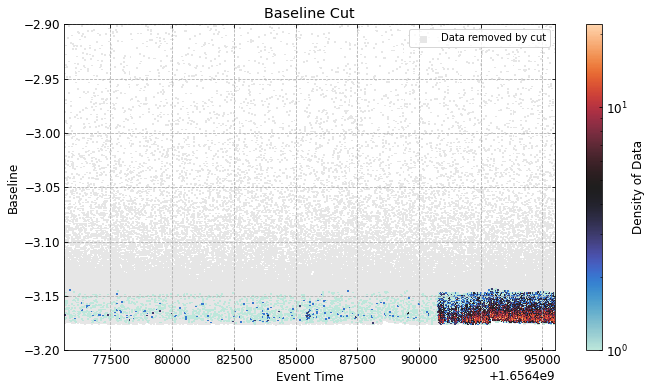

In [130]:
fig, ax = dp.densityplot(
    df_r18fe.eventtime,
    df_r18fe.baseline_CPDv21Ge*1e6,
    cut=cbaseline_r18fe&ctemp_lowpopr18,
    ylims=(-3.2,-2.9),
    plot_cut_data = True
    )
ax.set_xlabel('Event Time')
ax.set_ylabel('Baseline')
ax.set_title('Baseline Cut')

## Distribution

In [ ]:
# checking baseline gaussian distribution for tail location to confirm percentage choice
# looking at scale in fractional change to bias power
#-1/i0[A]*(Rsh[Ohms]-R0[Ohms]
start_time=df_r18fe.eventtime[ctrigger_r18fe].iloc[0]
dIdP_zero = -1/(11.132e-6*((4+5)*1e-3-73e-3))#1/V
P0  =  9.2e-12
print(dIdP_zero, "1/V")
i=4
binsize1 = 400
ctime_temp_plotting = dp.inrange(df_r18fe.eventtime,(binsize1*i)+start_time,(binsize1*(i+1))+start_time)
cut_value_plotting=np.percentile(df_r18fe.baseline_CPDv21Ge[ctime_temp_plotting],82)
fig, ax = dp.hist(
    (df_r18fe.baseline_CPDv21Ge+3.17e-6)/dIdP_zero/P0,
    cuts=ctime_temp_plotting,
    lgcrawdata=False,
    #xlims=(-0.04e-6/dIdP_zero/P0,0.05e-6/dIdP_zero/P0),
    labeldict = {'title' : 'Baseline Section',
                'xlabel' : '400s of Baseline (fractional change compared to bias power)',
                'ylabel' : 'Counts',
                },
    lgclegend=False,
    nbins=150
)
ax.set_xlim(-0.005, 0.05)
ax.set_yscale('linear')
ax.axvline((cut_value_plotting+3.17e-6)/dIdP_zero/P0,color='red')
print((cut_value_plotting+3.17e-6)/dIdP_zero/P0)

## run19 Ba

In [12]:
start_time=df_r19Ba.eventtime[ctrigger_r19Ba].iloc[0]
binsize=400 #size in seconds of each bin used to partition eventtime for baseline cutting
binnumber=tot_runtime_r19Ba/binsize

cbaseline_list_r19Ba=np.empty(math.ceil(binnumber),dtype='object')

for i in range(math.floor(binnumber)):
    ctime_temp = dp.inrange(df_r19Ba.eventtime,(binsize*i)+start_time,(binsize*(i+1))+start_time)
    cut_value=np.percentile(df_r19Ba.baseline_CPDv21Ge[ctime_temp],85)
    cbaseline_list_r19Ba[i]=dp.inrange(df_r19Ba.baseline_CPDv21Ge,-np.inf,cut_value)&ctime_temp

if math.floor(binnumber)!=math.ceil(binnumber): #this fills in the cut for the last time bin, which isn't the full length of the other time bins unless your bin size perfectly divides your total time 
    ctime_temp=dp.inrange(df_r19Ba.eventtime,(binsize*math.floor(binnumber))+start_time,start_time+tot_runtime_r19Ba)
    cut_value=np.percentile(df_r19Ba.baseline_CPDv21Ge[ctime_temp],85)
    cbaseline_list_r19Ba[-1]=dp.inrange(df_r19Ba.baseline_CPDv21Ge,-np.inf,cut_value)&ctime_temp

In [13]:
#more rigorous baseline cut
cbaseline_r19Ba=cbaseline_list_r19Ba[0]
for i in range(len(cbaseline_list_r19Ba)):
    cbaseline_r19Ba=cbaseline_r19Ba|cbaseline_list_r19Ba[i] #this takes all the baseline cuts from the previous step and bitwise ORs them into one cut


# Energy dependent Chi2 cut

## r19 nos

In [14]:
m_strict = 70
b_strict = 26000

m_loose = 1e3
b_loose = 54000 

m_loose2 = 900
b_loose2 = 90000

x_loose_fittingcalib2=np.arange(50,120,0.1)
x_loose_fittingcalib=np.arange(20,50,0.1)
x_fitting_strictcalb = np.arange(0,20,0.1)

y_loose_parabcalib2=b_loose2+m_loose2*(x_loose_fittingcalib2-50)**2 
y_loose_parabcalib=b_loose+m_loose*(x_loose_fittingcalib-20) 
y_strict_parabcalib = b_strict+m_strict*x_fitting_strictcalb**2

temp_func = lambda x, m, b: m * x**2 + b
temp_func2 = lambda x, m, b: m * (x-50)**2 + b
temp_func3 = lambda x, m, b: m * (x-20) + b


#ctemp_strict = (((df.ofchi2_unconstrained_CPDv21Ge < temp_func(calibratedofamp_uncon, m_strict, b_strict)))&
#            dp.inrange(calibratedofamp_uncon,0,37))


In [15]:
delf = fs/25000 #the digitization rate divided by sample rate, this is tracelength? 
lowfreqmean = (51889/delf)*2 #mean of lowfreqchi2 will be the # of bins to fcutoff, div # of bins, sqred
sigchi = np.sqrt(2*lowfreqmean) #variance/std dev of the lowfreqmean 
print(sigchi)

64.42918593308471


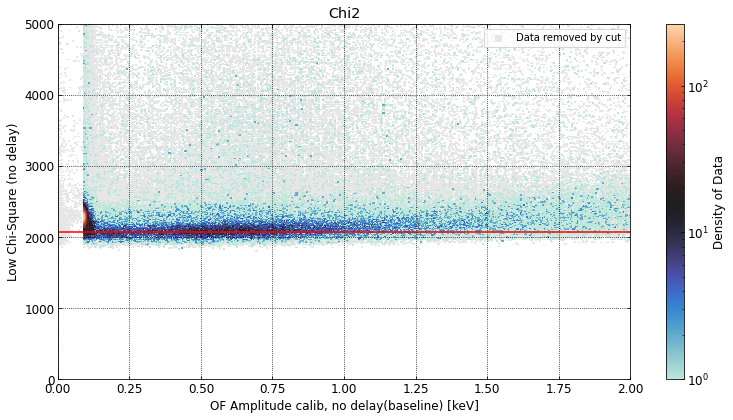

In [134]:
#checking the fit of our amplitudes v chi2
#a "good" fit against chi2 will be about ~ number of bins
fig, ax = dp.densityplot(
    calibratedofamp_r19nos_nodelay,
    df_r19nos.ofchi2low_nodelay_CPDv21Ge,
    cut=ctrigger_r19nos&cgoodtime_r19nosv2&cbaseline_r19nos,
    ylims=[0, 5e3],
    xlims=[0, 2],
    plot_cut_data = True,
    #basecut = ctrigger&cgoodtime&cbaseline,
)

ax.set_title('Chi2')
ax.set_ylabel(r'Low Chi-Square (no delay)')
ax.set_xlabel(r'OF Amplitude calib, no delay(baseline) [keV]')
ax.tick_params(which='both', direction='in', top=True, right=True)
ax.grid(b=True, linestyle='dotted', color='k', zorder=10)

ax.axhline((fs*tracelength),c='r')
ax.axhline(lowfreqmean, c='r')

fig.tight_layout()
'''
fig.savefig(
    '/data/users/da_real_maggie_reed/analysis/run_20/figs/.png',
    dpi=500,
    facecolor='none',
)
#''';
#c_goodevents_r19nos = cgoodtime_r19nosv2&cbaseline_r19nos&cchi2_temp_r19nos

In [16]:
#keeping everything above 110 kev
conetwentyup = dp.inrange(calibratedofamp_r19nos_constrained,120,np.inf)
#csixty_110 = dp.inrange(calibratedofamp_constrained,60,110)
cchi2_strict = (((df_r19nos.ofchi2_constrained_CPDv21Ge < temp_func(calibratedofamp_r19nos_constrained,
                                                             m_strict, b_strict)))&
            dp.inrange(calibratedofamp_r19nos_constrained,-np.inf,20))
cchi2_strict2 = (((df_r19nos.ofchi2_constrained_CPDv21Ge < temp_func3(calibratedofamp_r19nos_constrained,
                                                             m_loose, b_loose)))&
            dp.inrange(calibratedofamp_r19nos_constrained,20,50))
cchi2_strict3 = (((df_r19nos.ofchi2_constrained_CPDv21Ge < temp_func2(calibratedofamp_r19nos_constrained,
                                                             m_loose2, b_loose2)))&
            dp.inrange(calibratedofamp_r19nos_constrained,50,120))
cchi2_temp_r19nos = ((cchi2_strict | cchi2_strict2 | cchi2_strict3) | conetwentyup)


## r18 fe55

In [17]:
m1_strict = 20
b1_strict = 26200

m_loose = 100
b_loose = 26200 

x_loose_fittingcalib=np.arange(0,80,0.1)
x_fitting_strictcalb = np.arange(0,39,0.1)
y_loose_parabcalib_low=b_loose+m_loose*x_loose_fittingcalib**2 
y_strict_parabcalib = b1_strict+m1_strict*x_fitting_strictcalb**2
temp_func = lambda x, m, b: m * x**2 + b

cchi2_r181=((df_r18fe.ofchi2_constrained_CPDv21Ge) < 
                           (temp_func(calibratedofamp_r18fe_constrained,
                           m_loose,b_loose))) & dp.inrange(calibratedofamp_r18fe_constrained,-np.inf,80)
cchi2_r182 = dp.inrange(calibratedofamp_r18fe_constrained, 80, np.inf)

cchi2_temp_r18fe = cchi2_r181 | cchi2_r182

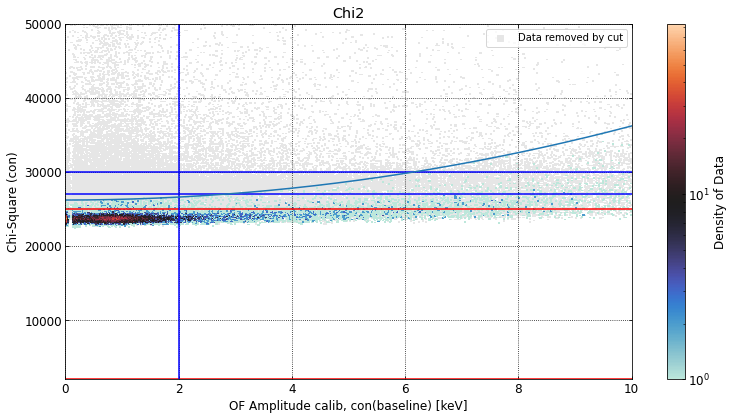

In [162]:
#checking the fit of our amplitudes v chi2
#a "good" fit against chi2 will be about ~ number of bins
fig, ax = dp.densityplot(
    calibratedofamp_r18fe_constrained,
    df_r18fe.ofchi2_constrained_CPDv21Ge,
    cut=c_goodevents_r18fe,
    ylims=[2e3, 5e4],
    xlims=[0, 10],
    plot_cut_data = True,
    #basecut = ctrigger&cgoodtime&cbaseline,
)

ax.set_title('Chi2')
ax.set_ylabel(r'Chi-Square (con)')
ax.set_xlabel(r'OF Amplitude calib, con(baseline) [keV]')
ax.tick_params(which='both', direction='in', top=True, right=True)
ax.grid(b=True, linestyle='dotted', color='k', zorder=10)

ax.axhline((fs*tracelength),c='r')
ax.axhline(lowfreqmean, c='r')
ax.axhline(30000, c='b')
ax.axhline(27000, c='b')
ax.axvline(2, c='b')

ax.plot(x_loose_fittingcalib,y_loose_parabcalib_low)

fig.tight_layout()
'''
fig.savefig(
    '/data/users/da_real_maggie_reed/analysis/run_20/figs/.png',
    dpi=500,
    facecolor='none',
)
#''';

In [158]:
#this turned out to be some time dependent elevated noise
ctemp_lowpopr18 = (dp.inrange(df_r18fe.ofchi2_constrained_CPDv21Ge, 27000, 30000)&
                  dp.inrange(calibratedofamp_r18fe_constrained, -np.inf, 10))

# run19 Ba

In [18]:
temp_func = lambda x, m, b: m * x**2 + b
temp_func2 = lambda x, m, b: m * (x-50)**2 + b
temp_func3 = lambda x, m, b: m * (x-20) + b

m_strict = 70
b_strict = 26000

m_loose = 1e3
b_loose = 54000 

m_loose2 = 1200
b_loose2 = 90000

In [19]:
conetwentyup_r19Ba = dp.inrange(calibratedofamp_r19Ba_constrained,100,np.inf)
#csixty_110 = dp.inrange(calibratedofamp_constrained,60,110)
cchi2_strict_r19Ba = (((df_r19Ba.ofchi2_constrained_CPDv21Ge < temp_func(calibratedofamp_r19Ba_constrained,
                                                             m_strict, b_strict)))&
            dp.inrange(calibratedofamp_r19Ba_constrained,-np.inf,20))
cchi2_strict2_r19Ba = (((df_r19Ba.ofchi2_constrained_CPDv21Ge < temp_func3(calibratedofamp_r19Ba_constrained,
                                                             m_loose, b_loose)))&
            dp.inrange(calibratedofamp_r19Ba_constrained,20,50))
cchi2_strict3_r19Ba = (((df_r19Ba.ofchi2_constrained_CPDv21Ge < temp_func2(calibratedofamp_r19Ba_constrained,
                                                             m_loose2, b_loose2)))&
            dp.inrange(calibratedofamp_r19Ba_constrained,50,100))
cchi2_temp_r19Ba = ((cchi2_strict_r19Ba | cchi2_strict2_r19Ba | cchi2_strict3_r19Ba) | conetwentyup_r19Ba)


# Checking template fit to pulse shape

## Set up getrandevents

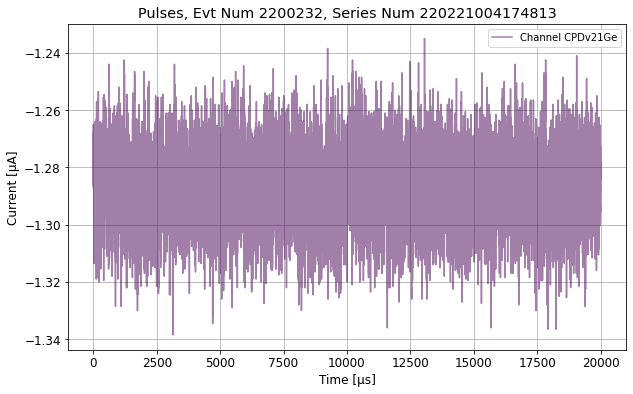

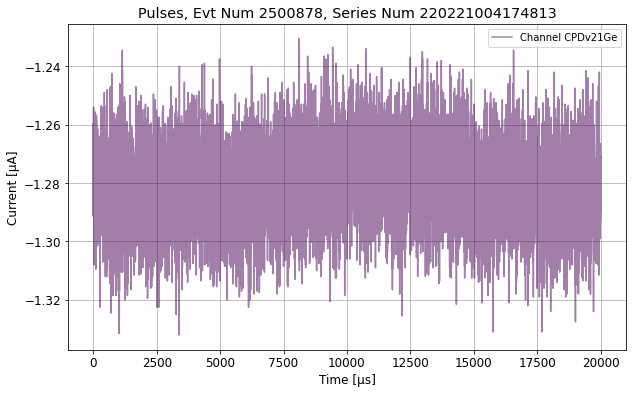

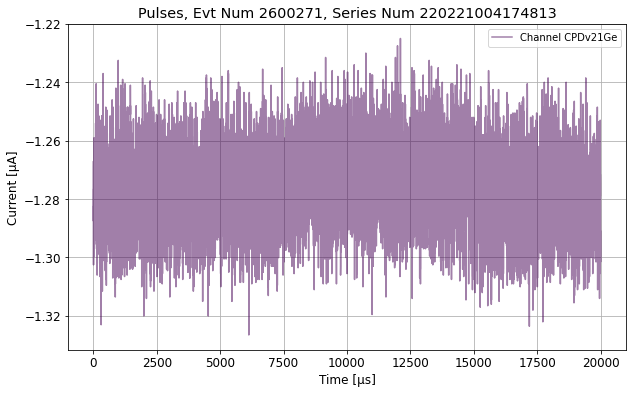

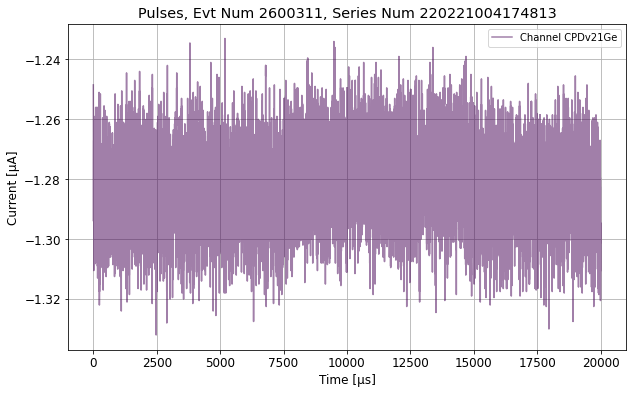

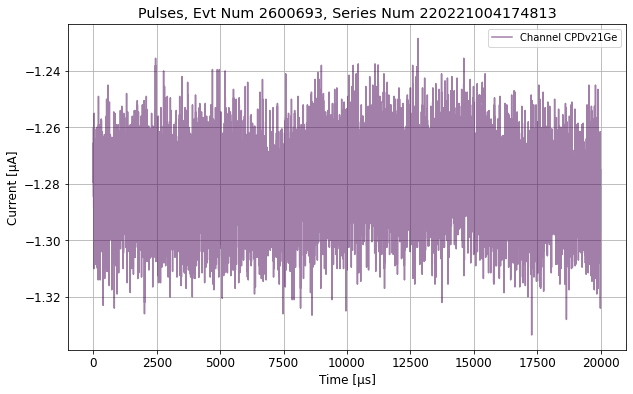

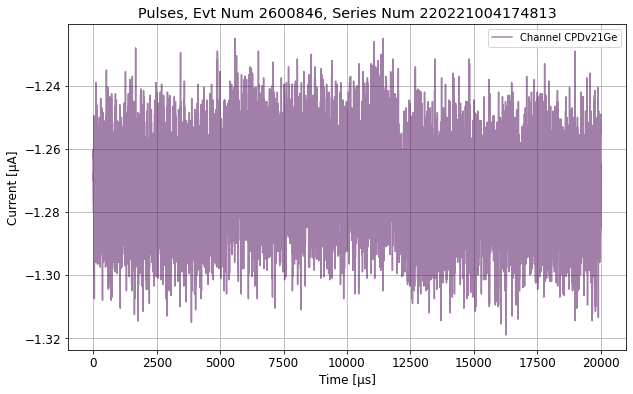

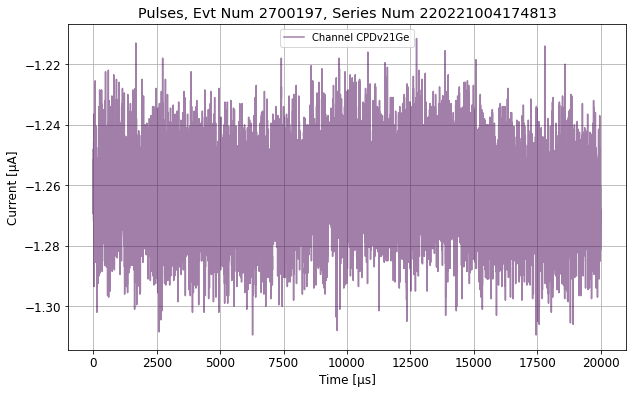

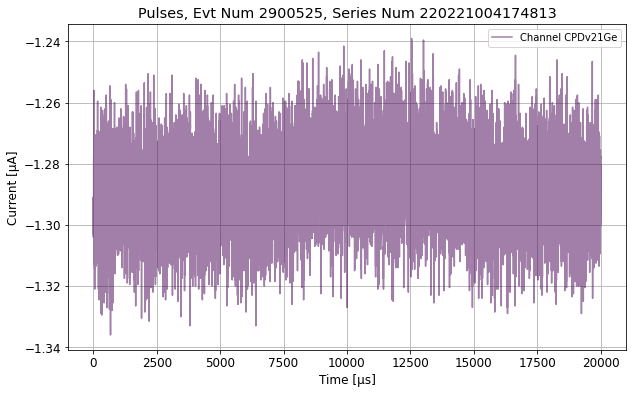

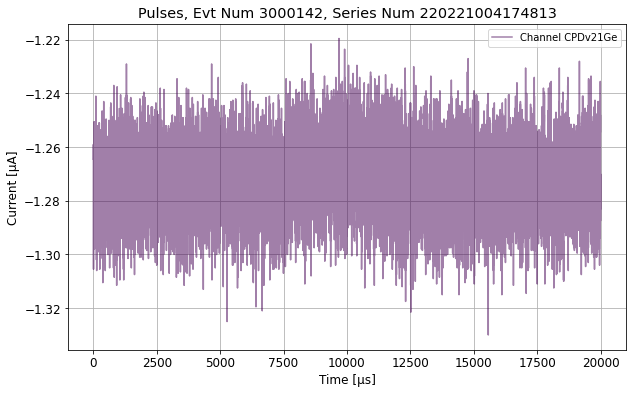

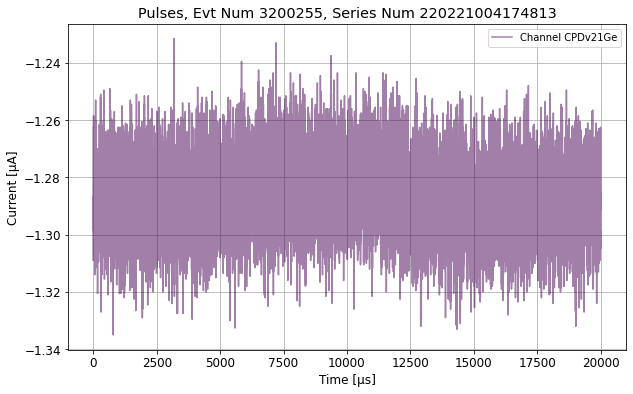

In [115]:
rands_lowpop = getrandevents(trigger_path,
    df_r19nos.eventnumber,
    df_r19nos.seriesnumber,                    
    ntraces=100,
    nplot=10,
    channels=['CPDv21Ge'],
    cut=c_goodevents_r19nos&ctemp_r19nos_lowpop,
    lgcplot=True)

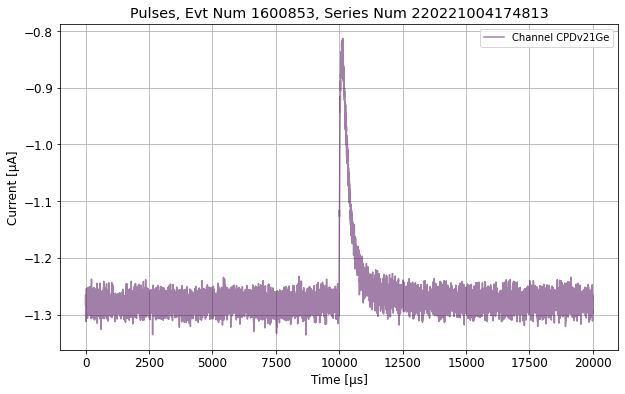

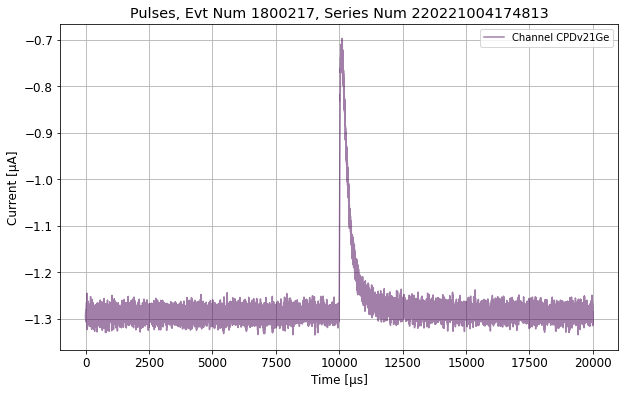

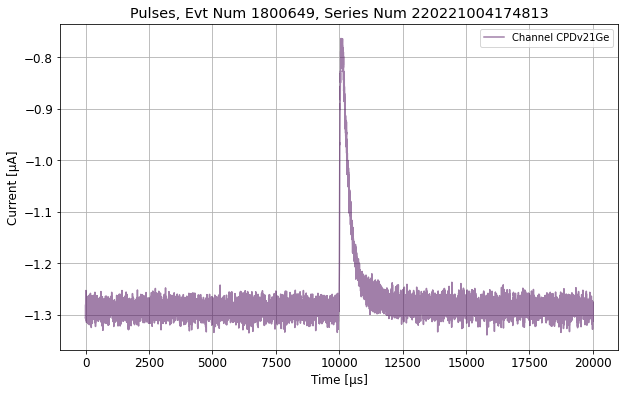

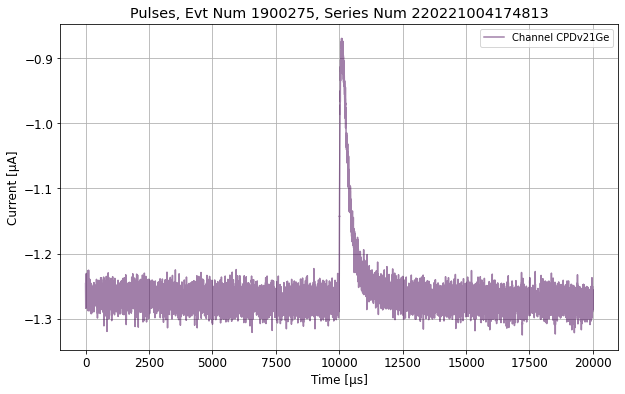

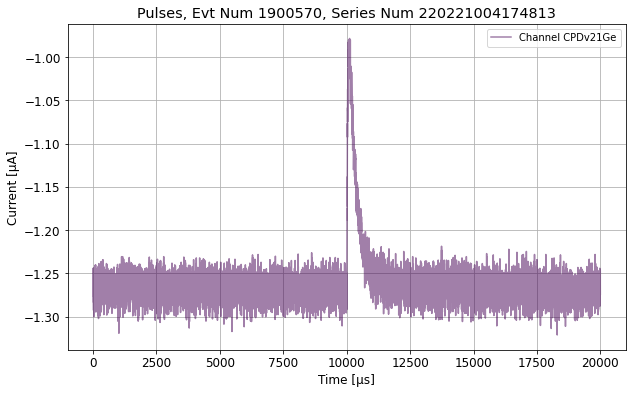

...

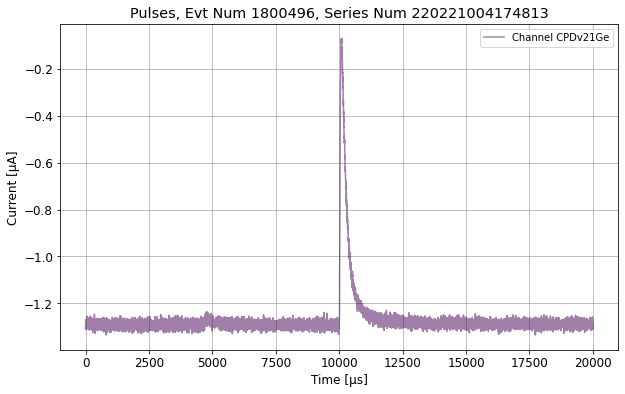

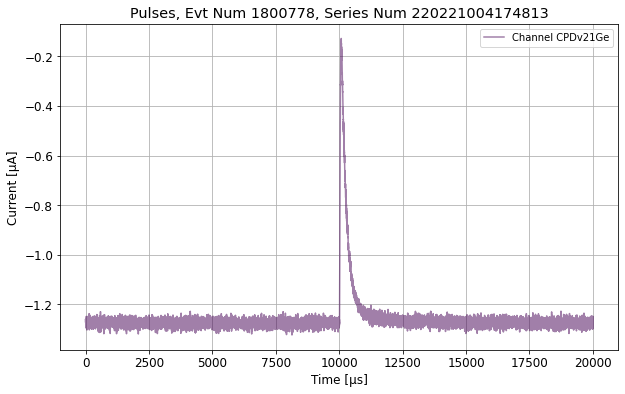

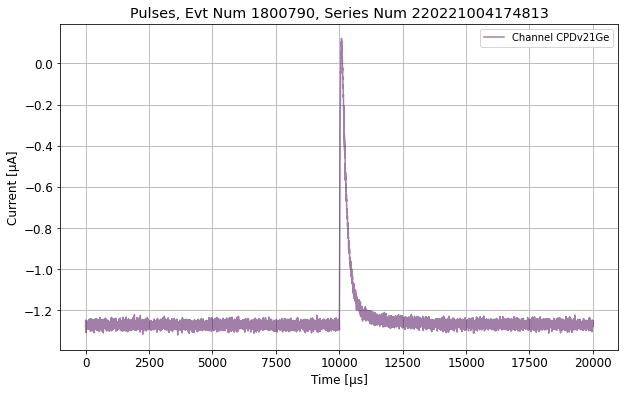

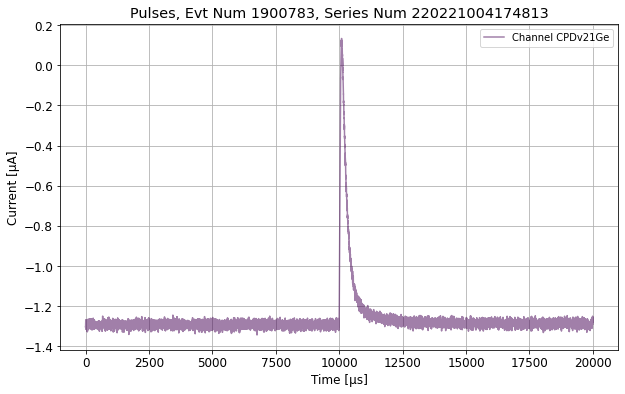

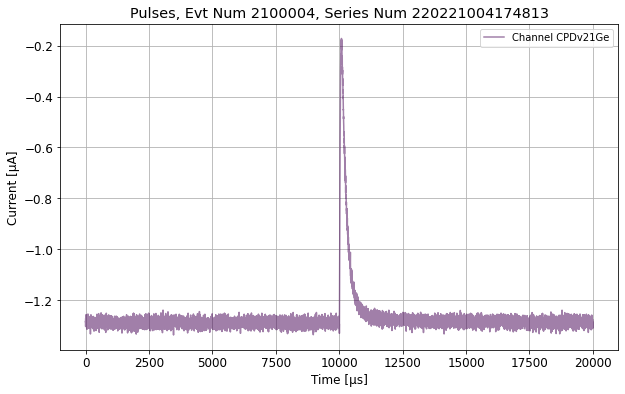

In [29]:
#ctemp_splitpop -> the suspected gaas population from the split ofamp v eabs
rands = getrandevents(trigger_path,
    df_r19nos.eventnumber,
    df_r19nos.seriesnumber,                    
    ntraces=100,
    nplot=10,
    channels=['CPDv21Ge'],
    cut=c_goodevents_r19nos&ctemp_r19nos_gaas,
    lgcplot=True)
#ctemp_splitpop2 -> the Ge distribution
rands2 = getrandevents(trigger_path,
    df_r19nos.eventnumber,
    df_r19nos.seriesnumber,                    
    ntraces=100,
    nplot=10,
    channels=['CPDv21Ge'],
    cut=c_goodevents_r19nos&ctemp_r19nos_ge,
    lgcplot=True)

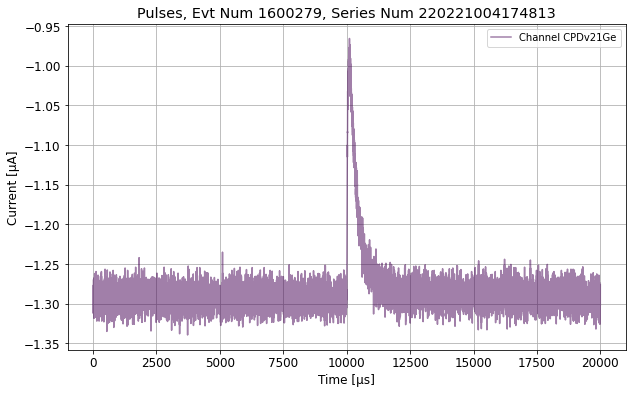

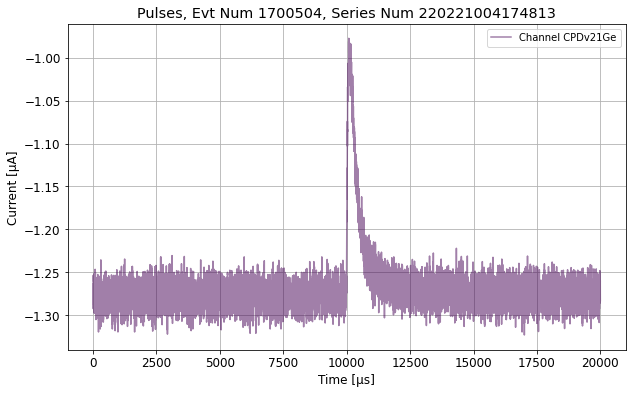

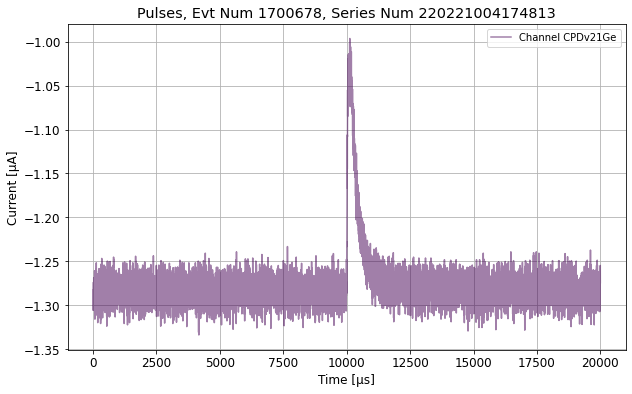

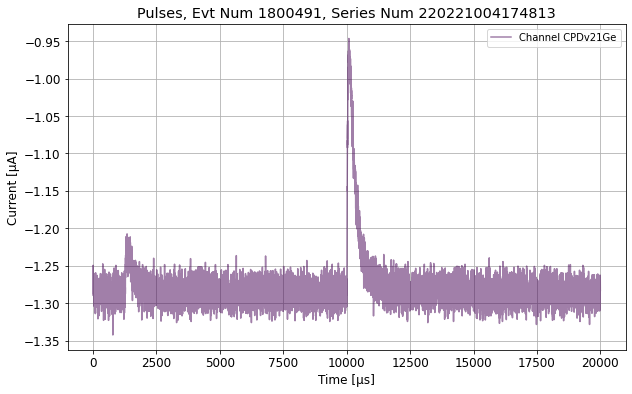

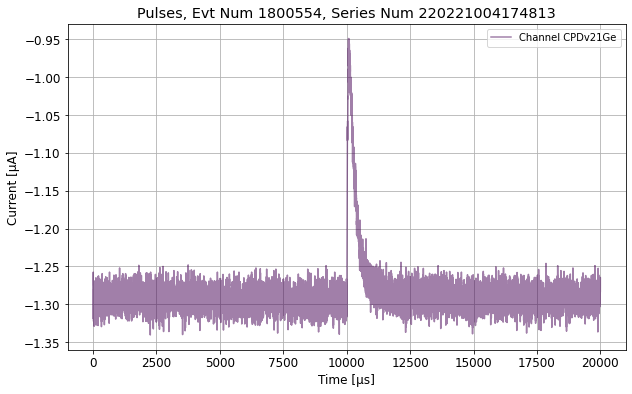

...

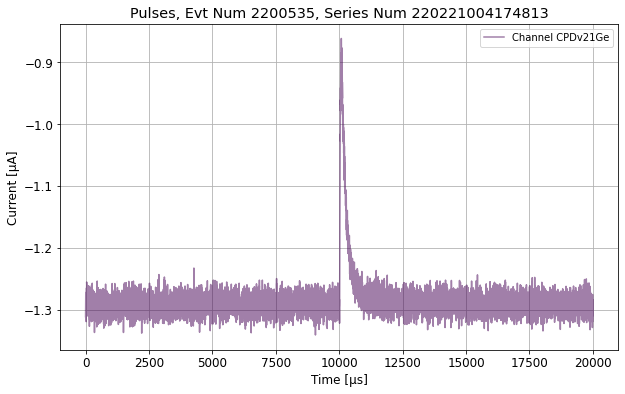

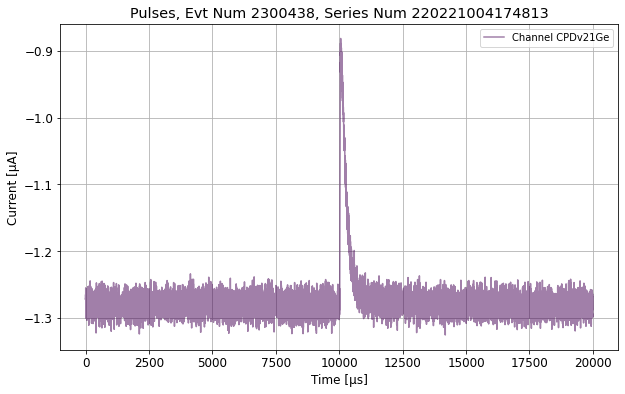

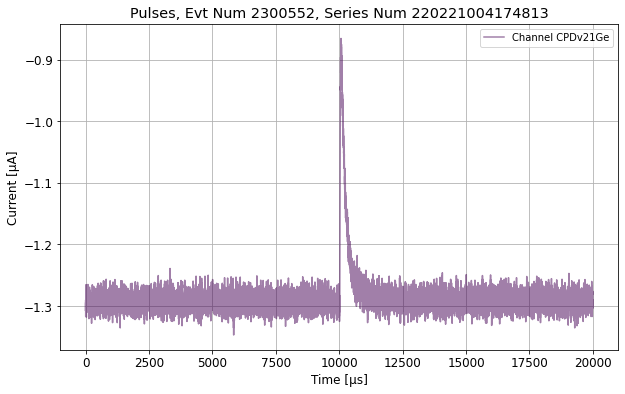

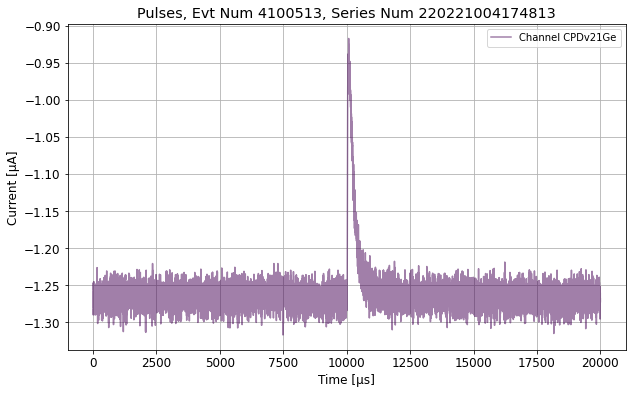

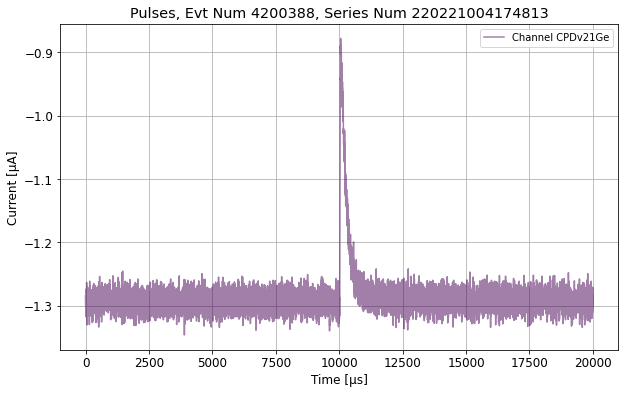

In [18]:
#selections from 4-5kev for each gaas and ge population
rands_gaas_4to5 = getrandevents(trigger_path,
    df.eventnumber,
    df.seriesnumber,                    
    ntraces=100,
    nplot=10,
    channels=['CPDv21Ge'],
    cut=ctrigger&cgoodtime&cbaseline&ctemp_splitpop_4to5,
    lgcplot=True)
#ctemp_splitpop2 -> the Ge distribution
rands_ge_4to5 = getrandevents(trigger_path,
    df.eventnumber,
    df.seriesnumber,                    
    ntraces=100,
    nplot=10,
    channels=['CPDv21Ge'],
    cut=ctrigger&cgoodtime&cbaseline&ctemp_splitpop2_4to5,
    lgcplot=True)

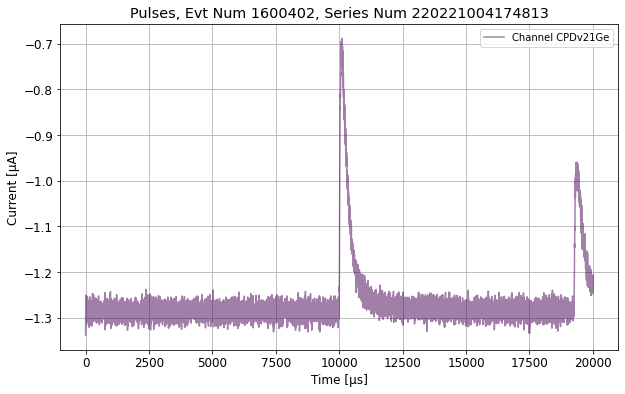

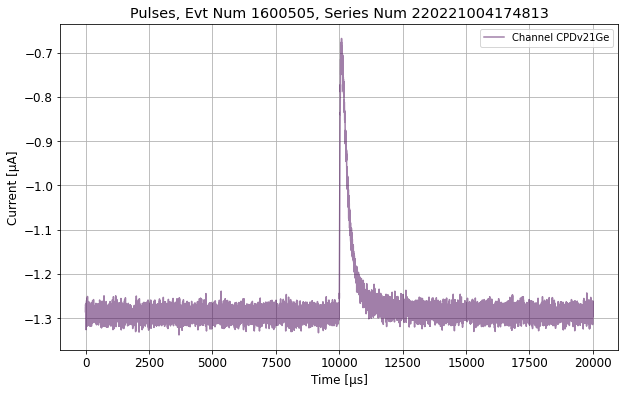

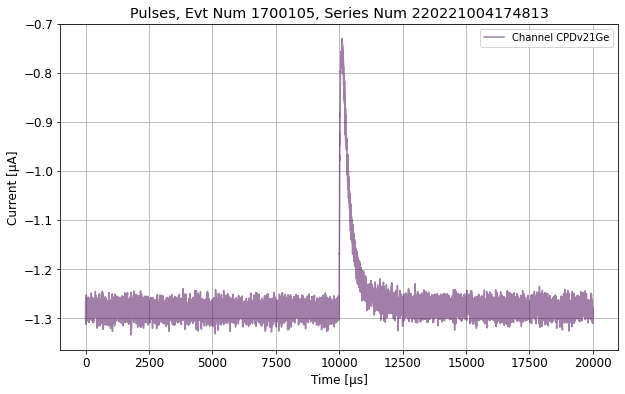

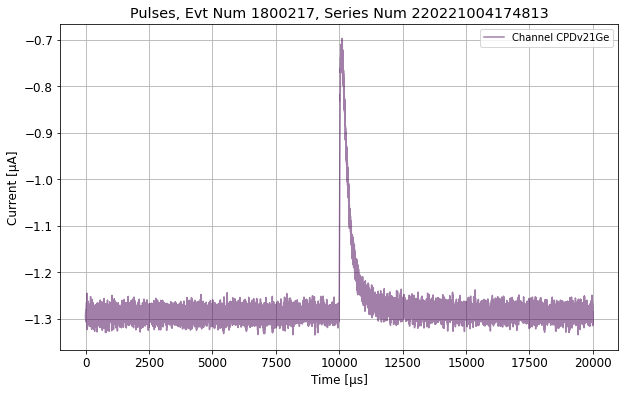

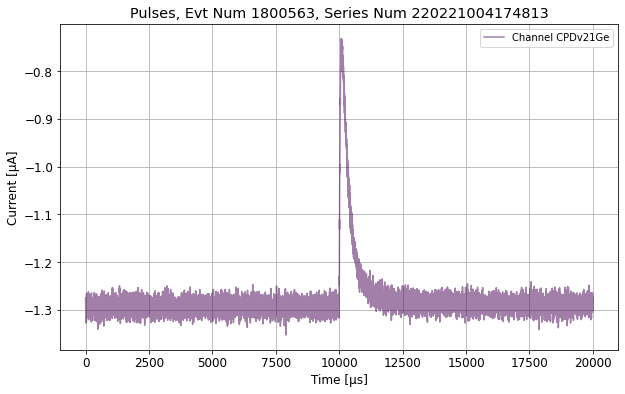

...

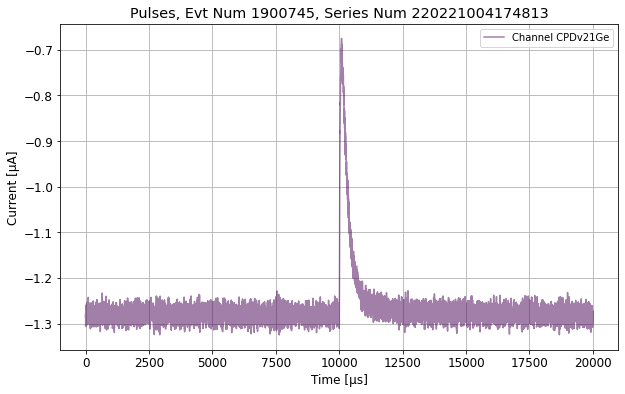

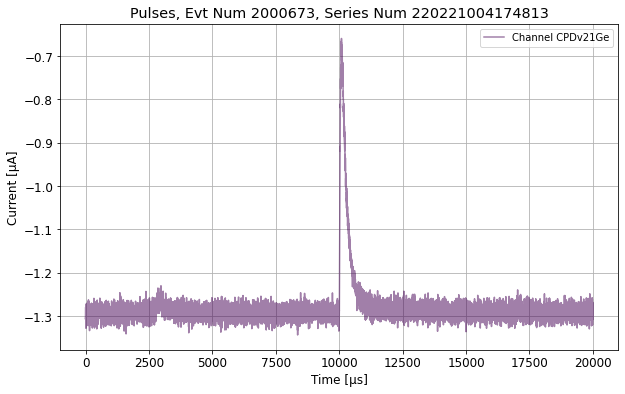

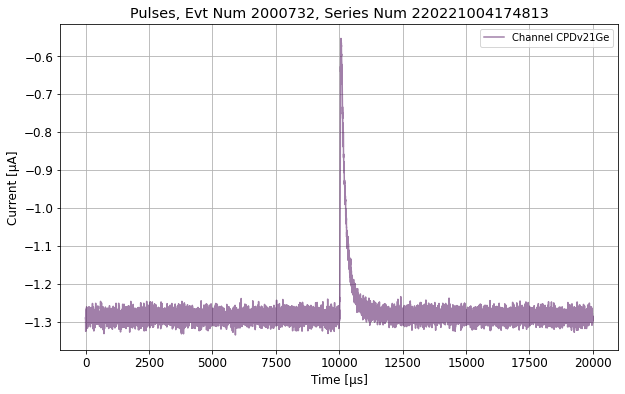

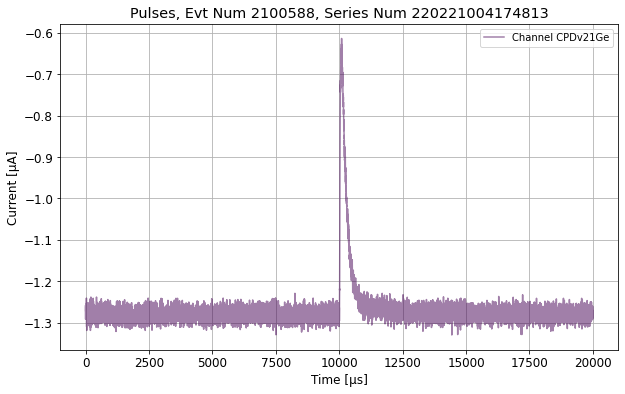

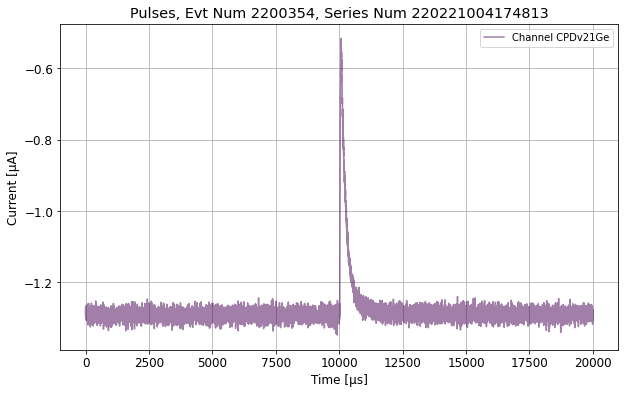

In [19]:
#selections from 8-9kev for each gaas and ge population
rands_gaas_8to9 = getrandevents(trigger_path,
    df.eventnumber,
    df.seriesnumber,                    
    ntraces=100,
    nplot=10,
    channels=['CPDv21Ge'],
    cut=ctrigger&cgoodtime&cbaseline&ctemp_splitpop_8to9,
    lgcplot=True)
#ctemp_splitpop2 -> the Ge distribution
rands_ge_8to9 = getrandevents(trigger_path,
    df.eventnumber,
    df.seriesnumber,                    
    ntraces=100,
    nplot=10,
    channels=['CPDv21Ge'],
    cut=ctrigger&cgoodtime&cbaseline&ctemp_splitpop2_8to9,
    lgcplot=True)

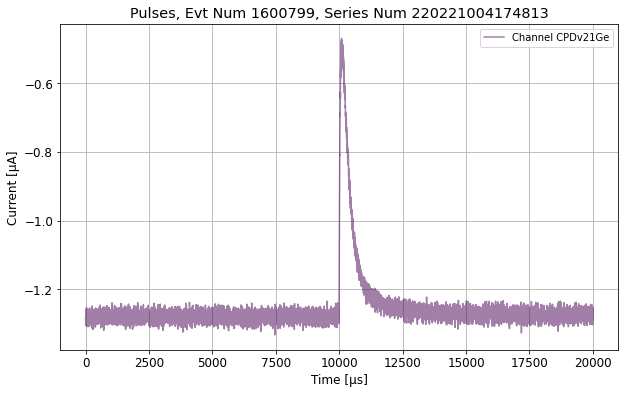

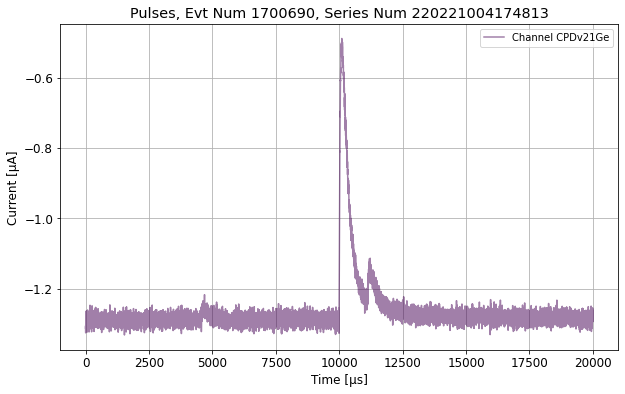

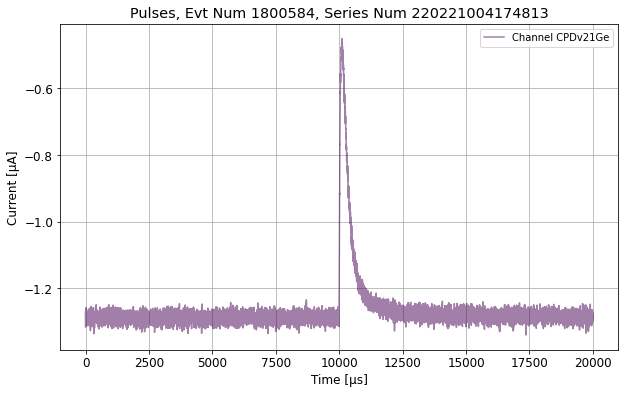

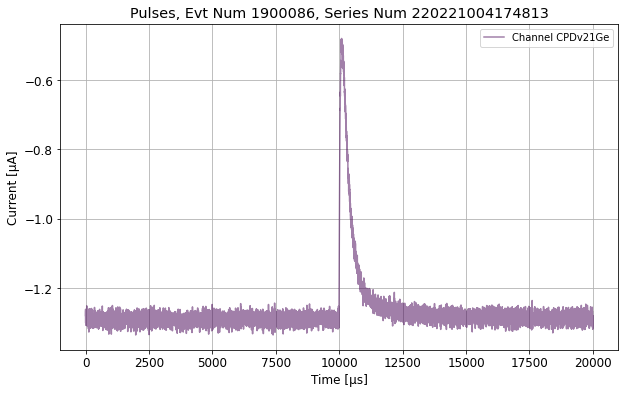

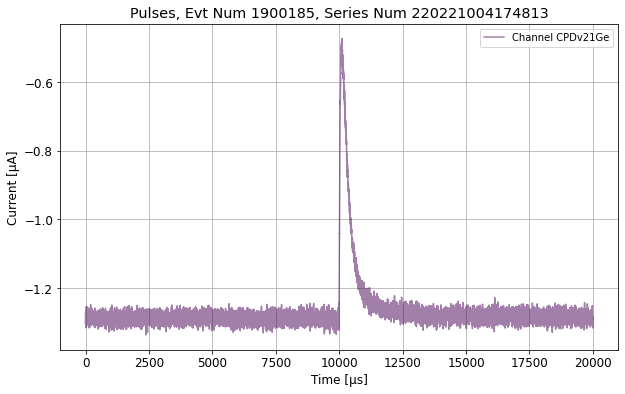

...

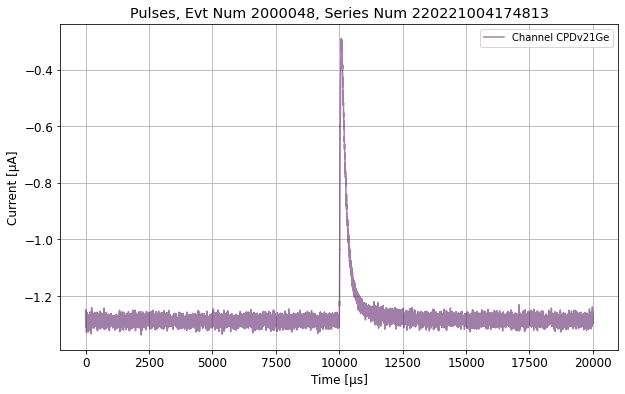

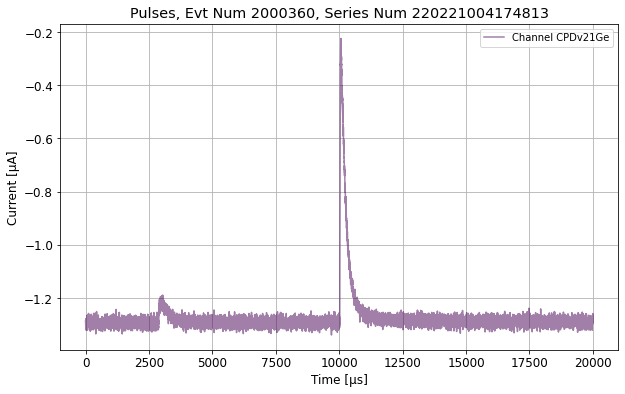

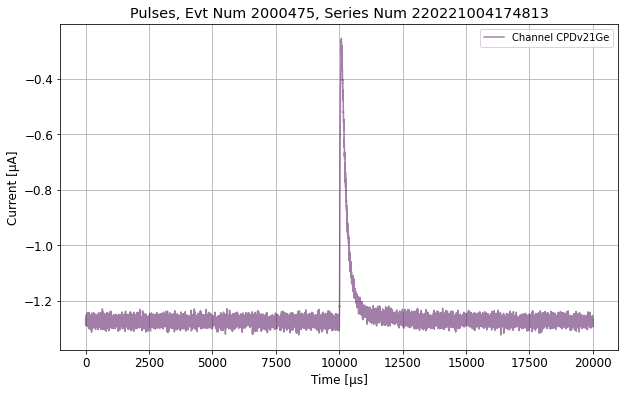

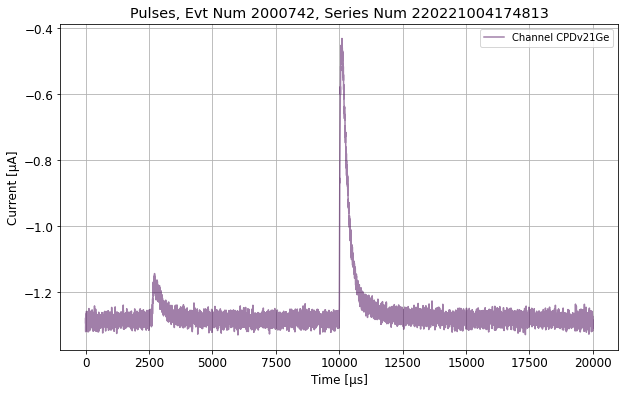

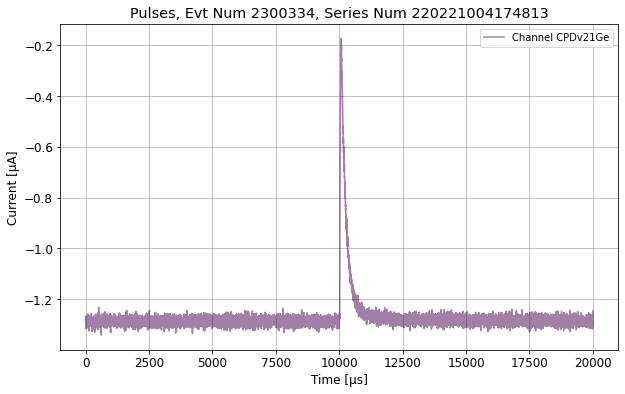

In [20]:
#selections from 12-13kev for each gaas and ge population
rands_gaas_12to13 = getrandevents(trigger_path,
    df.eventnumber,
    df.seriesnumber,                    
    ntraces=100,
    nplot=10,
    channels=['CPDv21Ge'],
    cut=ctrigger&cgoodtime&cbaseline&ctemp_splitpop_12to13,
    lgcplot=True)
#ctemp_splitpop2 -> the Ge distribution
rands_ge_12to13 = getrandevents(trigger_path,
    df.eventnumber,
    df.seriesnumber,                    
    ntraces=100,
    nplot=10,
    channels=['CPDv21Ge'],
    cut=ctrigger&cgoodtime&cbaseline&ctemp_splitpop2_12to13,
    lgcplot=True)

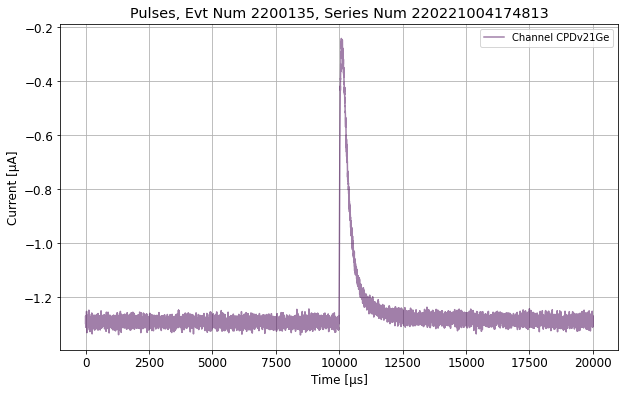

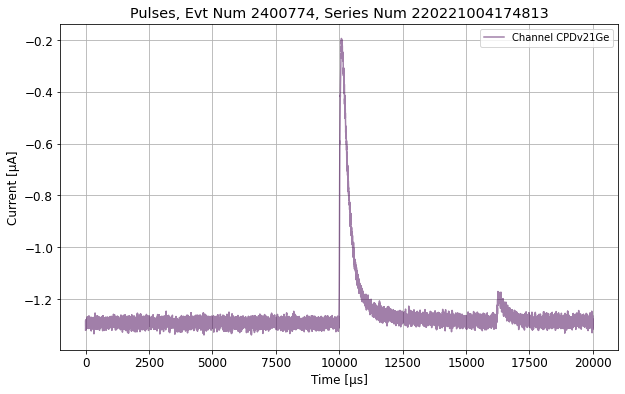

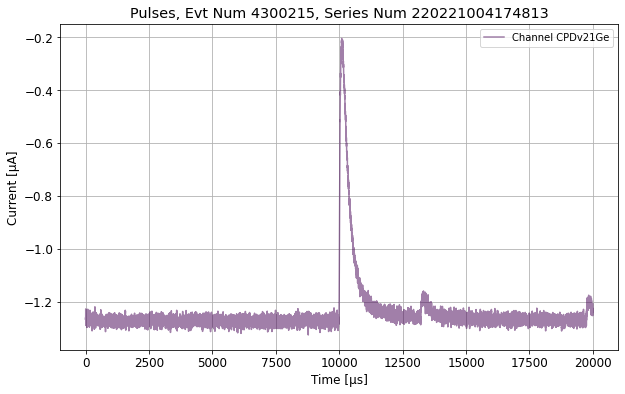

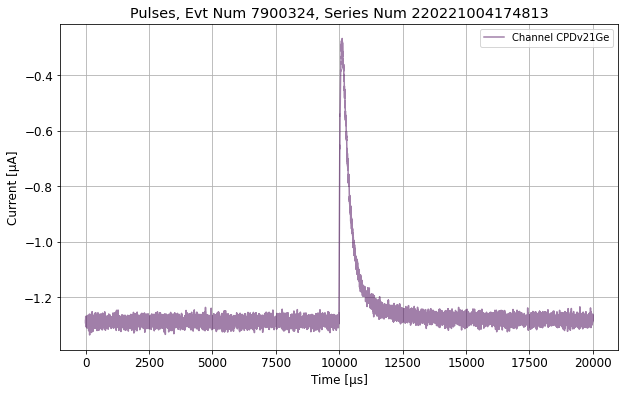

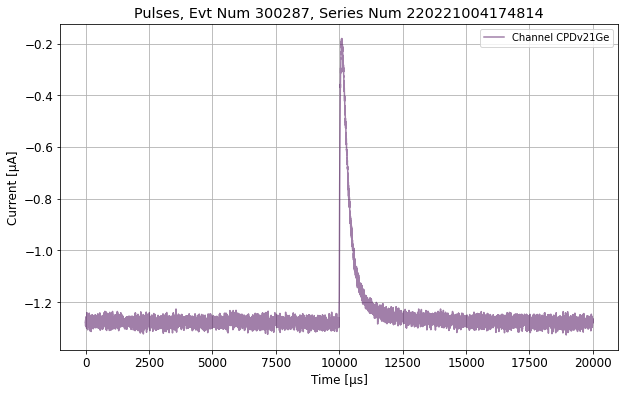

...

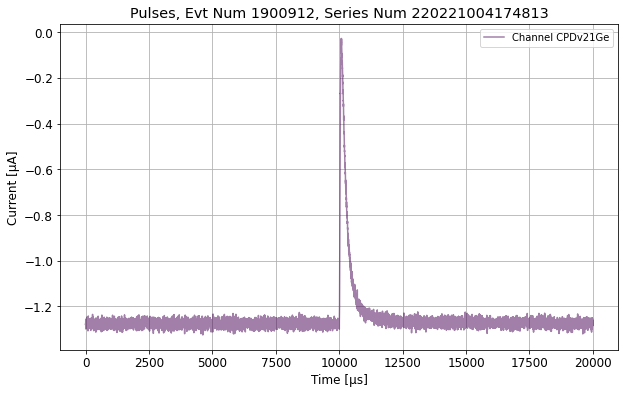

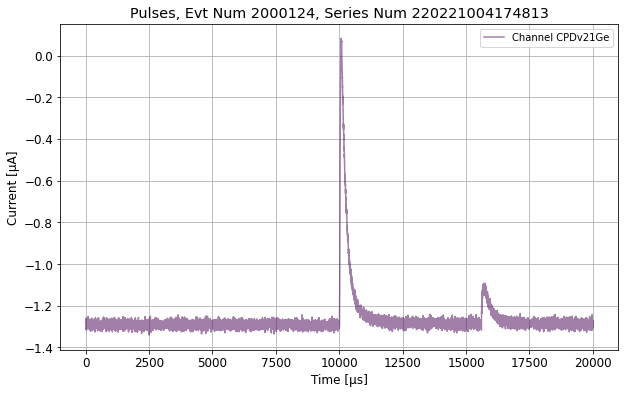

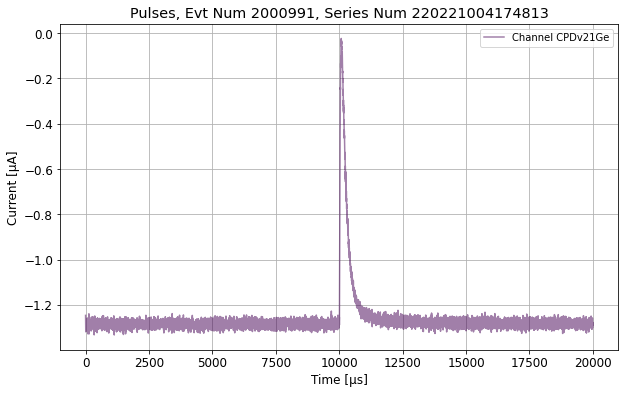

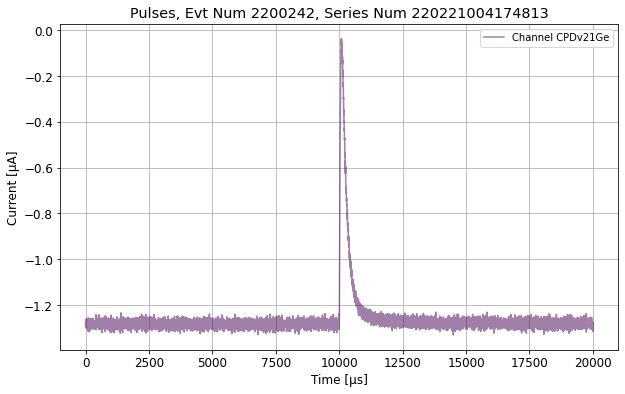

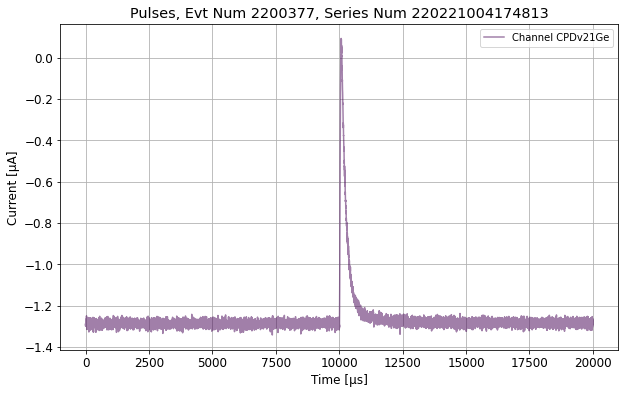

In [21]:
#selections from 16-17kev for each gaas and ge population
rands_gaas_16to17 = getrandevents(trigger_path,
    df.eventnumber,
    df.seriesnumber,                    
    ntraces=100,
    nplot=10,
    channels=['CPDv21Ge'],
    cut=ctrigger&cgoodtime&cbaseline&ctemp_splitpop_16to17,
    lgcplot=True)
#ctemp_splitpop2 -> the Ge distribution
rands_ge_16to17 = getrandevents(trigger_path,
    df.eventnumber,
    df.seriesnumber,                    
    ntraces=100,
    nplot=10,
    channels=['CPDv21Ge'],
    cut=ctrigger&cgoodtime&cbaseline&ctemp_splitpop2_16to17,
    lgcplot=True)

In [22]:
#grabbing the x,t,cut
#t,x are the gaas grabbed events
t_gaas_4to5 = rands_gaas_4to5[0]
x_gaas_4to5 = rands_gaas_4to5[1]
cout_gaas4to5 = rands_gaas_4to5[2]
lowpassed_gaas4to5 = qp.utils.lowpassfilter(x_gaas_4to5)
#t2,x2 are the ge grabbed events
t_ge_4to5 = rands_ge_4to5[0]
x_ge_4to5 = rands_ge_4to5[1]
cout_ge_4to5 = rands_ge_4to5[2]
lowpassed_ge_4to5 = qp.utils.lowpassfilter(x_ge_4to5)

In [23]:
#grabbing the x,t,cut
#t,x are the gaas grabbed events
t_gaas_8to9 = rands_gaas_8to9[0]
x_gaas_8to9 = rands_gaas_8to9[1]
cout_gaas8to9 = rands_gaas_8to9[2]
lowpassed_gaas8to9 = qp.utils.lowpassfilter(x_gaas_8to9)
#t2,x2 are the ge grabbed events
t_ge_8to9 = rands_ge_8to9[0]
x_ge_8to9 = rands_ge_8to9[1]
cout_ge_8to9 = rands_ge_8to9[2]
lowpassed_ge_8to9 = qp.utils.lowpassfilter(x_ge_8to9)

In [24]:
#grabbing the x,t,cut
#t,x are the gaas grabbed events
t_gaas_12to13 = rands_gaas_12to13[0]
x_gaas_12to13 = rands_gaas_12to13[1]
cout_gaas12to13 = rands_gaas_12to13[2]
lowpassed_gaas12to13 = qp.utils.lowpassfilter(x_gaas_12to13)
#t2,x2 are the ge grabbed events
t_ge_12to13 = rands_ge_12to13[0]
x_ge_12to13 = rands_ge_12to13[1]
cout_ge_12to13 = rands_ge_12to13[2]
lowpassed_ge_12to13 = qp.utils.lowpassfilter(x_ge_12to13)

In [25]:
#grabbing the x,t,cut
#t,x are the gaas grabbed events
t_gaas_16to17 = rands_gaas_16to17[0]
x_gaas_16to17 = rands_gaas_16to17[1]
cout_gaas16to17 = rands_gaas_16to17[2]
lowpassed_gaas16to17 = qp.utils.lowpassfilter(x_gaas_16to17)
#t2,x2 are the ge grabbed events
t_ge_16to17 = rands_ge_16to17[0]
x_ge_16to17 = rands_ge_16to17[1]
cout_ge_16to17 = rands_ge_16to17[2]
lowpassed_ge_16to17 = qp.utils.lowpassfilter(x_ge_16to17)

In [30]:
#grabbing the x,t,cut
#t,x are the gaas grabbed events
t_gaas = rands[0]
x_gaas = rands[1]
cout_gaas = rands[2]
lowpassed_gaas = qp.utils.lowpassfilter(x_gaas)
#t2,x2 are the ge grabbed events
t_ge = rands2[0]
x_ge = rands2[1]
cout_ge = rands2[2]
lowpassed_ge = qp.utils.lowpassfilter(x_ge)

In [117]:
t_lowpop = rands_lowpop[0]
x_lowpop = rands_lowpop[1]
cout_lowpop = rands_lowpop[2]
lowpassed_lowpop = qp.utils.lowpassfilter(x_lowpop)

Text(0.5, 1.0, 'lpf pulses (low energy population)')

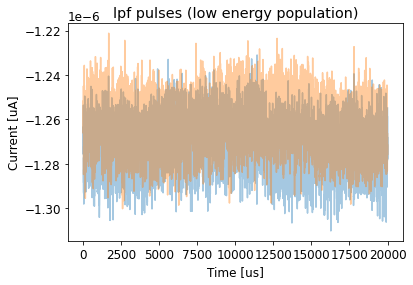

In [121]:
for xx in lowpassed_lowpop[5:7,0]:
    plt.plot(t_lowpop*1e6, xx, alpha=0.4)
plt.xlabel('Time [us]')
plt.ylabel('Current [uA]')
plt.title('lpf pulses (low energy population)')

## make plots

### 4-20kev

Text(0.5, 0, 'Time [us]')

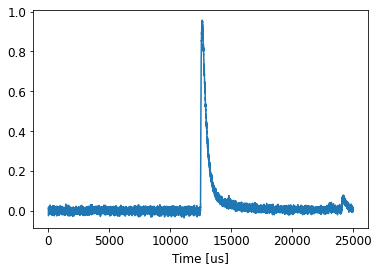

In [33]:
x_temp = np.zeros(x.shape)
for ii in range(x.shape[0]):
    ts = np.roll(x[ii,0],-int(df.oft0_constrained_CPDv21Ge[cout].iloc[ii]*fs))
    ts-= np.mean(ts[0:6000])
    x_temp[ii] = ts/ts.max()
plt.plot(x_avg_gaas[0])
plt.xlabel('Time [us]')

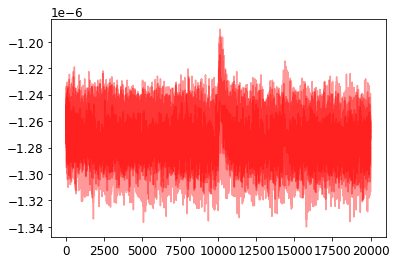

In [150]:
#plotting the template used to process vs the lower distribution trace
trace_number=4
for i in range(trace_number):
    plt.plot(t*1e6, x[i,0], color='r',alpha=0.4)


Text(0.5, 1.0, 'lpf pulses (low energy population)')

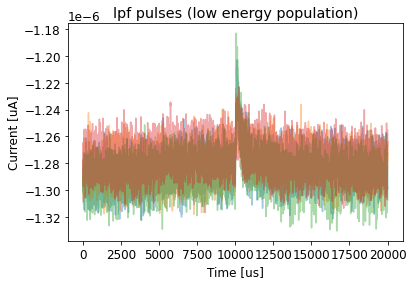

In [156]:
for xx in lowpassed[4:8,0]:
    plt.plot(t*1e6, xx, alpha=0.4)
plt.xlabel('Time [us]')
plt.ylabel('Current [uA]')
plt.title('lpf pulses (low energy population)')


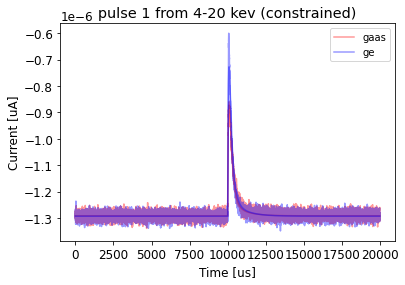

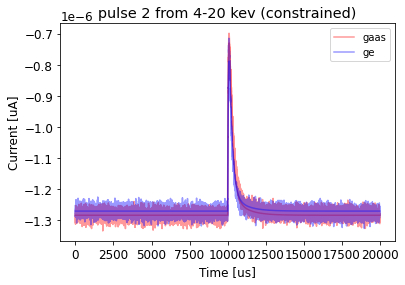

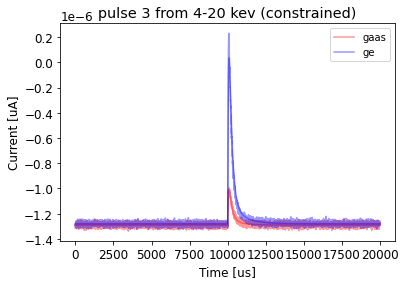

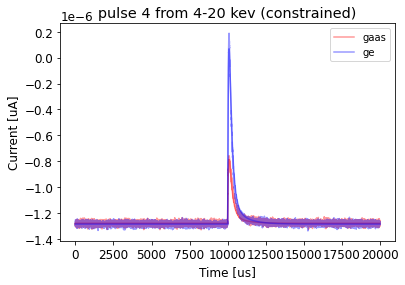

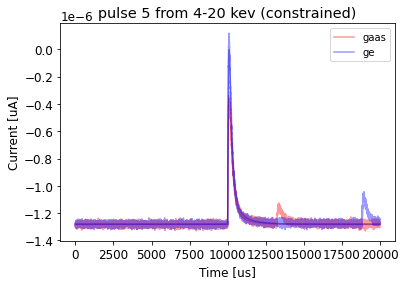

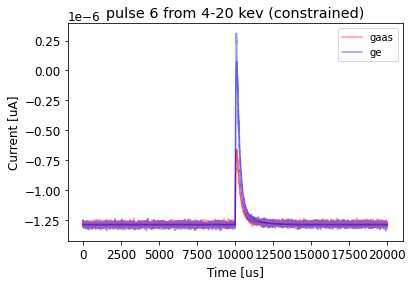

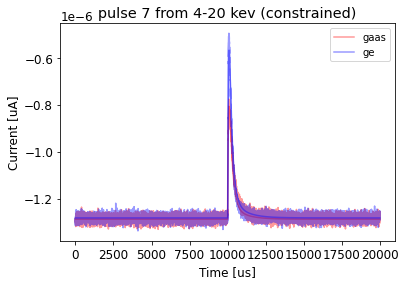

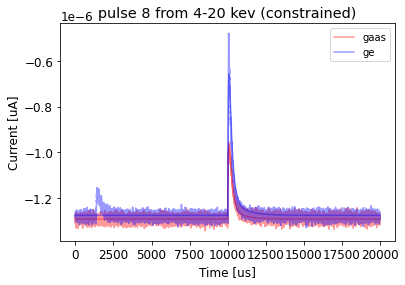

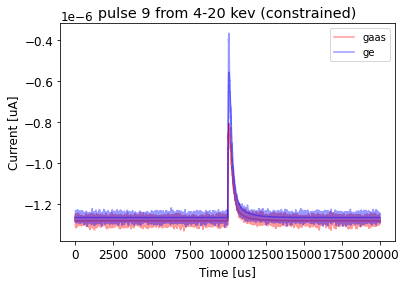

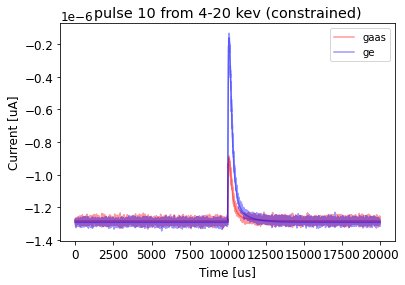

In [89]:
trace_number=10
for i in range(trace_number):
    plt.plot(t*1e6, x[i,0], alpha=0.4, label='gaas', color='r')
    templaterolled = np.roll(template,int(
        df.oft0_constrained_CPDv21Ge[cout].iloc[i]*fs))
    plt.plot(t*1e6, (templaterolled*
                     df.ofamp_constrained_CPDv21Ge[cout].iloc[i])+
             df.baseline_CPDv21Ge[cout].iloc[i], alpha=0.4, color='r')
    
    plt.plot(t2*1e6, x2[i,0], alpha=0.4, label='ge', color='b')
    templaterolled2 = np.roll(template,int(
        df.oft0_constrained_CPDv21Ge[cout2].iloc[i]*fs))
    plt.plot(t2*1e6, (templaterolled2*
                     df.ofamp_constrained_CPDv21Ge[cout2].iloc[i])+
             df.baseline_CPDv21Ge[cout2].iloc[i], alpha=0.4, color='b')
    plt.legend()
    plt.xlabel('Time [us]')
    plt.ylabel('Current [uA]')
    plt.title('pulse {} from 4-20 kev (constrained)'.format(i+1))
    plt.show()

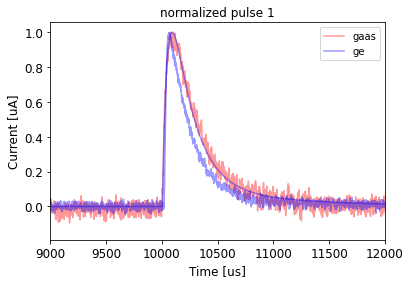

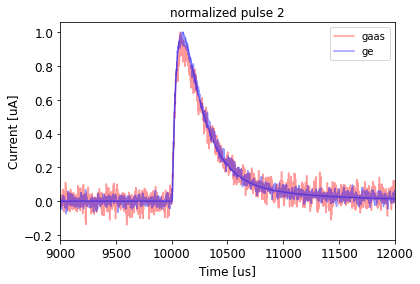

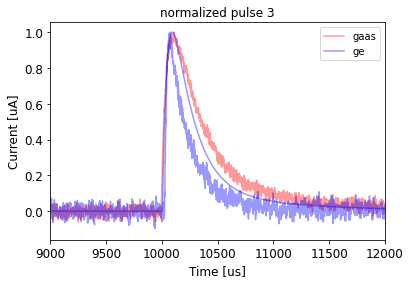

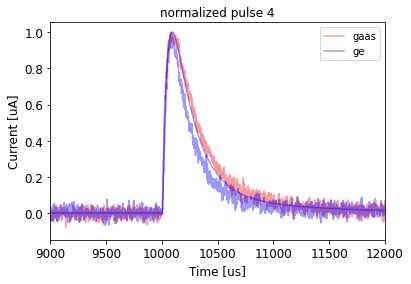

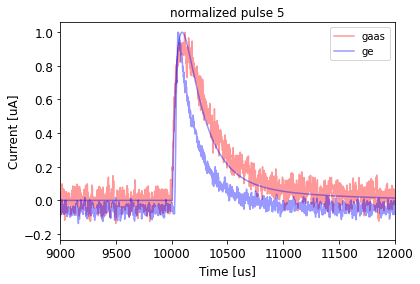

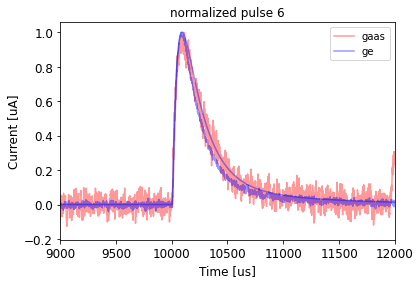

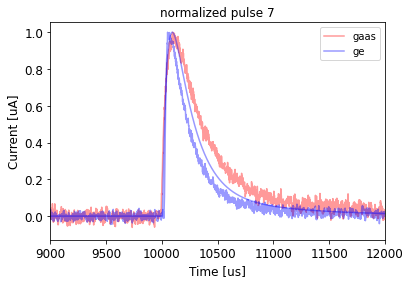

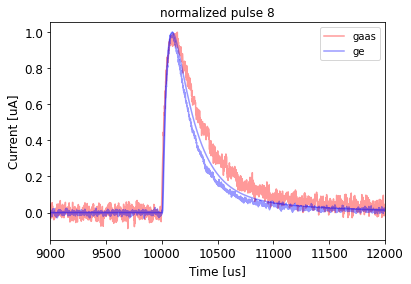

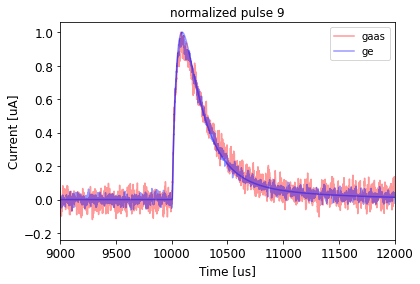

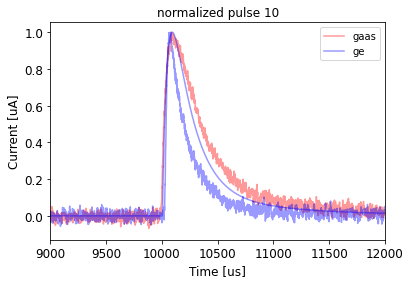

In [27]:

%matplotlib inline
trace_number=10
x_temp = np.zeros(x.shape)
x_temp2 = np.zeros(x2.shape)
x_temp_roll = np.zeros(x.shape)
x_temp_roll2 = np.zeros(x2.shape)
for i in range(trace_number):
    ts = np.roll(x[i,0],-int(df.oft0_constrained_CPDv21Ge[cout].iloc[i]*fs))
    ts-= np.mean(ts[0:6000])
    x_temp[i] = ts/ts.max()
    
    ts2 = np.roll(x2[i,0],-int(df.oft0_constrained_CPDv21Ge[cout2].iloc[i]*fs))
    ts2-= np.mean(ts2[0:6000])
    x_temp2[i] = ts2/ts2.max()
    
    templaterolled = np.roll(template,-int(df.oft0_constrained_CPDv21Ge[cout].iloc[i]*fs))
    templaterolled -= np.mean(templaterolled[0:6000])
    x_temp_roll[i] = ((templaterolled*df.ofamp_constrained_CPDv21Ge[cout].iloc[i])/
                      (templaterolled*df.ofamp_constrained_CPDv21Ge[cout].iloc[i]).max())
    
    templaterolled2 = np.roll(template, -int(df.oft0_constrained_CPDv21Ge[cout2].iloc[i]*fs))
    templaterolled2 -= np.mean(templaterolled2[0:6000])
    x_temp_roll2[i] = ((templaterolled2*df.ofamp_constrained_CPDv21Ge[cout2].iloc[i])/
                      (templaterolled2*df.ofamp_constrained_CPDv21Ge[cout2].iloc[i]).max())
    
    plt.plot(t*1e6, x_temp[i,0], alpha=0.4, label='gaas', color='r')
    plt.plot(t2*1e6, x_temp2[i,0], alpha=0.4, label='ge', color='b')
    
    
    plt.plot(t*1e6, x_temp_roll[i,0], alpha=0.4, color='b')
    #plt.plot(t2*1e6, x_temp_roll2[5,0], color='r', alpha=0.4)
                     
    
    plt.legend()
    plt.xlim(9000, 12000)
    plt.xlabel('Time [us]')
    plt.ylabel('Current [uA]')
    plt.title('normalized pulse {}'.format(i+1))
    plt.show()

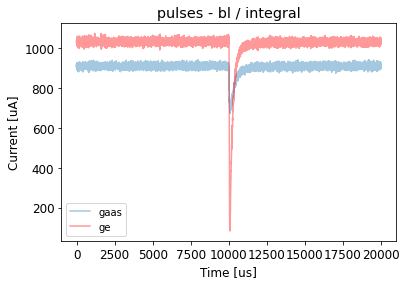

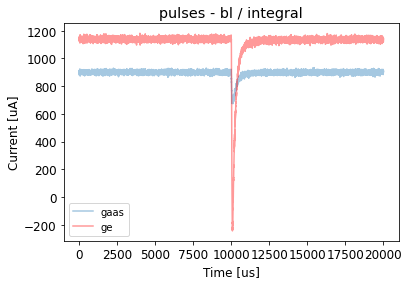

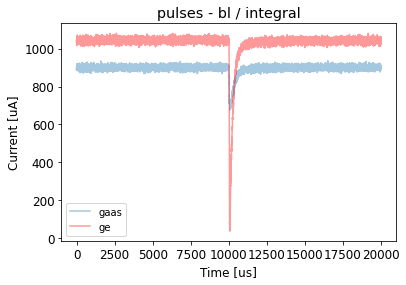

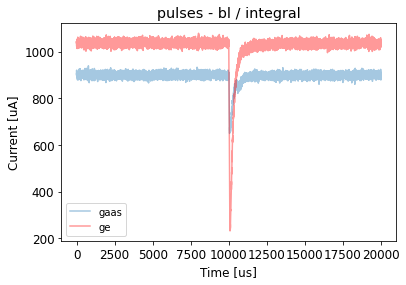

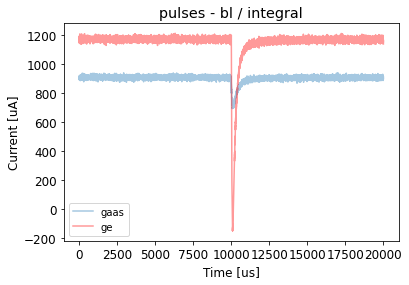

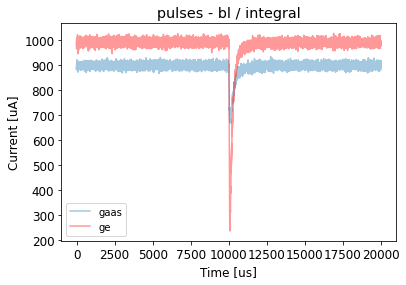

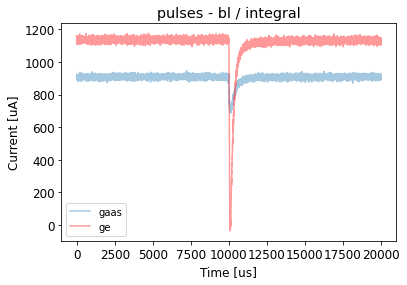

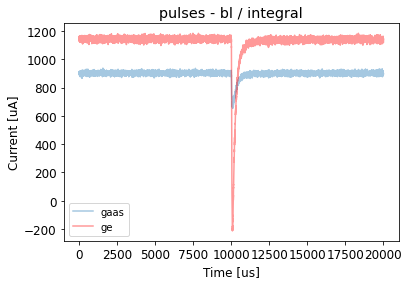

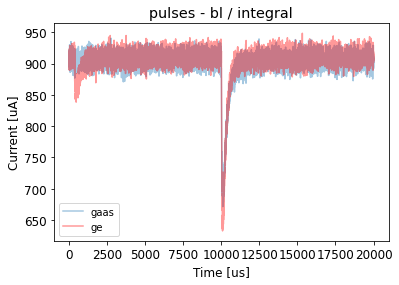

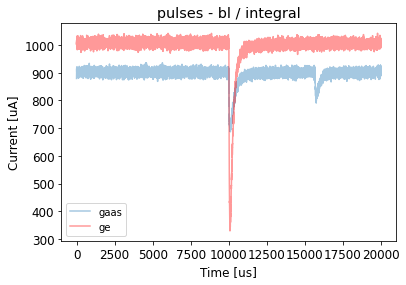

In [43]:
#plotting the template used to process vs the lower distribution trace
#-int(df.oft0_constrained_CPDv21Ge[cout].iloc[i]*fs)
trace_number=10
for i in range(trace_number):
    
    plt.plot(t*1e6, (x[i,0]-((df.baseline_CPDv21Ge[cout].iloc[i])*(2000/1.25e6)))/
             df.integral_CPDv21Ge[cout].iloc[i], alpha=0.4, label='gaas')
    plt.plot(t2*1e6, (x2[i,0]-((df.baseline_CPDv21Ge[cout2].iloc[i])*(2000/1.25e6)))/
             df.integral_CPDv21Ge[cout2].iloc[i], alpha=0.4, color='r', label='ge')
    
    '''
    plt.plot(t*1e6, (templaterolled*
                     df.ofamp_constrained_CPDv21Ge[cout].iloc[i])+df.baseline_CPDv21Ge[cout].iloc[i], alpha=0.4)
    plt.plot(t2*1e6, (templaterolled2*
                     df.ofamp_constrained_CPDv21Ge[cout2].iloc[i])+df.baseline_CPDv21Ge[cout2].iloc[i], color='g', alpha=0.4)
                     ''';
    plt.legend()
    plt.xlabel('Time [us]')
    plt.ylabel('Current [uA]')
    plt.title('pulses - bl / integral')
    plt.show()


### 4 to 5 kev pulse graphs 

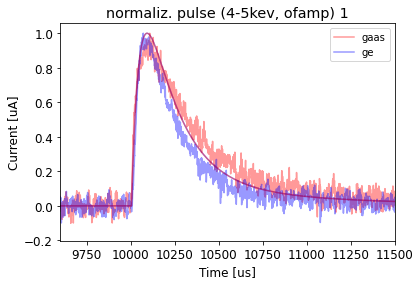

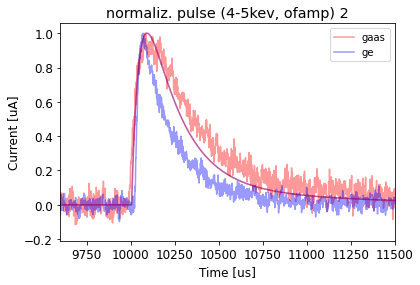

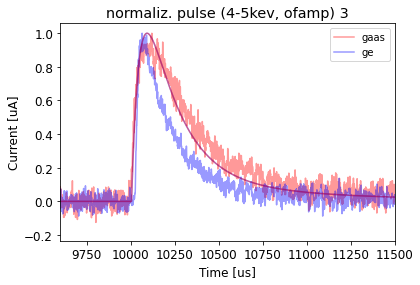

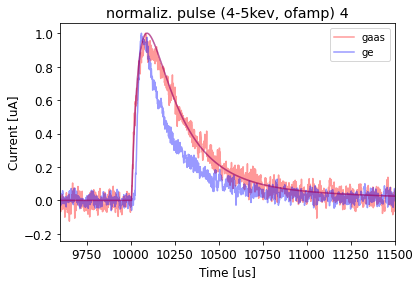

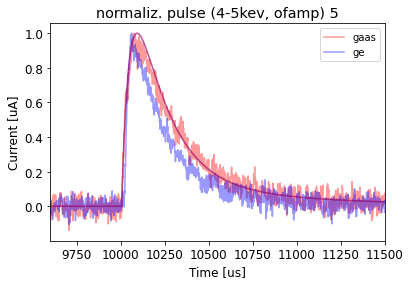

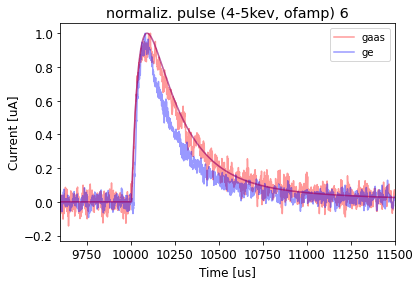

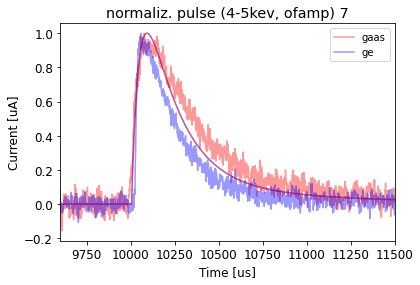

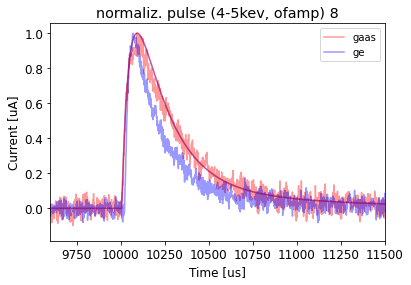

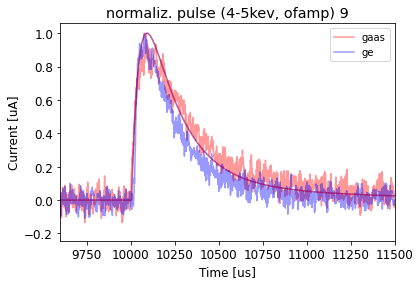

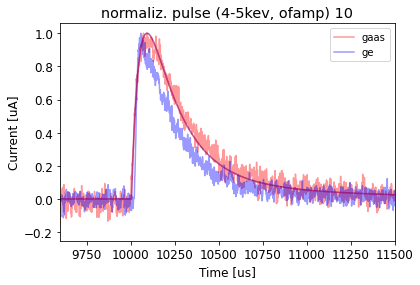

In [65]:
trace_number=10
x_temp = np.zeros(x_gaas_4to5.shape)
x_temp2 = np.zeros(x_ge_4to5.shape)
x_temp_roll = np.zeros(x_gaas_4to5.shape)
x_temp_roll2 = np.zeros(x_ge_4to5.shape)
for i in range(trace_number):
    ts = np.roll(x_gaas_4to5[i,0],-int(df.oft0_constrained_CPDv21Ge[cout_gaas4to5].iloc[i]*fs))
    ts-= np.mean(ts[0:6000])
    x_temp[i] = ts/(ts.max())
    
    ts2 = np.roll(x_ge_4to5[i,0],-int(df.oft0_constrained_CPDv21Ge[cout_ge_4to5].iloc[i]*fs))
    ts2-= np.mean(ts2[0:6000])
    x_temp2[i] = ts2/(ts2.max())

    templaterolled = np.roll(template,-int(df.oft0_constrained_CPDv21Ge[cout_gaas4to5].iloc[i]*fs))
    templaterolled -= np.mean(templaterolled[0:6000])
    x_temp_roll[i] = ((templaterolled*df.ofamp_constrained_CPDv21Ge[cout_gaas4to5].iloc[i])/
                      (templaterolled*df.ofamp_constrained_CPDv21Ge[cout_gaas4to5].iloc[i]).max())
    
    templaterolled2 = np.roll(template, -int(df.oft0_constrained_CPDv21Ge[cout_ge_4to5].iloc[i]*fs))
    templaterolled2 -= np.mean(templaterolled2[0:6000])
    x_temp_roll2[i] = ((templaterolled2*df.ofamp_constrained_CPDv21Ge[cout_ge_4to5].iloc[i])/
                      (templaterolled2*df.ofamp_constrained_CPDv21Ge[cout_ge_4to5].iloc[i]).max())
                      
    plt.plot(t_gaas_4to5*1e6, x_temp[i,0], alpha=0.4, label='gaas', color='r')
    plt.plot(t_ge_4to5*1e6, x_temp2[i,0], alpha=0.4, label='ge', color='b')
    
    
    plt.plot(t_gaas_4to5*1e6, x_temp_roll[i,0], alpha=0.4, color='b')
    plt.plot(t_ge_4to5*1e6, x_temp_roll2[i,0], color='r', alpha=0.4)
                     
    
    plt.legend()
    plt.xlim(9600, 11500)
    #plt.ylim(-0.1, 0.2)
    plt.xlabel('Time [us]')
    plt.ylabel('Current [uA]')
    plt.title('normaliz. pulse (4-5kev, ofamp) {}'.format(i+1))
    plt.show()

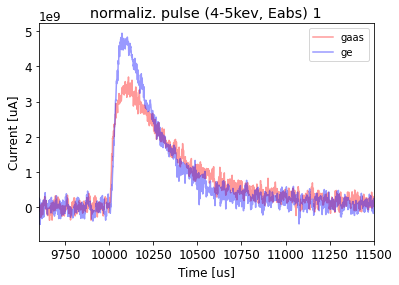

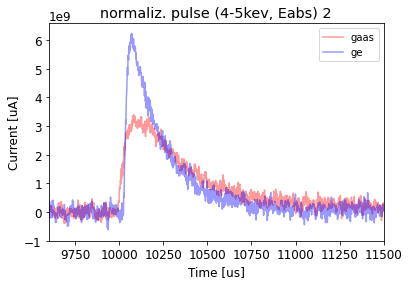

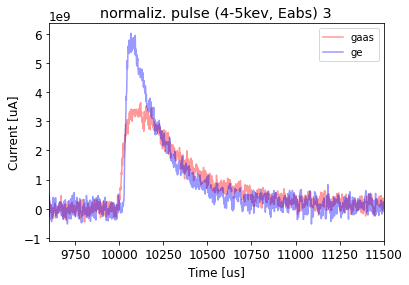

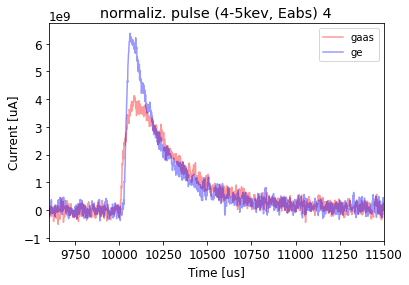

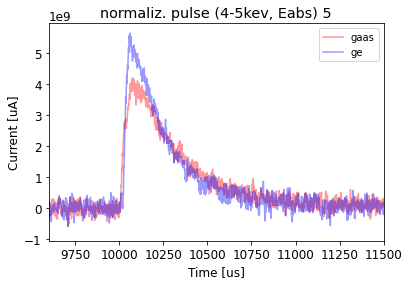

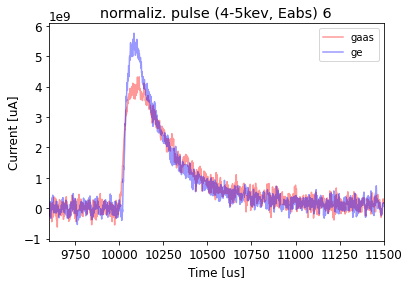

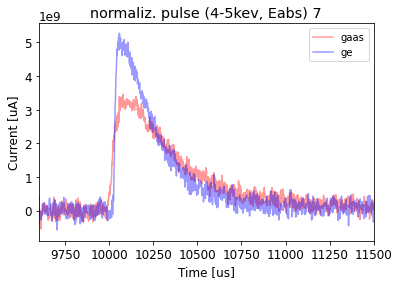

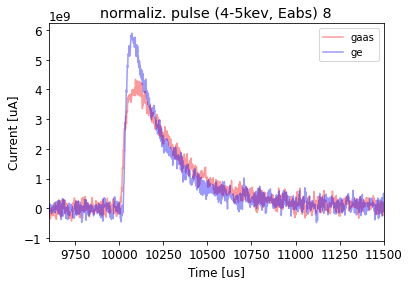

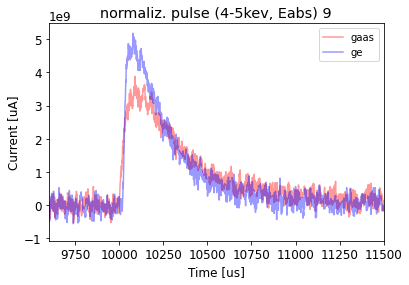

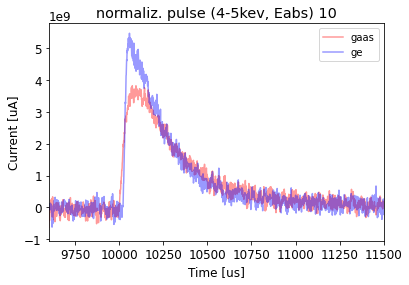

In [53]:
trace_number=10
x_temp = np.zeros(x_gaas_4to5.shape)
x_temp2 = np.zeros(x_ge_4to5.shape)
x_temp_roll = np.zeros(x_gaas_4to5.shape)
x_temp_roll2 = np.zeros(x_ge_4to5.shape)
for i in range(trace_number):
    ts = np.roll(x_gaas_4to5[i,0],-int(df.oft0_constrained_CPDv21Ge[cout_gaas4to5].iloc[i]*fs))
    ts-= np.mean(ts[0:6000])
    x_temp[i] = ts/((-df.energyabsorbed_CPDv21Ge[cout_gaas4to5].iloc[i]).max())
    
    ts2 = np.roll(x_ge_4to5[i,0],-int(df.oft0_constrained_CPDv21Ge[cout_ge_4to5].iloc[i]*fs))
    ts2-= np.mean(ts2[0:6000])
    x_temp2[i] = ts2/((-df.energyabsorbed_CPDv21Ge[cout_ge_4to5].iloc[i]).max())
    '''
    templaterolled = np.roll(template,-int(df.oft0_constrained_CPDv21Ge[cout_gaas4to5].iloc[i]*fs))
    templaterolled -= np.mean(templaterolled[0:6000])
    x_temp_roll[i] = ((templaterolled*-df.energyabsorbed_CPDv21Ge[cout_gaas4to5].iloc[i])/
                      (templaterolled*(-df.energyabsorbed_CPDv21Ge[cout_gaas4to5].iloc[i]).max()))
    
    templaterolled2 = np.roll(template, -int(df.oft0_constrained_CPDv21Ge[cout_ge_4to5].iloc[i]*fs))
    templaterolled2 -= np.mean(templaterolled2[0:6000])
    x_temp_roll2[i] = ((templaterolled2*-df.energyabsorbed_CPDv21Ge[cout_ge_4to5].iloc[i])/
                      (templaterolled2*(-df.energyabsorbed_CPDv21Ge[cout_ge_4to5].iloc[i]).max()))
     ''';                 
    plt.plot(t_gaas_4to5*1e6, x_temp[i,0], alpha=0.4, label='gaas', color='r')
    plt.plot(t_ge_4to5*1e6, x_temp2[i,0], alpha=0.4, label='ge', color='b')
    
    '''
    plt.plot(t_gaas_4to5*1e6, x_temp_roll[i,0], alpha=0.4, color='b')
    plt.plot(t_ge_4to5*1e6, x_temp_roll2[i,0], color='r', alpha=0.4)
      ''';               
    
    plt.legend()
    plt.xlim(9600, 11500)
    #plt.ylim(-0.1, 0.2)
    plt.xlabel('Time [us]')
    plt.ylabel('Current [uA]')
    plt.title('normaliz. pulse (4-5kev, Eabs) {}'.format(i+1))
    plt.show()

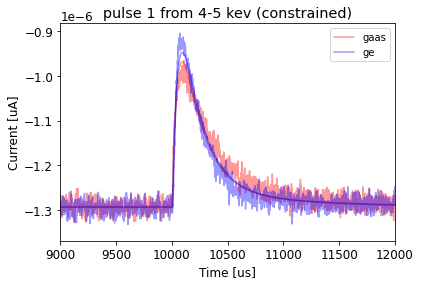

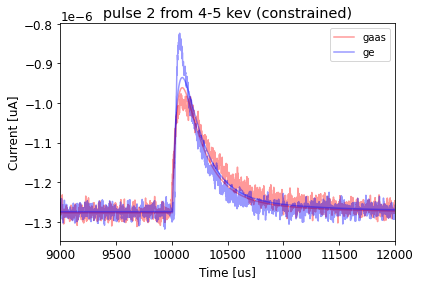

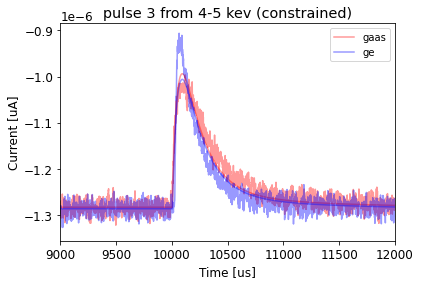

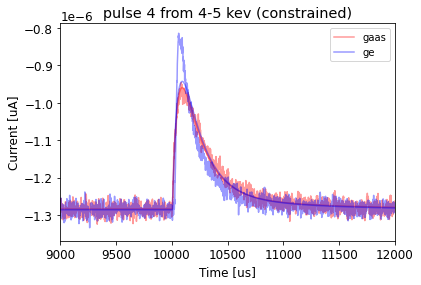

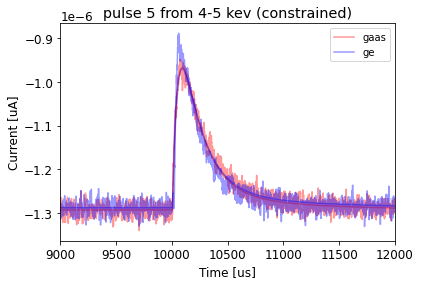

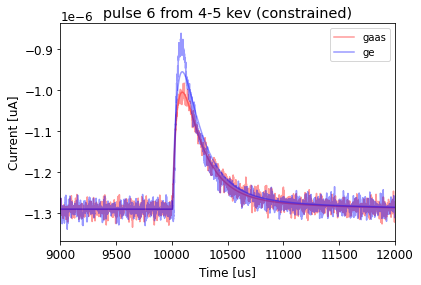

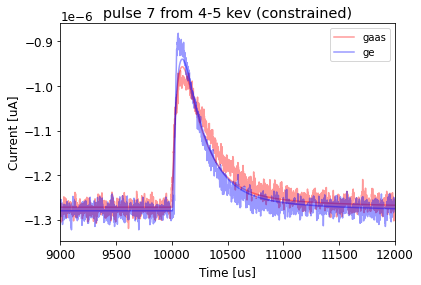

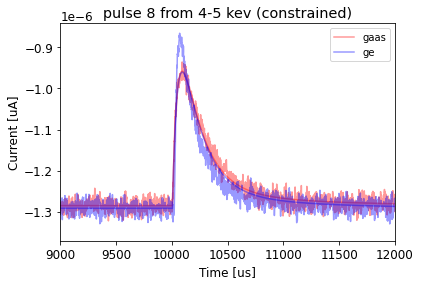

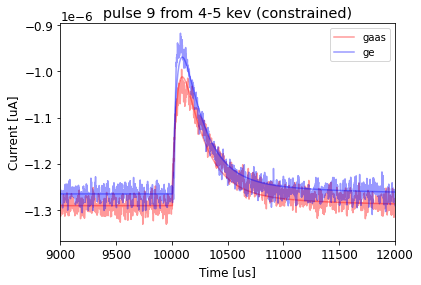

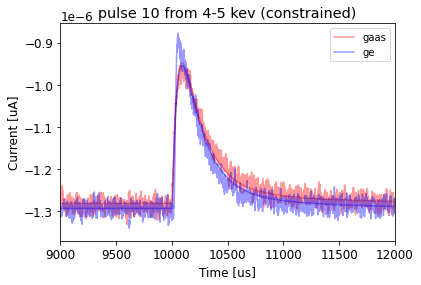

In [31]:
trace_number=10
for i in range(trace_number):
    plt.plot(t_gaas_4to5*1e6, x_gaas_4to5[i,0], alpha=0.4, label='gaas', color='r')
    templaterolled = np.roll(template,int(
        df.oft0_constrained_CPDv21Ge[cout_gaas4to5].iloc[i]*fs))
    plt.plot(t_gaas_4to5*1e6, (templaterolled*
                     df.ofamp_constrained_CPDv21Ge[cout_gaas4to5].iloc[i])+
             df.baseline_CPDv21Ge[cout_gaas4to5].iloc[i], alpha=0.4, color='r')
    
    plt.plot(t_ge_4to5*1e6, x_ge_4to5[i,0], alpha=0.4, label='ge', color='b')
    templaterolled2 = np.roll(template,int(
        df.oft0_constrained_CPDv21Ge[cout_ge_4to5].iloc[i]*fs))
    plt.plot(t_ge_4to5*1e6, (templaterolled2*
                     df.ofamp_constrained_CPDv21Ge[cout_ge_4to5].iloc[i])+
             df.baseline_CPDv21Ge[cout_ge_4to5].iloc[i], alpha=0.4, color='b')
    plt.legend()
    plt.xlim(9000, 12000)
    plt.xlabel('Time [us]')
    plt.ylabel('Current [uA]')
    plt.title('pulse {} from 4-5 kev (constrained)'.format(i+1))
    plt.show()

### 8-9 kev pulse graphs

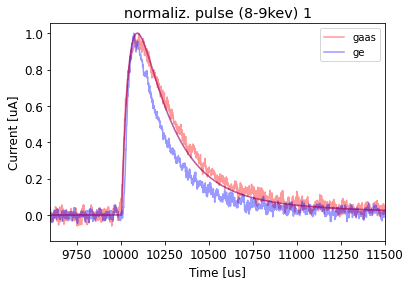

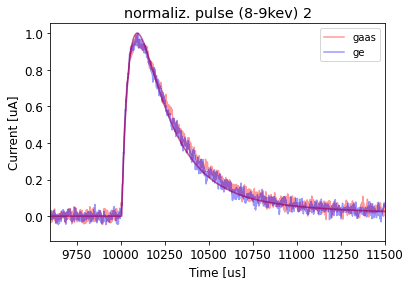

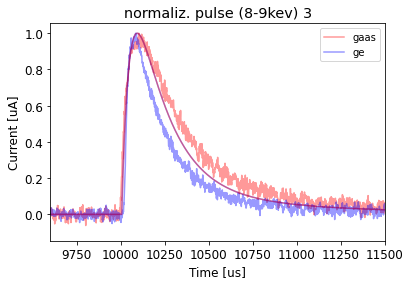

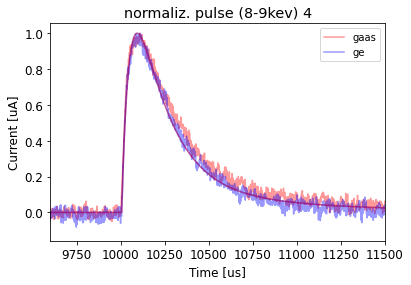

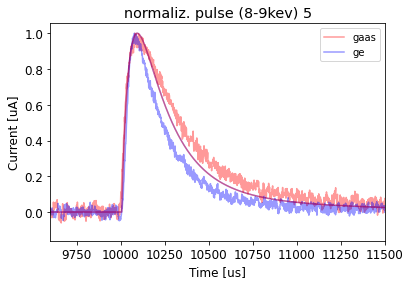

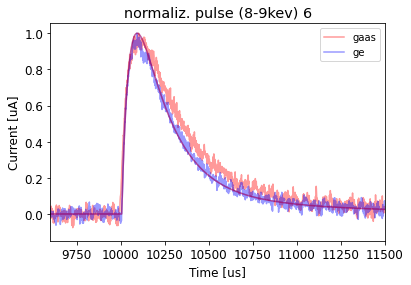

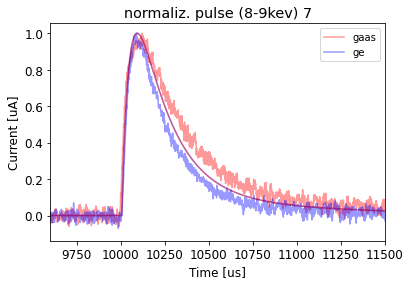

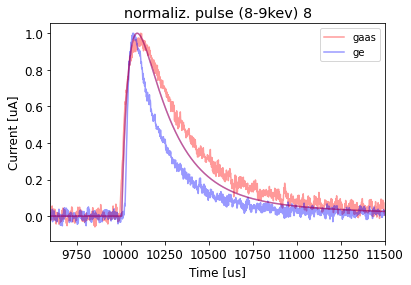

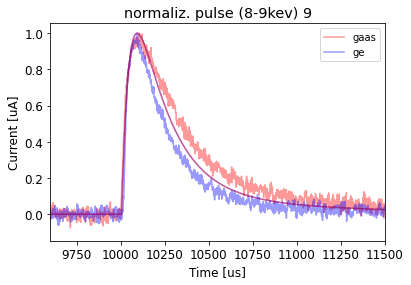

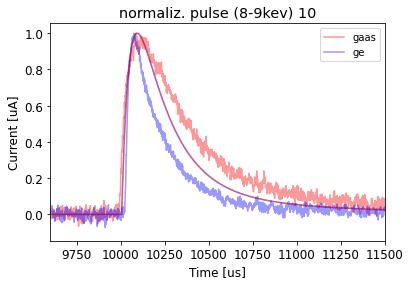

In [62]:
trace_number=10
x_temp = np.zeros(x_gaas_8to9.shape)
x_temp2 = np.zeros(x_ge_8to9.shape)
x_temp_roll = np.zeros(x_gaas_8to9.shape)
x_temp_roll2 = np.zeros(x_ge_8to9.shape)
for i in range(trace_number):
    ts = np.roll(x_gaas_8to9[i,0],-int(df.oft0_constrained_CPDv21Ge[cout_gaas8to9].iloc[i]*fs))
    ts-= np.mean(ts[0:6000])
    x_temp[i] = ts/ts.max()
    
    ts2 = np.roll(x_ge_8to9[i,0],-int(df.oft0_constrained_CPDv21Ge[cout_ge_8to9].iloc[i]*fs))
    ts2-= np.mean(ts2[0:6000])
    x_temp2[i] = ts2/ts2.max()
    
    templaterolled = np.roll(template,-int(df.oft0_constrained_CPDv21Ge[cout_gaas8to9].iloc[i]*fs))
    templaterolled -= np.mean(templaterolled[0:6000])
    x_temp_roll[i] = ((templaterolled*df.ofamp_constrained_CPDv21Ge[cout_gaas8to9].iloc[i])/
                      (templaterolled*df.ofamp_constrained_CPDv21Ge[cout_gaas8to9].iloc[i]).max())
    
    templaterolled2 = np.roll(template, -int(df.oft0_constrained_CPDv21Ge[cout_ge_8to9].iloc[i]*fs))
    templaterolled2 -= np.mean(templaterolled2[0:6000])
    x_temp_roll2[i] = ((templaterolled2*df.ofamp_constrained_CPDv21Ge[cout_ge_8to9].iloc[i])/
                      (templaterolled2*df.ofamp_constrained_CPDv21Ge[cout_ge_8to9].iloc[i]).max())
    
    plt.plot(t_gaas_8to9*1e6, x_temp[i,0], alpha=0.4, label='gaas', color='r')
    plt.plot(t_ge_8to9*1e6, x_temp2[i,0], alpha=0.4, label='ge', color='b')
    
    
    plt.plot(t_gaas_8to9*1e6, x_temp_roll[i,0], alpha=0.4, color='b')
    plt.plot(t_ge_8to9*1e6, x_temp_roll2[i,0], color='r', alpha=0.4)
                    
    
    plt.legend()
    plt.xlim(9600, 11500)
    plt.xlabel('Time [us]')
    plt.ylabel('Current [uA]')
    plt.title('normaliz. pulse (8-9kev) {}'.format(i+1))
    plt.show()

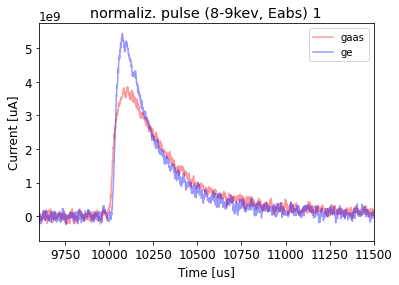

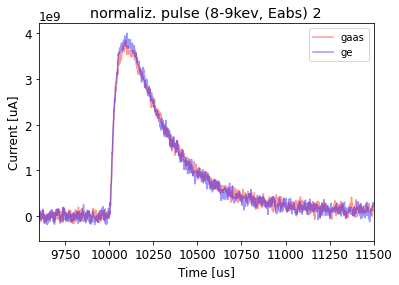

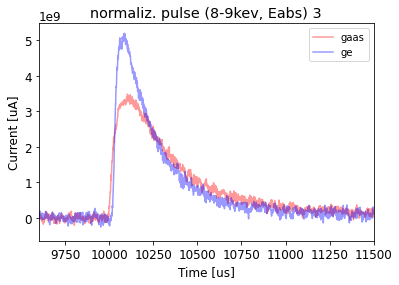

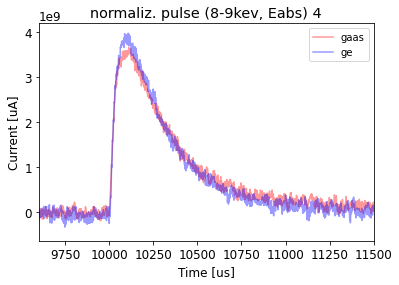

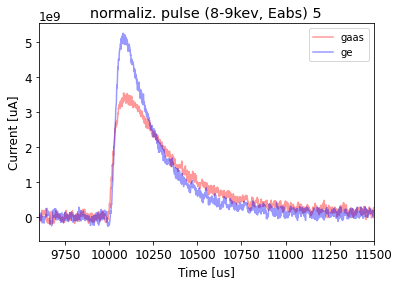

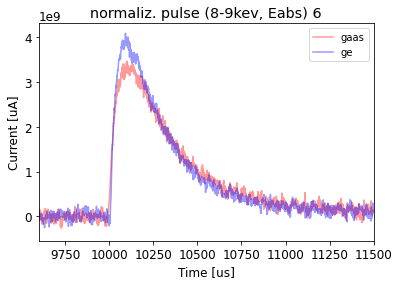

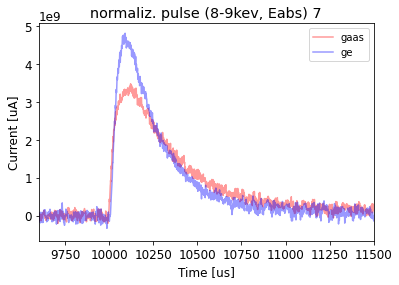

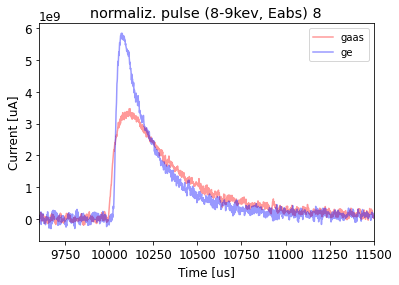

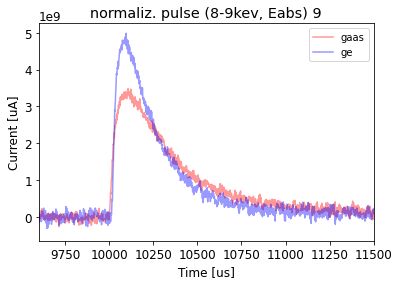

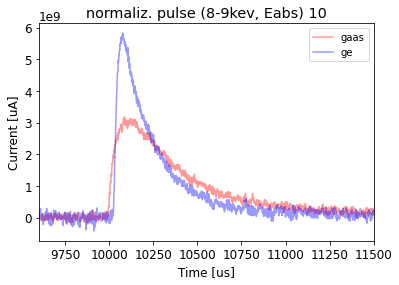

In [56]:
trace_number=10
x_temp = np.zeros(x_gaas_8to9.shape)
x_temp2 = np.zeros(x_ge_8to9.shape)
x_temp_roll = np.zeros(x_gaas_8to9.shape)
x_temp_roll2 = np.zeros(x_ge_8to9.shape)
for i in range(trace_number):
    ts = np.roll(x_gaas_8to9[i,0],-int(df.oft0_constrained_CPDv21Ge[cout_gaas8to9].iloc[i]*fs))
    ts-= np.mean(ts[0:6000])
    x_temp[i] = ts/((-df.energyabsorbed_CPDv21Ge[cout_gaas8to9].iloc[i]).max())
    
    ts2 = np.roll(x_ge_8to9[i,0],-int(df.oft0_constrained_CPDv21Ge[cout_ge_8to9].iloc[i]*fs))
    ts2-= np.mean(ts2[0:6000])
    x_temp2[i] = ts2/((-df.energyabsorbed_CPDv21Ge[cout_ge_8to9].iloc[i]).max())
    '''
    templaterolled = np.roll(template,-int(df.oft0_constrained_CPDv21Ge[cout_gaas4to5].iloc[i]*fs))
    templaterolled -= np.mean(templaterolled[0:6000])
    x_temp_roll[i] = ((templaterolled*-df.energyabsorbed_CPDv21Ge[cout_gaas4to5].iloc[i])/
                      (templaterolled*(-df.energyabsorbed_CPDv21Ge[cout_gaas4to5].iloc[i]).max()))
    
    templaterolled2 = np.roll(template, -int(df.oft0_constrained_CPDv21Ge[cout_ge_4to5].iloc[i]*fs))
    templaterolled2 -= np.mean(templaterolled2[0:6000])
    x_temp_roll2[i] = ((templaterolled2*-df.energyabsorbed_CPDv21Ge[cout_ge_4to5].iloc[i])/
                      (templaterolled2*(-df.energyabsorbed_CPDv21Ge[cout_ge_4to5].iloc[i]).max()))
     ''';                 
    plt.plot(t_gaas_8to9*1e6, x_temp[i,0], alpha=0.4, label='gaas', color='r')
    plt.plot(t_ge_8to9*1e6, x_temp2[i,0], alpha=0.4, label='ge', color='b')
    
    '''
    plt.plot(t_gaas_4to5*1e6, x_temp_roll[i,0], alpha=0.4, color='b')
    plt.plot(t_ge_4to5*1e6, x_temp_roll2[i,0], color='r', alpha=0.4)
      ''';               
    
    plt.legend()
    plt.xlim(9600, 11500)
    #plt.ylim(-0.1, 0.2)
    plt.xlabel('Time [us]')
    plt.ylabel('Current [uA]')
    plt.title('normaliz. pulse (8-9kev, Eabs) {}'.format(i+1))
    plt.show()

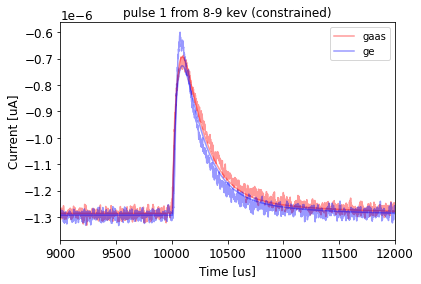

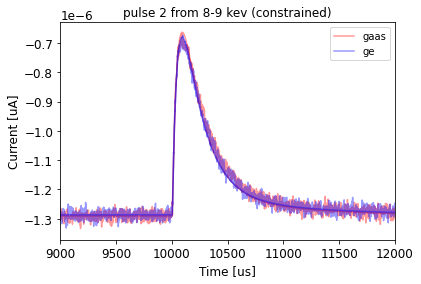

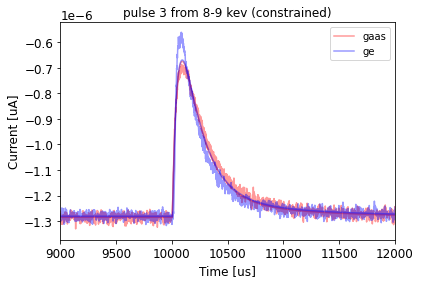

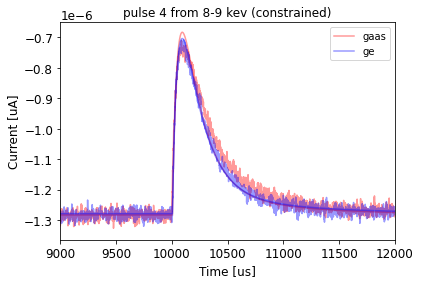

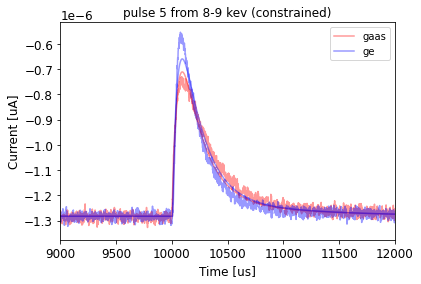

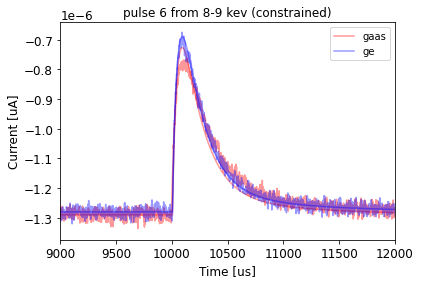

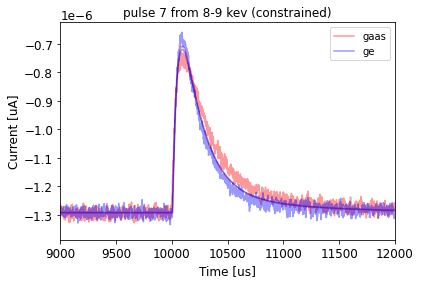

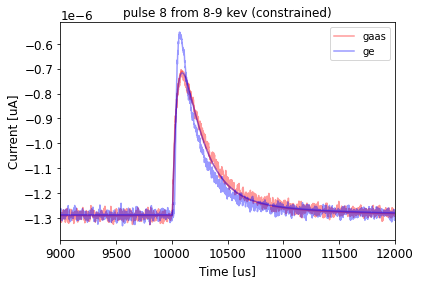

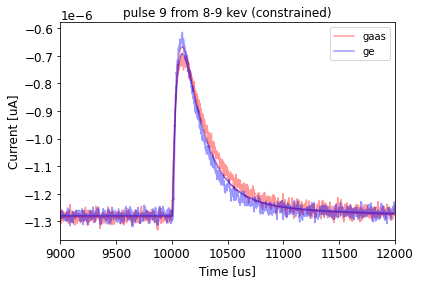

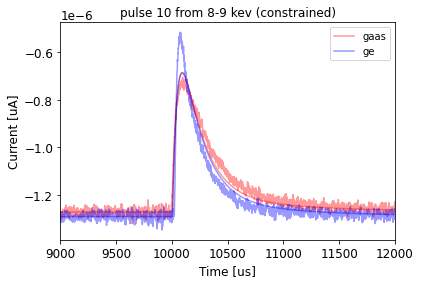

In [60]:
trace_number=10
for i in range(trace_number):
    plt.plot(t_gaas_8to9*1e6, x_gaas_8to9[i,0], alpha=0.4, label='gaas', color='r')
    templaterolled = np.roll(template,int(
        df.oft0_constrained_CPDv21Ge[cout_gaas8to9].iloc[i]*fs))
    plt.plot(t_gaas_8to9*1e6, (templaterolled*
                     df.ofamp_constrained_CPDv21Ge[cout_gaas8to9].iloc[i])+
             df.baseline_CPDv21Ge[cout_gaas8to9].iloc[i], alpha=0.4, color='r')
    
    plt.plot(t_ge_8to9*1e6, x_ge_8to9[i,0], alpha=0.4, label='ge', color='b')
    templaterolled2 = np.roll(template,int(
        df.oft0_constrained_CPDv21Ge[cout_ge_8to9].iloc[i]*fs))
    plt.plot(t_ge_8to9*1e6, (templaterolled2*
                     df.ofamp_constrained_CPDv21Ge[cout_ge_8to9].iloc[i])+
             df.baseline_CPDv21Ge[cout_ge_8to9].iloc[i], alpha=0.4, color='b')
    plt.legend()
    plt.xlim(9000, 12000)
    plt.xlabel('Time [us]')
    plt.ylabel('Current [uA]')
    plt.title('pulse {} from 8-9 kev (constrained)'.format(i+1))
    plt.show()

### 12 to 13kev pulse graphs

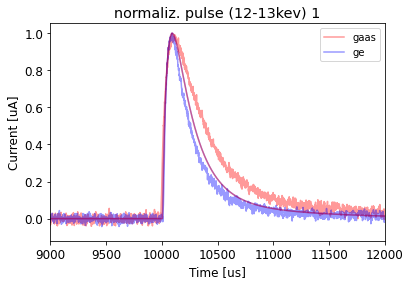

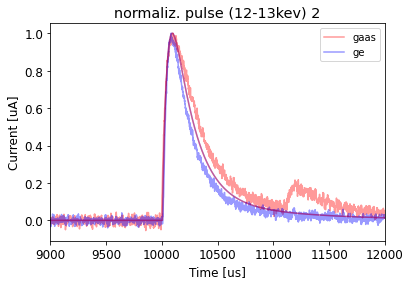

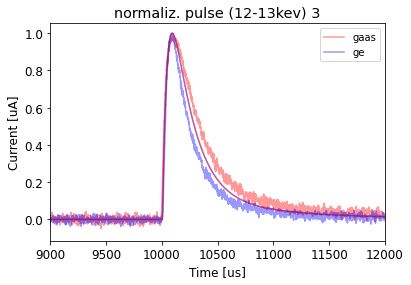

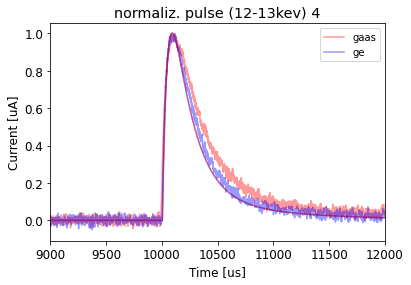

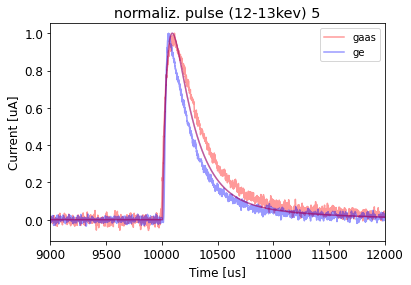

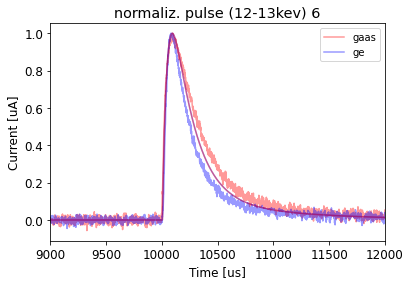

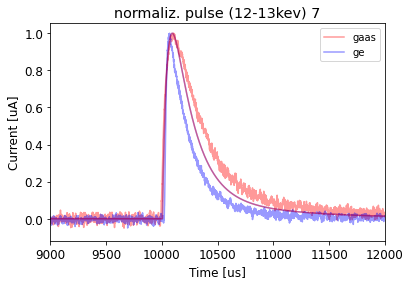

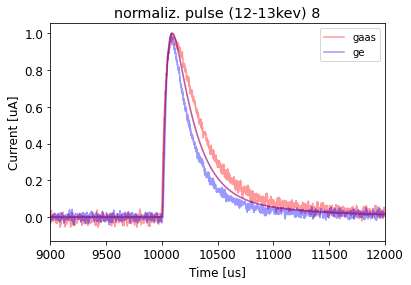

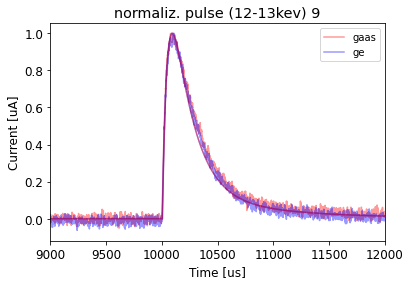

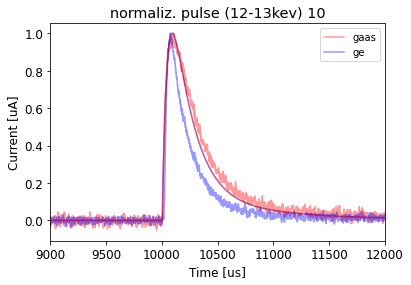

In [60]:
trace_number=10
x_temp = np.zeros(x_gaas_12to13.shape)
x_temp2 = np.zeros(x_ge_12to13.shape)
x_temp_roll = np.zeros(x_gaas_12to13.shape)
x_temp_roll2 = np.zeros(x_ge_12to13.shape)
for i in range(trace_number):
    ts = np.roll(x_gaas_12to13[i,0],-int(df.oft0_constrained_CPDv21Ge[cout_gaas12to13].iloc[i]*fs))
    ts-= np.mean(ts[0:6000])
    x_temp[i] = ts/ts.max()
    
    ts2 = np.roll(x_ge_12to13[i,0],-int(df.oft0_constrained_CPDv21Ge[cout_ge_12to13].iloc[i]*fs))
    ts2-= np.mean(ts2[0:6000])
    x_temp2[i] = ts2/ts2.max()
    
    templaterolled = np.roll(template,-int(df.oft0_constrained_CPDv21Ge[cout_gaas12to13].iloc[i]*fs))
    templaterolled -= np.mean(templaterolled[0:6000])
    x_temp_roll[i] = ((templaterolled*df.ofamp_constrained_CPDv21Ge[cout_gaas12to13].iloc[i])/
                      (templaterolled*df.ofamp_constrained_CPDv21Ge[cout_gaas12to13].iloc[i]).max())
    
    templaterolled2 = np.roll(template, -int(df.oft0_constrained_CPDv21Ge[cout_ge_12to13].iloc[i]*fs))
    templaterolled2 -= np.mean(templaterolled2[0:6000])
    x_temp_roll2[i] = ((templaterolled2*df.ofamp_constrained_CPDv21Ge[cout_ge_12to13].iloc[i])/
                      (templaterolled2*df.ofamp_constrained_CPDv21Ge[cout_ge_12to13].iloc[i]).max())
    
    plt.plot(t_gaas_12to13*1e6, x_temp[i,0], alpha=0.4, label='gaas', color='r')
    plt.plot(t_ge_12to13*1e6, x_temp2[i,0], alpha=0.4, label='ge', color='b')
    
    
    plt.plot(t_gaas_12to13*1e6, x_temp_roll[i,0], alpha=0.4, color='b')
    plt.plot(t_ge_12to13*1e6, x_temp_roll2[i,0], color='r', alpha=0.4)
                     
    
    plt.legend()
    plt.xlim(9000, 12000)
    plt.xlabel('Time [us]')
    plt.ylabel('Current [uA]')
    plt.title('normaliz. pulse (12-13kev) {}'.format(i+1))
    plt.show()

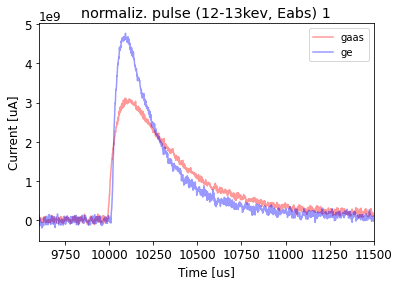

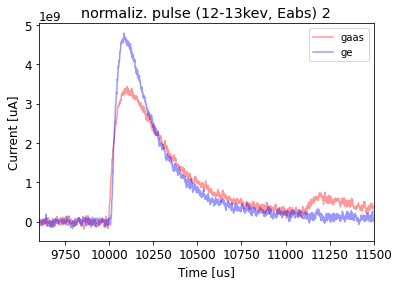

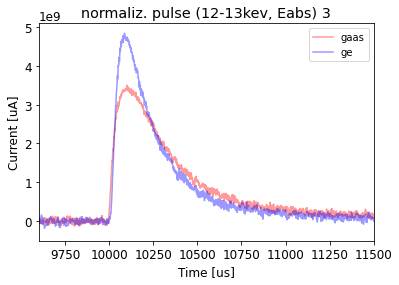

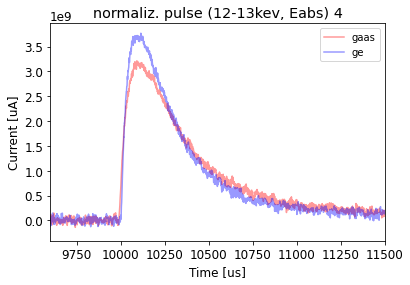

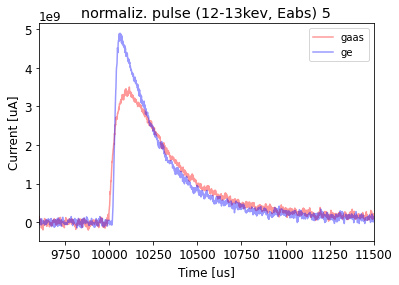

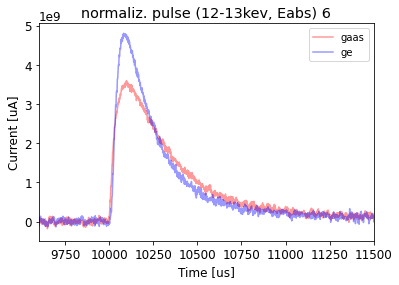

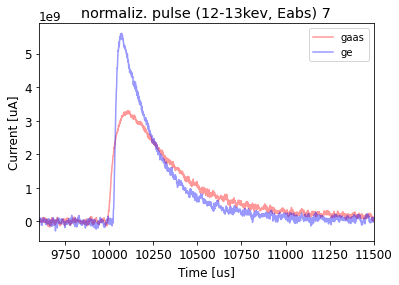

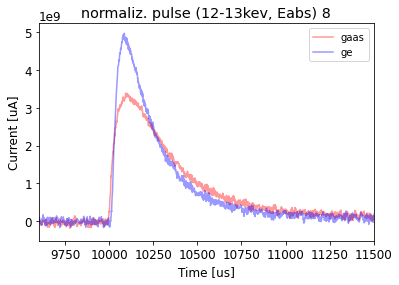

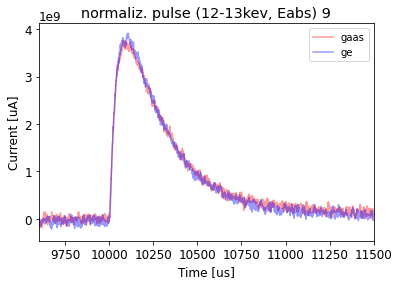

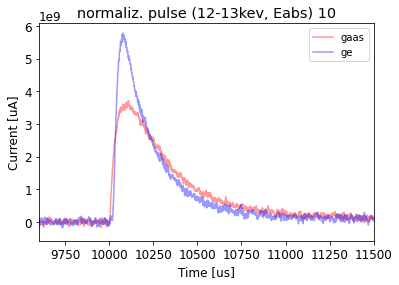

In [59]:
trace_number=10
x_temp = np.zeros(x_gaas_12to13.shape)
x_temp2 = np.zeros(x_ge_12to13.shape)
x_temp_roll = np.zeros(x_gaas_12to13.shape)
x_temp_roll2 = np.zeros(x_ge_12to13.shape)
for i in range(trace_number):
    ts = np.roll(x_gaas_12to13[i,0],-int(df.oft0_constrained_CPDv21Ge[cout_gaas12to13].iloc[i]*fs))
    ts-= np.mean(ts[0:6000])
    x_temp[i] = ts/((-df.energyabsorbed_CPDv21Ge[cout_gaas12to13].iloc[i]).max())
    
    ts2 = np.roll(x_ge_12to13[i,0],-int(df.oft0_constrained_CPDv21Ge[cout_ge_12to13].iloc[i]*fs))
    ts2-= np.mean(ts2[0:6000])
    x_temp2[i] = ts2/((-df.energyabsorbed_CPDv21Ge[cout_ge_12to13].iloc[i]).max())
    '''
    templaterolled = np.roll(template,-int(df.oft0_constrained_CPDv21Ge[cout_gaas4to5].iloc[i]*fs))
    templaterolled -= np.mean(templaterolled[0:6000])
    x_temp_roll[i] = ((templaterolled*-df.energyabsorbed_CPDv21Ge[cout_gaas4to5].iloc[i])/
                      (templaterolled*(-df.energyabsorbed_CPDv21Ge[cout_gaas4to5].iloc[i]).max()))
    
    templaterolled2 = np.roll(template, -int(df.oft0_constrained_CPDv21Ge[cout_ge_4to5].iloc[i]*fs))
    templaterolled2 -= np.mean(templaterolled2[0:6000])
    x_temp_roll2[i] = ((templaterolled2*-df.energyabsorbed_CPDv21Ge[cout_ge_4to5].iloc[i])/
                      (templaterolled2*(-df.energyabsorbed_CPDv21Ge[cout_ge_4to5].iloc[i]).max()))
     ''';                 
    plt.plot(t_gaas_12to13*1e6, x_temp[i,0], alpha=0.4, label='gaas', color='r')
    plt.plot(t_ge_12to13*1e6, x_temp2[i,0], alpha=0.4, label='ge', color='b')
    
    '''
    plt.plot(t_gaas_4to5*1e6, x_temp_roll[i,0], alpha=0.4, color='b')
    plt.plot(t_ge_4to5*1e6, x_temp_roll2[i,0], color='r', alpha=0.4)
      ''';               
    
    plt.legend()
    plt.xlim(9600, 11500)
    #plt.ylim(-0.1, 0.2)
    plt.xlabel('Time [us]')
    plt.ylabel('Current [uA]')
    plt.title('normaliz. pulse (12-13kev, Eabs) {}'.format(i+1))
    plt.show()

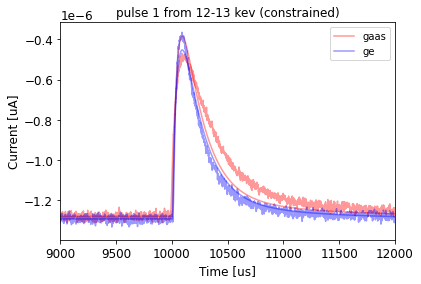

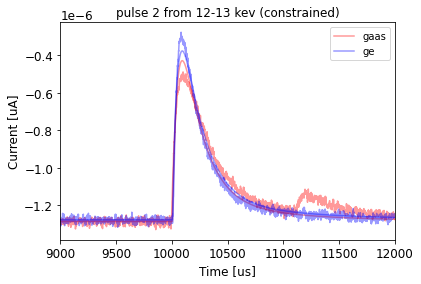

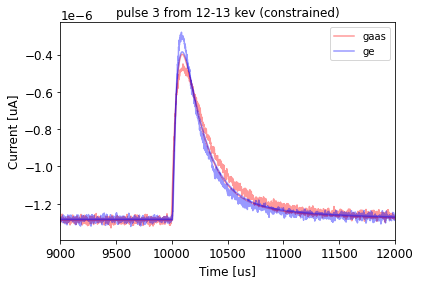

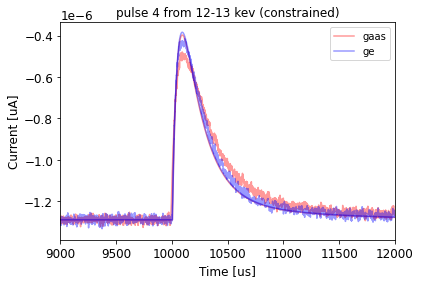

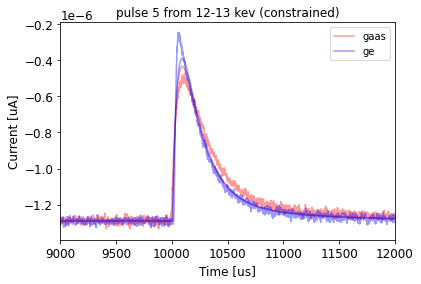

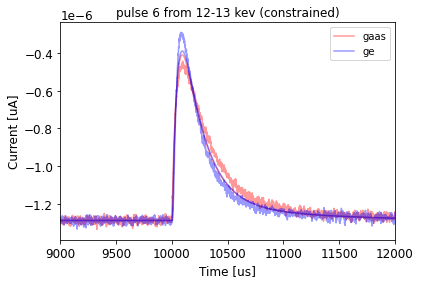

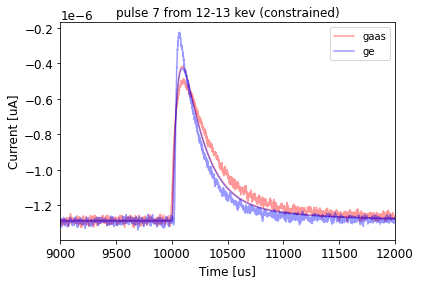

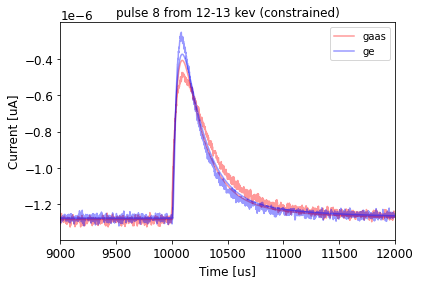

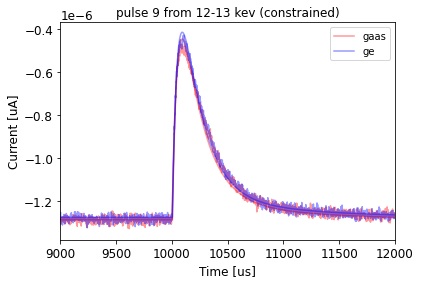

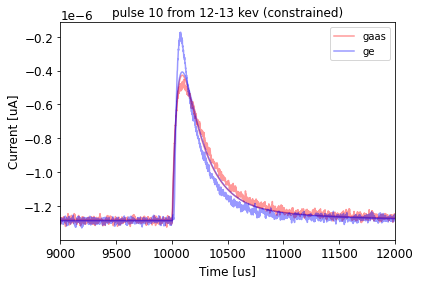

In [61]:
trace_number=10
for i in range(trace_number):
    plt.plot(t_gaas_12to13*1e6, x_gaas_12to13[i,0], alpha=0.4, label='gaas', color='r')
    templaterolled = np.roll(template,int(
        df.oft0_constrained_CPDv21Ge[cout_gaas12to13].iloc[i]*fs))
    plt.plot(t_gaas_12to13*1e6, (templaterolled*
                     df.ofamp_constrained_CPDv21Ge[cout_gaas12to13].iloc[i])+
             df.baseline_CPDv21Ge[cout_gaas12to13].iloc[i], alpha=0.4, color='r')
    
    plt.plot(t_ge_12to13*1e6, x_ge_12to13[i,0], alpha=0.4, label='ge', color='b')
    templaterolled2 = np.roll(template,int(
        df.oft0_constrained_CPDv21Ge[cout_ge_12to13].iloc[i]*fs))
    plt.plot(t_ge_12to13*1e6, (templaterolled2*
                     df.ofamp_constrained_CPDv21Ge[cout_ge_12to13].iloc[i])+
             df.baseline_CPDv21Ge[cout_ge_12to13].iloc[i], alpha=0.4, color='b')
    plt.legend()
    plt.xlim(9000, 12000)
    plt.xlabel('Time [us]')
    plt.ylabel('Current [uA]')
    plt.title('pulse {} from 12-13 kev (constrained)'.format(i+1))
    plt.show()

### pulse shape from 16-17kev

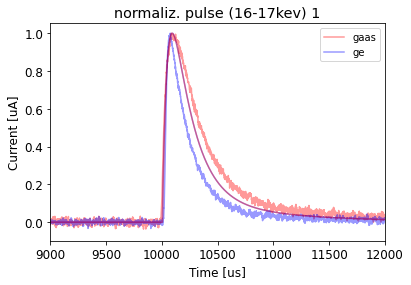

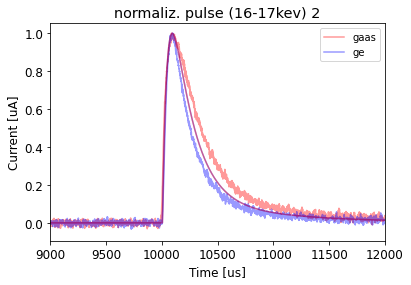

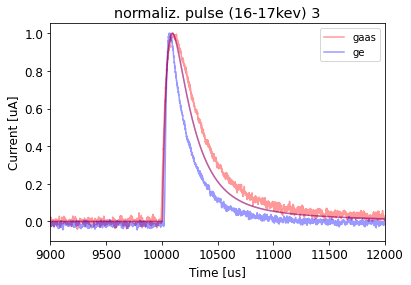

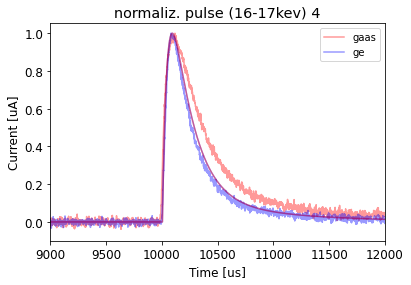

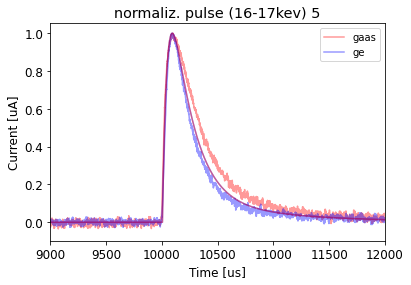

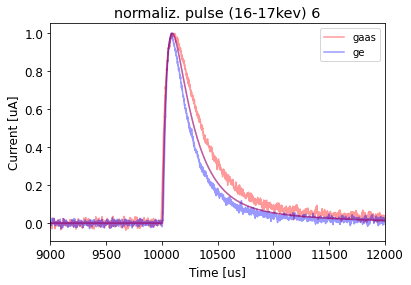

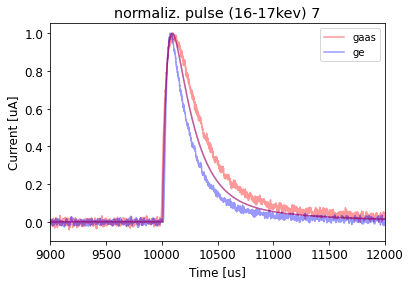

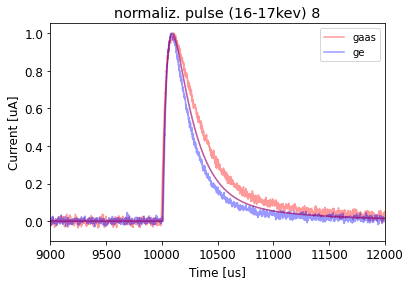

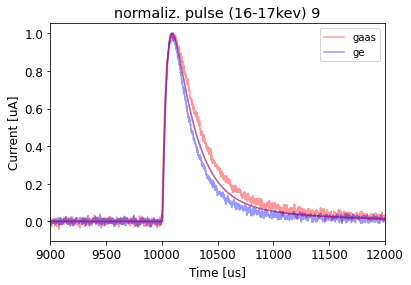

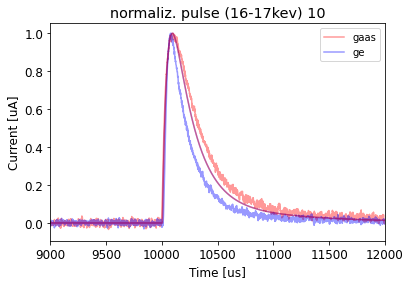

In [61]:
trace_number=10
x_temp = np.zeros(x_gaas_16to17.shape)
x_temp2 = np.zeros(x_ge_16to17.shape)
x_temp_roll = np.zeros(x_gaas_16to17.shape)
x_temp_roll2 = np.zeros(x_ge_16to17.shape)
for i in range(trace_number):
    ts = np.roll(x_gaas_16to17[i,0],-int(df.oft0_constrained_CPDv21Ge[cout_gaas16to17].iloc[i]*fs))
    ts-= np.mean(ts[0:6000])
    x_temp[i] = ts/ts.max()
    
    ts2 = np.roll(x_ge_16to17[i,0],-int(df.oft0_constrained_CPDv21Ge[cout_ge_16to17].iloc[i]*fs))
    ts2-= np.mean(ts2[0:6000])
    x_temp2[i] = ts2/ts2.max()
    
    templaterolled = np.roll(template,-int(df.oft0_constrained_CPDv21Ge[cout_gaas16to17].iloc[i]*fs))
    templaterolled -= np.mean(templaterolled[0:6000])
    x_temp_roll[i] = ((templaterolled*df.ofamp_constrained_CPDv21Ge[cout_gaas16to17].iloc[i])/
                      (templaterolled*df.ofamp_constrained_CPDv21Ge[cout_gaas16to17].iloc[i]).max())
    
    templaterolled2 = np.roll(template, -int(df.oft0_constrained_CPDv21Ge[cout_ge_16to17].iloc[i]*fs))
    templaterolled2 -= np.mean(templaterolled2[0:6000])
    x_temp_roll2[i] = ((templaterolled2*df.ofamp_constrained_CPDv21Ge[cout_ge_16to17].iloc[i])/
                      (templaterolled2*df.ofamp_constrained_CPDv21Ge[cout_ge_16to17].iloc[i]).max())
    
    plt.plot(t_gaas_16to17*1e6, x_temp[i,0], alpha=0.4, label='gaas', color='r')
    plt.plot(t_ge_16to17*1e6, x_temp2[i,0], alpha=0.4, label='ge', color='b')
    
    
    plt.plot(t_gaas_16to17*1e6, x_temp_roll[i,0], alpha=0.4, color='b')
    plt.plot(t_ge_16to17*1e6, x_temp_roll2[i,0], color='r', alpha=0.4)
                     
    
    plt.legend()
    plt.xlim(9000, 12000)
    plt.xlabel('Time [us]')
    plt.ylabel('Current [uA]')
    plt.title('normaliz. pulse (16-17kev) {}'.format(i+1))
    plt.show()

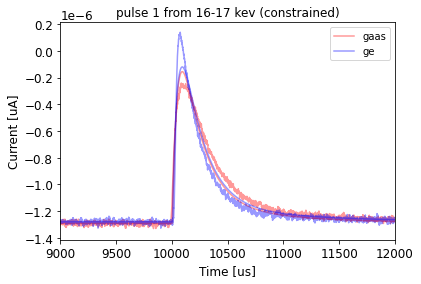

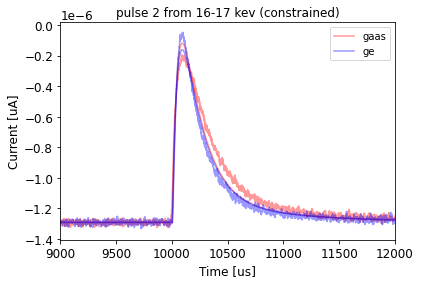

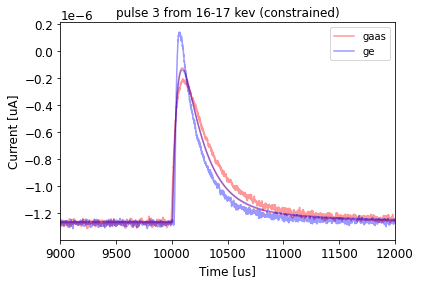

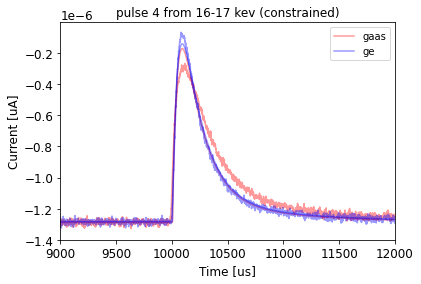

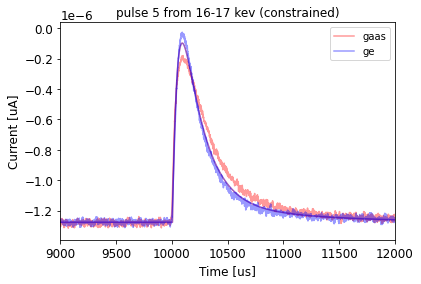

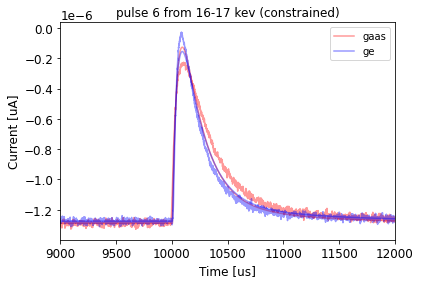

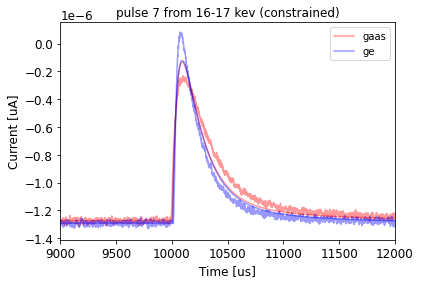

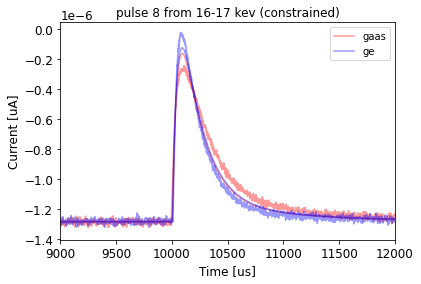

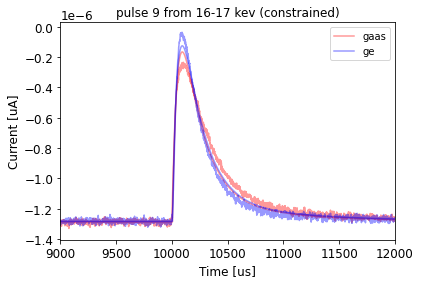

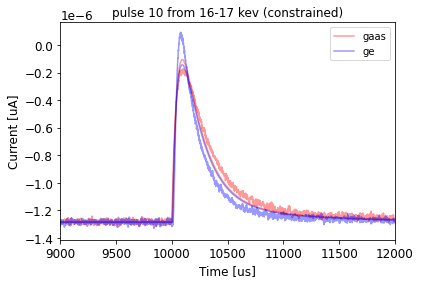

In [62]:
trace_number=10
for i in range(trace_number):
    plt.plot(t_gaas_16to17*1e6, x_gaas_16to17[i,0], alpha=0.4, label='gaas', color='r')
    templaterolled = np.roll(template,int(
        df.oft0_constrained_CPDv21Ge[cout_gaas16to17].iloc[i]*fs))
    plt.plot(t_gaas_16to17*1e6, (templaterolled*
                     df.ofamp_constrained_CPDv21Ge[cout_gaas16to17].iloc[i])+
             df.baseline_CPDv21Ge[cout_gaas16to17].iloc[i], alpha=0.4, color='r')
    
    plt.plot(t_ge_16to17*1e6, x_ge_16to17[i,0], alpha=0.4, label='ge', color='b')
    templaterolled2 = np.roll(template,int(
        df.oft0_constrained_CPDv21Ge[cout_ge_16to17].iloc[i]*fs))
    plt.plot(t_ge_16to17*1e6, (templaterolled2*
                     df.ofamp_constrained_CPDv21Ge[cout_ge_16to17].iloc[i])+
             df.baseline_CPDv21Ge[cout_ge_16to17].iloc[i], alpha=0.4, color='b')
    plt.legend()
    plt.xlim(9000, 12000)
    plt.xlabel('Time [us]')
    plt.ylabel('Current [uA]')
    plt.title('pulse {} from 16-17 kev (constrained)'.format(i+1))
    plt.show()

## Checking to see if the calibrated ofamp and the calibrated energy have a linear relationship
A linear relationship between the two implies that they are calibrated well. 

### r19 nos

In [132]:
c_goodevents_r19nos = cgoodtime_r19nosv2&cbaseline_r19nos&cchi2_temp_r19nos

Text(0, 0.5, 'calibrated energy abs [kev]')

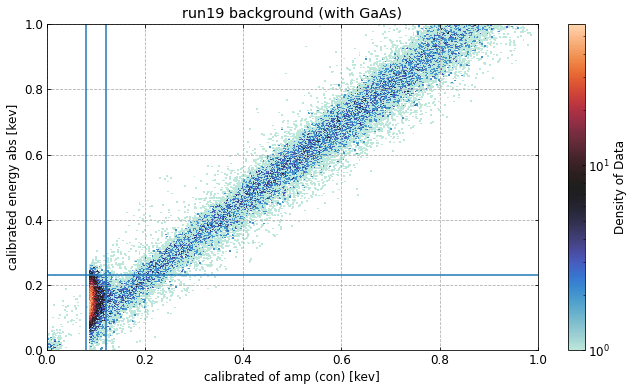

In [106]:
#slightly off from a one to one ratio by a factor of energyabsorbed*1.6
fig, ax = dp.densityplot(
    calibratedofamp_r19nos_nodelay,
    calibratedenergy_r19nos,
    cut= c_goodevents_r19nos,
    xlims=(0,1),
    ylims=(0,1)
   # ylims=(-3.25,-2)
    )
#ax.plot(x_fitting_strictcalb, y_strict_lin)
ax.axvline(0.08)
ax.axvline(0.12)
ax.axhline(0.23)
ax.set_title('run19 background (with GaAs)')
ax.set_xlabel('calibrated of amp (con) [kev]')
ax.set_ylabel('calibrated energy abs [kev]')

In [97]:
ctemp_r19nos_lowpop = dp.inrange(calibratedofamp_r19nos_constrained, 0.08, 0.12)& dp.inrange(calibratedenergy_r19nos, -np.inf, 0.23)

In [21]:
m_splitpop = 0.73
b_splitpop = 2.5

x_fitting_strictcalb = np.arange(4,20,0.1)
y_strict_lin = b_splitpop+m_splitpop*(x_fitting_strictcalb-4)

temp_funclin = lambda x, m, b: m * (x-4) + b


In [22]:

ctemp_r19nos_gaas = (((calibratedenergy_r19nos > temp_funclin(calibratedofamp_r19nos_constrained,
                                                             m_splitpop, b_splitpop)))&
            dp.inrange(calibratedofamp_r19nos_constrained,4,20))
ctemp_r19nos_ge = (((calibratedenergy_r19nos < temp_funclin(calibratedofamp_r19nos_constrained,
                                                             m_splitpop, b_splitpop)))&
            dp.inrange(calibratedofamp_r19nos_constrained,4,20))
ctemp_lessthan15kev = dp.inrange(calibratedenergy_r19nos, 0, 15)
ctemp_r19nos_gaas = ctemp_r19nos_gaas & ctemp_lessthan15kev

### r18 fe55

In [23]:
c_goodevents_r18fe = cgoodtime_r18v2&cbaseline_r18fe&cchi2_temp_r18fe

Text(0, 0.5, 'calibrated energy abs [kev]')

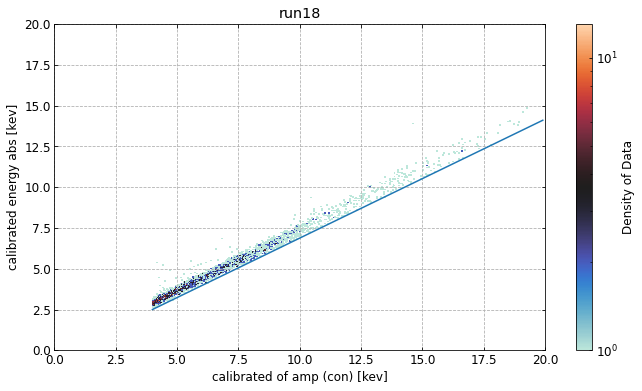

In [153]:
#slightly off from a one to one ratio by a factor of energyabsorbed*1.6
fig, ax = dp.densityplot(
    calibratedofamp_r18fe_nodelay,
    calibratedenergy_r18fe,
    cut= ctrigger_r18fe&cgoodtime_r18v2&ctemp_r18fe_gaas,
    xlims=(0,20),
    ylims=(0,20)
   # ylims=(-3.25,-2)
    ) 
ax.plot(x_fitting_strictcalb, y_strict_lin)
ax.set_title('run18')
ax.set_xlabel('calibrated of amp (con) [kev]')
ax.set_ylabel('calibrated energy abs [kev]')

In [24]:
m_splitpop = 0.73
b_splitpop = 2.5

x_fitting_strictcalb = np.arange(4,20,0.1)
y_strict_lin = b_splitpop+m_splitpop*(x_fitting_strictcalb-4)

temp_funclin = lambda x, m, b: m * (x-4) + b


In [25]:

ctemp_r18fe_gaas = (((calibratedenergy_r18fe > temp_funclin(calibratedofamp_r18fe_constrained,
                                                             m_splitpop, b_splitpop)))&
            dp.inrange(calibratedofamp_r18fe_constrained,4,20))
ctemp_r18fe_ge = (((calibratedenergy_r18fe < temp_funclin(calibratedofamp_r18fe_constrained,
                                                             m_splitpop, b_splitpop)))&
            dp.inrange(calibratedofamp_r18fe_constrained,4,20))
ctemp_lessthan15kev = dp.inrange(calibratedenergy_r18fe, 0, 15)
ctemp_r18fe_gaas = ctemp_r18fe_gaas & ctemp_lessthan15kev

# checking rates in ranges and populations

## r19 nos

In [187]:
#ctrigger&cgoodtime,cbaseline,ctemp_loose, cplitpop
cfoursevenkev=dp.inrange(calibratedofamp_r19nos_constrained,4,7)
cseventenkev=dp.inrange(calibratedofamp_r19nos_constrained,7,10)
ctentwentykev = dp.inrange(calibratedofamp_r19nos_constrained,10,20)
callev = dp.inrange(calibratedofamp_r19nos_constrained, 0,np.inf)

czerosevenkev = dp.inrange(calibratedofamp_r19nos_constrained,0,7)
csevensixtykev=dp.inrange(calibratedofamp_r19nos_constrained,7,60)
csixtyonetwntykev=dp.inrange(calibratedofamp_r19nos_constrained,60,120)
conetwntyupkev=dp.inrange(calibratedofamp_r19nos_constrained,120,np.inf)
cfourtwentykev = dp.inrange(calibratedofamp_r19nos_constrained, 4, 20)

In [165]:
cut_list = [cgoodtime_r19nosv2,cbaseline_r19nos, cchi2_temp_r19nos]
index_list = ['time','baseline','chi2']
energy_list = [czerosevenkev, csevensixtykev, csixtyonetwntykev, conetwntyupkev, callev]
cols_list = ['Randoms - Differential Efficiency','Randoms - Total Efficiency','Trigger (0-7keV) - Differential Efficiency','Trigger (0-7keV) - Total Efficiency','Trigger (7-60) - Differential Efficiency','Trigger (7-60) - Total Efficiency','Trigger (60-120) - Differential Efficiency','Trigger (60-120) - Total Efficiency','Trigger (120+) - Differential Efficiency','Trigger (120+) - Total Efficiency','Trigger (0-inf) - Differential Efficiency','Trigger (0-inf) - Total Efficiency']
energy_range_list = ["0-7 keV","7-60 keV",'60-120 keV','120+ kev','0-inf keV']

cutefficiencies(cut_list,index_list,suffix=calibratedofamp_r19nos_constrained,
                trigsuffix=ctrigger_r19nos, randsuffix=crandoms_r19nos,
                energy_cut_array=energy_list,energy_ranges=energy_range_list)

,Randoms - Differential Efficiency,Randoms - Total Efficiency,Trigger (0-7 keV)- Differential Efficiency,Trigger (0-7 keV)- Total Efficiency,Trigger (7-60 keV)- Differential Efficiency,Trigger (7-60 keV)- Total Efficiency,Trigger (60-120 keV)- Differential Efficiency,Trigger (60-120 keV)- Total Efficiency,Trigger (120+ kev)- Differential Efficiency,Trigger (120+ kev)- Total Efficiency,Trigger (0-inf keV)- Differential Efficiency,Trigger (0-inf keV)- Total Efficiency
time,0.173300,0.1733,0.161980,0.161980,0.177910,0.177910,0.175803,0.175803,0.17822,0.178220,0.166551,0.166551
baseline,0.813618,0.1410,0.861890,0.139609,0.840364,0.149509,0.828504,0.145653,0.81128,0.144587,0.850520,0.141655
chi2,0.821986,0.1159,0.919695,0.128397,0.928518,0.138822,0.978948,0.142587,1.00000,0.144587,0.935352,0.132497


In [190]:
randoms_total_eff = 0.1159
calc_rate_all = sum(c_goodevents_r19nos)/tot_runtime_r19nos
true_rate_all = calc_rate_all/randoms_total_eff

calc_rate_zeroseven = sum(c_goodevents_r19nos&czerosevenkev)/tot_runtime_r19nos
true_rate_zeroseven = calc_rate_zeroseven/randoms_total_eff

calc_rate_sevensixty = sum(c_goodevents_r19nos&csevensixtykev)/tot_runtime_r19nos
true_rate_sevensixty = calc_rate_sevensixty/randoms_total_eff

calc_rate_sixtyonetwnty = sum(c_goodevents_r19nos&csixtyonetwntykev)/tot_runtime_r19nos
true_rate_sixtyonetwnty = calc_rate_sixtyonetwnty/randoms_total_eff

calc_rate_onetwntyup = sum(c_goodevents_r19nos&conetwntyupkev)/tot_runtime_r19nos
true_rate_onetwntyup = calc_rate_onetwntyup/randoms_total_eff

calc_rate_gaas = sum(c_goodevents_r19nos&cfourtwentykev&ctemp_r19nos_gaas)/tot_runtime_r19nos
true_rate_gaas = calc_rate_gaas/randoms_total_eff

calc_rate_ge = sum(c_goodevents_r19nos&cfourtwentykev&ctemp_r19nos_ge)/tot_runtime_r19nos
true_rate_ge = calc_rate_ge/randoms_total_eff

In [191]:
print(f'The calculated rate from 0-7 keV is {calc_rate_zeroseven}, the true rate is {true_rate_zeroseven}\n')
print(f'The calculated rate from 7-60 keV is {calc_rate_sevensixty}, the true rate is {true_rate_sevensixty}\n')
print(f'The calculated rate from 60-120 keV is {calc_rate_sixtyonetwnty}, the true rate is {true_rate_sixtyonetwnty}\n')
print(f'The calculated rate from 120-inf keV is {calc_rate_onetwntyup}, the true rate is {true_rate_onetwntyup}\n')
print(f'The calculated rate from 0-inf keV is {calc_rate_all}, the true rate is {true_rate_all}\n')
print(f'The calculated rate for gaas from 4-20 kev is {calc_rate_gaas}, the true rate is {true_rate_gaas}\n')
print(f'The calculated rate for ge from 4-20 kev is {calc_rate_ge}, the true rate is {true_rate_ge}\n')

The calculated rate from 0-7 keV is 1.3910813742989336, the true rate is 12.002427733381653

The calculated rate from 7-60 keV is 0.19470044644324794, the true rate is 1.6799003144369968

The calculated rate from 60-120 keV is 0.224971824171189, the true rate is 1.9410856270162984

The calculated rate from 120-inf keV is 0.23063906840336063, the true rate is 1.9899833339375377

The calculated rate from 0-inf keV is 2.053359089639714, the true rate is 17.71664443174904

The calculated rate for gaas from 4-20 kev is 0.15364748212727303, the true rate is 1.3256900960075326

The calculated rate for ge from 4-20 kev is 0.04632527863649692, the true rate is 0.3997004196419061



## r18 fe55

In [193]:
#ctrigger&cgoodtime,cbaseline,ctemp_loose, cplitpop
cfoursevenkev=dp.inrange(calibratedofamp_r18fe_constrained,4,7)
cseventenkev=dp.inrange(calibratedofamp_r18fe_constrained,7,10)
ctentwentykev = dp.inrange(calibratedofamp_r18fe_constrained,10,20)
callev = dp.inrange(calibratedofamp_r18fe_constrained, 0,np.inf)
cfourtwentykev = dp.inrange(calibratedofamp_r18fe_constrained, 4,20)
czerosevenkev = dp.inrange(calibratedofamp_r18fe_constrained,0,7)
csevensixtykev=dp.inrange(calibratedofamp_r18fe_constrained,7,60)
csixtyonetwntykev=dp.inrange(calibratedofamp_r18fe_constrained,60,120)
conetwntyupkev=dp.inrange(calibratedofamp_r18fe_constrained,120,np.inf)

In [169]:
cut_list = [cgoodtime_r18v2,cbaseline_r18fe, cchi2_temp_r18fe]
index_list = ['time','baseline','chi2']
energy_list = [czerosevenkev, csevensixtykev, csixtyonetwntykev, conetwntyupkev, callev]
cols_list = ['Randoms - Differential Efficiency','Randoms - Total Efficiency','Trigger (0-7keV) - Differential Efficiency','Trigger (0-7keV) - Total Efficiency','Trigger (7-60) - Differential Efficiency','Trigger (7-60) - Total Efficiency','Trigger (60-120) - Differential Efficiency','Trigger (60-120) - Total Efficiency','Trigger (120+) - Differential Efficiency','Trigger (120+) - Total Efficiency','Trigger (0-inf) - Differential Efficiency','Trigger (0-inf) - Total Efficiency']
energy_range_list = ["0-7 keV","7-60 keV",'60-120 keV','120+ kev','0-inf keV']

cutefficiencies(cut_list,index_list,suffix=calibratedofamp_r18fe_constrained,
                trigsuffix=ctrigger_r18fe, randsuffix=crandoms_r18fe,
                energy_cut_array=energy_list,energy_ranges=energy_range_list)

,Randoms - Differential Efficiency,Randoms - Total Efficiency,Trigger (0-7 keV)- Differential Efficiency,Trigger (0-7 keV)- Total Efficiency,Trigger (7-60 keV)- Differential Efficiency,Trigger (7-60 keV)- Total Efficiency,Trigger (60-120 keV)- Differential Efficiency,Trigger (60-120 keV)- Total Efficiency,Trigger (120+ kev)- Differential Efficiency,Trigger (120+ kev)- Total Efficiency,Trigger (0-inf keV)- Differential Efficiency,Trigger (0-inf keV)- Total Efficiency
time,0.143231,0.143231,0.141480,0.141480,0.138325,0.138325,0.140982,0.140982,0.143889,0.143889,0.141397,0.141397
baseline,0.798067,0.114308,0.830785,0.117540,0.814566,0.112675,0.814262,0.114796,0.788840,0.113505,0.821996,0.116227
chi2,0.865074,0.098885,0.932393,0.109593,0.955612,0.107674,0.994472,0.114162,1.000000,0.113505,0.949759,0.110388


In [194]:
randoms_total_eff = 0.098885
calc_rate_all = sum(c_goodevents_r18fe)/tot_runtime_r18fe
true_rate_all = calc_rate_all/randoms_total_eff

calc_rate_zeroseven = sum(c_goodevents_r18fe&czerosevenkev)/tot_runtime_r18fe
true_rate_zeroseven = calc_rate_zeroseven/randoms_total_eff

calc_rate_sevensixty = sum(c_goodevents_r18fe&csevensixtykev)/tot_runtime_r18fe
true_rate_sevensixty = calc_rate_sevensixty/randoms_total_eff

calc_rate_sixtyonetwnty = sum(c_goodevents_r18fe&csixtyonetwntykev)/tot_runtime_r18fe
true_rate_sixtyonetwnty = calc_rate_sixtyonetwnty/randoms_total_eff

calc_rate_onetwntyup = sum(c_goodevents_r18fe&conetwntyupkev)/tot_runtime_r18fe
true_rate_onetwntyup = calc_rate_onetwntyup/randoms_total_eff

calc_rate_gaas = sum(c_goodevents_r18fe&cfourtwentykev&ctemp_r18fe_gaas)/tot_runtime_r18fe
true_rate_gaas = calc_rate_gaas/randoms_total_eff

calc_rate_ge = sum(c_goodevents_r18fe&cfourtwentykev&ctemp_r18fe_ge)/tot_runtime_r18fe
true_rate_ge = calc_rate_ge/randoms_total_eff

In [195]:
print(f'The calculated rate from 0-7 keV is {calc_rate_zeroseven}, the true rate is {true_rate_zeroseven}\n')
print(f'The calculated rate from 7-60 keV is {calc_rate_sevensixty}, the true rate is {true_rate_sevensixty}\n')
print(f'The calculated rate from 60-120 keV is {calc_rate_sixtyonetwnty}, the true rate is {true_rate_sixtyonetwnty}\n')
print(f'The calculated rate from 120-inf keV is {calc_rate_onetwntyup}, the true rate is {true_rate_onetwntyup}\n')
print(f'The calculated rate from 0-inf keV is {calc_rate_all}, the true rate is {true_rate_all}\n')
print(f'The calculated rate for gaas from 4-20 kev is {calc_rate_gaas}, the true rate is {true_rate_gaas}\n')
print(f'The calculated rate for ge from 4-20 kev is {calc_rate_ge}, the true rate is {true_rate_ge}\n')

The calculated rate from 0-7 keV is 1.0429213528659083, the true rate is 10.54681046534771

The calculated rate from 7-60 keV is 0.1515158232010174, the true rate is 1.5322427385449502

The calculated rate from 60-120 keV is 0.17186869497428836, the true rate is 1.7380663899912865

The calculated rate from 120-inf keV is 0.19121648665999041, the true rate is 1.9337259105020015

The calculated rate from 0-inf keV is 1.6235561194544839, the true rate is 16.418628906856288

The calculated rate for gaas from 4-20 kev is 0.12844923519131027, the true rate is 1.2989759335724353

The calculated rate for ge from 4-20 kev is 0.03296662687226116, the true rate is 0.33338349468838707



## r19 Ba

In [203]:
#ctrigger&cgoodtime,cbaseline,cchi2_temp
czerosevenkev_r19Ba=dp.inrange(calibratedofamp_r19Ba_constrained,0,7)
cseven60kev_r19Ba=dp.inrange(calibratedofamp_r19Ba_constrained,7,60)
csixtyonetwntykev_r19Ba = dp.inrange(calibratedofamp_r19Ba_constrained,60,120)
conetwntyupkev_r19Ba = dp.inrange(calibratedofamp_r19Ba_constrained,120,np.inf)
callev_r19Ba = dp.inrange(calibratedofamp_r19Ba_constrained, 0,np.inf)

In [204]:
#cutting efficiency tables calibrated ofamp for 12 hour Ba from run 19
cut_list = [cgoodtime_r19Ba,cbaseline_r19Ba,cchi2_temp_r19Ba]
index_list = ['time','baseline','chi2']
energy_list = [czerosevenkev_r19Ba,cseven60kev_r19Ba,csixtyonetwntykev_r19Ba,conetwntyupkev_r19Ba,callev_r19Ba]
cols_list = ['Randoms - Differential Efficiency','Randoms - Total Efficiency','Trigger (0-7keV) - Differential Efficiency','Trigger (0-7keV) - Total Efficiency','Trigger (7keV+) - Differential Efficiency','Trigger (7keV+) - Total Efficiency']
energy_range_list = ["0-7 keV","7-60 keV",'60-120 keV','120-inf kev','0-inf kev']

cutefficiencies(cut_list,index_list,suffix=calibratedofamp_r19Ba_constrained,
                trigsuffix=ctrigger_r19Ba, randsuffix=crandoms_r19Ba,
                energy_cut_array=energy_list,energy_ranges=energy_range_list)

,Randoms - Differential Efficiency,Randoms - Total Efficiency,Trigger (0-7 keV)- Differential Efficiency,Trigger (0-7 keV)- Total Efficiency,Trigger (7-60 keV)- Differential Efficiency,Trigger (7-60 keV)- Total Efficiency,Trigger (60-120 keV)- Differential Efficiency,Trigger (60-120 keV)- Total Efficiency,Trigger (120-inf kev)- Differential Efficiency,Trigger (120-inf kev)- Total Efficiency,Trigger (0-inf kev)- Differential Efficiency,Trigger (0-inf kev)- Total Efficiency
time,0.197000,0.1970,0.198539,0.198539,0.198137,0.198137,0.197387,0.197387,0.197898,0.197898,0.198222,0.198222
baseline,0.793909,0.1564,0.852255,0.169206,0.876241,0.173616,0.832711,0.164366,0.854377,0.169079,0.850667,0.168621
chi2,0.686701,0.1074,0.844237,0.142850,0.929101,0.161307,0.973456,0.160003,1.000000,0.169079,0.887159,0.149593


In [205]:
cgoodevents_r19Ba = cgoodtime_r19Ba&ctrigger_r19Ba&cbaseline_r19Ba&cchi2_temp_r19Ba

In [206]:
randoms_total_eff = 0.1074
calc_rate_all = sum(cgoodevents_r19Ba)/tot_runtime_r19Ba
true_rate_all = calc_rate_all/randoms_total_eff

calc_rate_zeroseven = sum(cgoodevents_r19Ba&czerosevenkev_r19Ba)/tot_runtime_r19Ba
true_rate_zeroseven = calc_rate_zeroseven/randoms_total_eff

calc_rate_sevensixty = sum(cgoodevents_r19Ba&cseven60kev_r19Ba)/tot_runtime_r19Ba
true_rate_sevensixty = calc_rate_sevensixty/randoms_total_eff

calc_rate_sixtyonetwnty = sum(cgoodevents_r19Ba&csixtyonetwntykev_r19Ba)/tot_runtime_r19Ba
true_rate_sixtyonetwnty = calc_rate_sixtyonetwnty/randoms_total_eff

calc_rate_onetwntyup = sum(cgoodevents_r19Ba&conetwntyupkev_r19Ba)/tot_runtime_r19Ba
true_rate_onetwntyup = calc_rate_onetwntyup/randoms_total_eff

In [207]:
print(f'The calculated rate from 0-7 keV is {calc_rate_zeroseven}, the true rate is {true_rate_zeroseven}\n')
print(f'The calculated rate from 7-60 keV is {calc_rate_sevensixty}, the true rate is {true_rate_sevensixty}\n')
print(f'The calculated rate from 60-120 keV is {calc_rate_sixtyonetwnty}, the true rate is {true_rate_sixtyonetwnty}\n')
print(f'The calculated rate from 120-inf keV is {calc_rate_onetwntyup}, the true rate is {true_rate_onetwntyup}\n')
print(f'The calculated rate from 0-inf keV is {calc_rate_all}, the true rate is {true_rate_all}\n')

The calculated rate from 0-7 keV is 2.139539979612522, the true rate is 19.921228860451787

The calculated rate from 7-60 keV is 0.39378109156889657, the true rate is 3.6664906105111412

The calculated rate from 60-120 keV is 0.8056588859211118, the true rate is 7.501479384740334

The calculated rate from 120-inf keV is 0.17351893072695254, the true rate is 1.6156325021131521

The calculated rate from 0-inf keV is 3.512498887829483, the true rate is 32.70483135781642



# Combined cuts

## Calibrated OFAmp

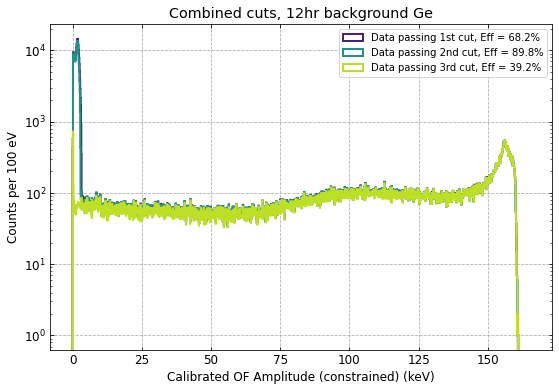

In [447]:

fig, ax = dp.hist(
    calibratedofamp_constrained,
    xlims = (0,165),
    nbins = 1650,
    cuts = [ctrigger&cgoodtime,cbaseline,cchi2_temp&c_sqglitch],
    labeldict = {'title' : 'Combined cuts, 12hr background Ge',
                'xlabel' : 'Calibrated OF Amplitude (constrained) (keV)',
                'ylabel' : 'Counts per 100 eV',
                },
    lgcrawdata=False,
)
'''
fig.savefig(
    '/data/users/da_real_maggie_reed/analysis/run_20/figs/combcuts_nos_12hr_calibofamp_hist.png',
    dpi=500,
    facecolor='none',
)
#''';

## Calibrated energy absorbed

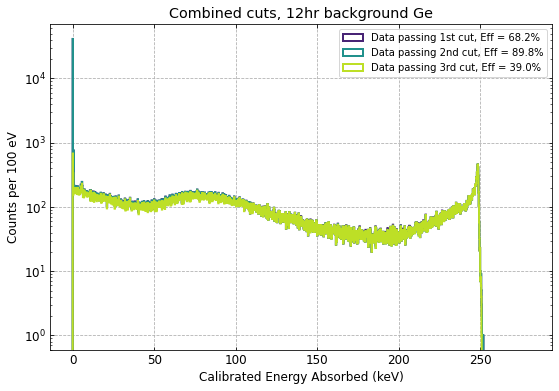

In [388]:

fig, ax = dp.hist(
    calibratedenergy,
    xlims = (0,280),
    nbins = 1700,
    cuts = [ctrigger&cgoodtime,cbaseline,cchi2_temp&c_sqglitch],
    labeldict = {'title' : 'Combined cuts, 12hr background Ge',
                'xlabel' : 'Calibrated Energy Absorbed (keV)',
                'ylabel' : 'Counts per 100 eV',
                },
    lgcrawdata=False,
)
'''
fig.savefig(
    '/data/users/da_real_maggie_reed/analysis/run_20/figs/combcuts_nos_12hr_energabs_hist.png',
    dpi=500,
    facecolor='none',
)
#''';

## Checking true efficiencies in various ranges for comparison between runs

# dR/dE rate plots (240 us)

In [102]:
import darklim
from darklim.sensitivity import RatePlot

/usr/lib64/python3.6/importlib/_bootstrap_external.py:426: ImportWarning: Not importing directory /home/maggie_reed/.local/lib/python3.6/site-packages/mpl_toolkits: missing __init__
  _warnings.warn(msg.format(portions[0]), ImportWarning)


In [33]:
ge_cpdv2_diameter=(3*constants.inch)*1e2 #3 inches, converted to cm
ge_cpdv2_thickness=0.1 #cm
ge_cpdv2_vol = constants.pi*(ge_cpdv2_diameter/2)**2*ge_cpdv2_thickness
ge_density = 5.323 #g/cm^3
ge_cpdv2_mass = ge_cpdv2_vol*ge_density*1e-3 #kg
print(ge_cpdv2_mass*1000,"grams")

gaas_cpdv2_diameter=(2*constants.inch)*1e2 #2 inches, converted to cm
gaas_cpdv2_thickness= 1 #cm
gaas_cpdv2_vol = constants.pi*(gaas_cpdv2_diameter/2)**2*gaas_cpdv2_thickness
gaas_density = 5.323 #g/cm^3
gaas_cpdv2_mass = gaas_cpdv2_vol*gaas_density*1e-3 #kg
print(gaas_cpdv2_mass*1000,"grams")

#exposure units are in [kg-days]
#so for run20 stuff, 24[g] * runtime[sec]/24[hours] -> g/sec
#and for run19 stuff, 100[g] * runtime[sec]/24[hours] -> g/sec

24.27483520112382 grams
107.88815644943922 grams


<>:23: DeprecationWarning: invalid escape sequence \p
<>:23: DeprecationWarning: invalid escape sequence \p
<>:23: DeprecationWarning: invalid escape sequence \p
<ipython-input-103-4a63882e0fdb>:23: DeprecationWarning: invalid escape sequence \p
  ax.set_ylabel("$\partial R/\partial E_r$ [evts/keV/s]")


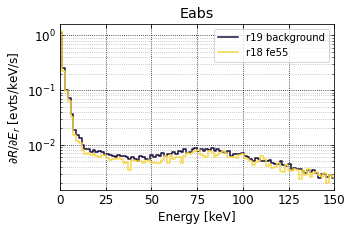

In [103]:
rateplot = RatePlot(
    (0, 150),
    figsize=np.array([1.5, 1]) * (3 + 3/8),
)
fig, ax = rateplot.fig, rateplot.ax

rateplot.add_data(
    calibratedenergy_r19nos[c_goodevents_r19nos&np.invert(ctemp_r19nos_lowpop)],
    100/24 * (tot_runtime_r19nos), efficiency = 0.1159, label = 'r19 background'
)
rateplot.add_data(
    calibratedenergy_r18fe[c_goodevents_r18fe],
    100/24 * (tot_runtime_r18fe), efficiency = 0.106346, label = 'r18 fe55'
)
'''
rateplot.add_data(
    calibratedenergy_r19Ba[ctrigger_r19Ba&cbaseline_r19Ba&cchi2_temp_r19Ba], 100/24 * (tot_runtime_r19Ba), 
    efficiency = 0.1074, label='r19 Ba'
)
''';
ax.set_title('Eabs')
ax.get_legend()
ax.set_ylabel("$\partial R/\partial E_r$ [evts/keV/s]")
#ax.set_ylim(1e3, 2e6)
ax.tick_params(which='both', direction='in', top=True, right=True)
ax.grid(b=True, linestyle='dotted', color='k')

fig.tight_layout()
'''
fig.savefig(
    '/data/users/da_real_maggie_reed/analysis/run_20/figs/drde_all_normalized.png',
    dpi=500,
    facecolor='none',
)
#''';

<>:23: DeprecationWarning: invalid escape sequence \p
<>:23: DeprecationWarning: invalid escape sequence \p
<>:23: DeprecationWarning: invalid escape sequence \p
<ipython-input-114-3aee91fa47f4>:23: DeprecationWarning: invalid escape sequence \p
  ax.set_ylabel("$\partial R/\partial E_r$ [evts/keV/s]")


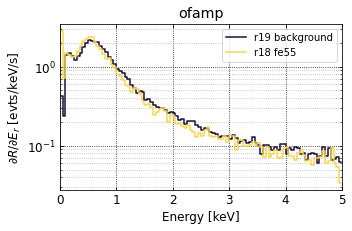

In [114]:
rateplot = RatePlot(
    (0, 5),
    figsize=np.array([1.5, 1]) * (3 + 3/8),
)
fig, ax = rateplot.fig, rateplot.ax

rateplot.add_data(
    calibratedofamp_r19nos_constrained[c_goodevents_r19nos&np.invert(ctemp_r19nos_lowpop)],
    100/24 * (tot_runtime_r19nos), efficiency = 0.1159, label = 'r19 background'
)
rateplot.add_data(
    calibratedofamp_r18fe_constrained[c_goodevents_r18fe],
    100/24 * (tot_runtime_r18fe), efficiency = 0.106346, label = 'r18 fe55'
)
'''
rateplot.add_data(
    calibratedofamp_r19Ba_constrained[ctrigger_r19Ba&cbaseline_r19Ba&cchi2_temp_r19Ba], 100/24 * (tot_runtime_r19Ba), 
    efficiency = 0.1074, label='r19 Ba'
)
''';
ax.set_title('ofamp')
ax.get_legend()
ax.set_ylabel("$\partial R/\partial E_r$ [evts/keV/s]")
#ax.set_ylim(1e3, 2e6)
ax.tick_params(which='both', direction='in', top=True, right=True)
ax.grid(b=True, linestyle='dotted', color='k')

fig.tight_layout()
'''
fig.savefig(
    '/data/users/da_real_maggie_reed/analysis/run_20/figs/drde_all_normalized.png',
    dpi=500,
    facecolor='none',
)
#''';

# Integrated Rate above threshold

In [78]:
def calc_rate_e_depend(e_recon, exp_time, efficiency):
    sorted_e_recon = np.sort(e_recon)
    sorted_sum = np.zeros(len(sorted_e_recon))
    for ii, e in enumerate(sorted_e_recon):
        sorted_sum[ii] = len(sorted_e_recon[ii:]) / exp_time
        
    return interpolate.interp1d(
        sorted_e_recon,
        sorted_sum/efficiency,
        bounds_error=False,
        fill_value=(sorted_sum[0], sorted_sum[-1]),
    )

In [79]:
exp_time_r19nos = df_r19nos.eventtime[ctrigger_r19nos].iloc[-1] - df_r19nos.eventtime[ctrigger_r19nos].iloc[0]
exp_time_r18fe = df_r18fe.eventtime[ctrigger_r18fe].iloc[-1] - df_r18fe.eventtime[ctrigger_r18fe].iloc[0]
exp_time_r19Ba = df_r19Ba.eventtime[ctrigger_r19Ba].iloc[-1] - df_r19Ba.eventtime[ctrigger_r19Ba].iloc[0]


In [104]:
rate_func_r19nos = calc_rate_e_depend(
    calibratedofamp_r19nos_constrained[c_goodevents_r19nos&np.invert(ctemp_r19nos_lowpop)],
    exp_time_r19nos, efficiency = 0.1159
)
rate_func_r18fe = calc_rate_e_depend(
    calibratedofamp_r18fe_constrained[c_goodevents_r18fe],
    exp_time_r18fe, efficiency = 0.106346
)
'''
rate_func_r19Ba = calc_rate_e_depend(
    calibratedofamp_r19Ba_constrained[cgoodevents_r19Ba],
    exp_time_r19Ba/(100/24), efficiency = 0.1074
)
''';

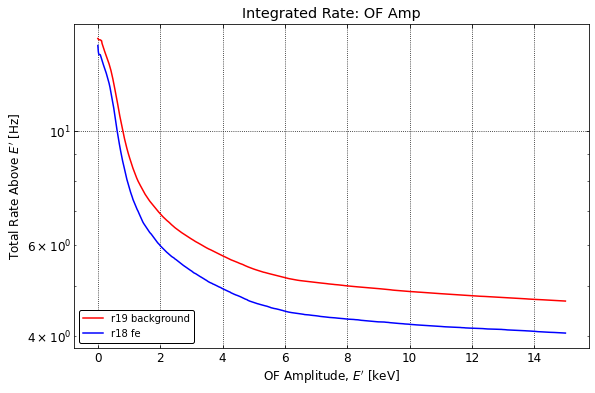

In [105]:
fig, ax = plt.subplots(figsize=(5 + 5/8) * np.array([1.5, 1]))

energies_plot = np.linspace(0, 15, num=1000)
ax.plot(
    energies_plot,
    rate_func_r19nos(energies_plot),
    color='r',
    label='r19 background',
)
ax.plot(
    energies_plot,
    rate_func_r18fe(energies_plot),
    color='b',
    label='r18 fe',
)
'''
ax.plot(
    energies_plot,
    rate_func_r19Ba(energies_plot),
    color='purple',
    label='r19 Ba',
)
''';
ax.set_yscale('log')
#ax.set_ylim(3, 10)
#ax.set_xlim(0.1, 1)
ax.set_ylabel(r"Total Rate Above $E'$ [Hz]")
ax.set_xlabel(r"OF Amplitude, $E'$ [keV]")
ax.set_title('Integrated Rate: OF Amp')
ax.legend(loc="lower left", framealpha=1, edgecolor='k')
ax.tick_params(which='both', direction='in', top=True, right=True)
ax.grid(b=True, linestyle='dotted', color='k')
fig.tight_layout()



# Other

In [22]:
#this creates a chi squared cut to use on randoms, that selects data with chi squared within 3 standard deviations of the mean
#in a chi squared distribution, the mean is the number of degrees of freedom and the variance is twice that
#the st dev is the square root of the variance
samplerate=fs
chi_thresh= int(tracelength*samplerate) + 3 * np.sqrt(2 * int(tracelength*samplerate))
chi_thresh_lower= int(tracelength*samplerate) - 3 * np.sqrt(2 * int(tracelength*samplerate))
crandschisqared = ((df.ofchi2_nodelay_CPDv21Ge < chi_thresh) & (df.ofchi2_nodelay_CPDv21Ge > chi_thresh_lower))

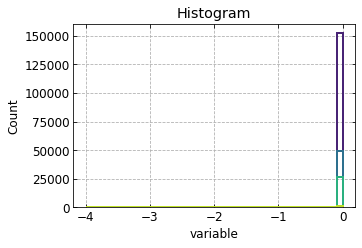

In [136]:

fig, ax = plt.subplots(figsize=np.array([1.5, 1]) * (3 + 3/8))
_, ax = dp.hist(
   df.baseline_CPDv21Ge,
    xlims=(-4,-0),
#    ylims=(),
    ax=ax,
    nbins=50,
#     cmap='binary_r',
    cuts=[ctrigger&cgood_time,ctemp_up,ctemp_loose,ctemp_tenfifteenkev],
    lgcrawdata=False,
    lgclegend=False,
)
ax.set_yscale('linear')


39.82751844259718

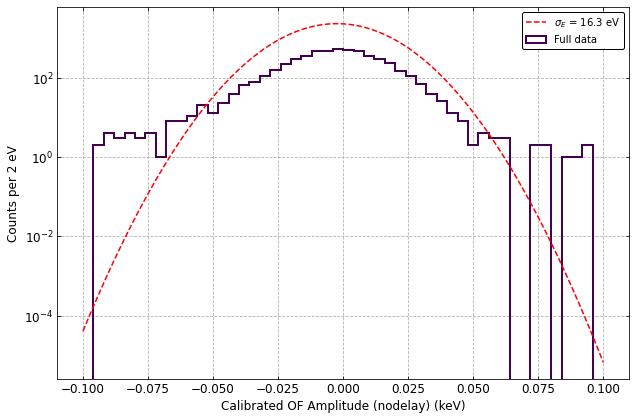

In [50]:
fig, ax = dp.hist(
    calibratedofamp_nodelay[crandoms&crandschisqared],
    nbins=50,
    xlims=(-0.1,0.1),
    labeldict = {'title' : None,
                'xlabel' : 'Calibrated OF Amplitude (nodelay) (keV)',
                'ylabel' : 'Counts per 2 eV',
                },
)
x_mean, x_std, _ = qp.cut.iterstat(calibratedofamp_nodelay[crandoms&crandschisqared])

xx = np.linspace(-0.10, 0.10, num=1000)

hist, bin_edges = np.histogram(calibratedofamp_nodelay, bins=50, range=(-.10, .10))
norm = hist.sum() * np.mean(np.diff(bin_edges))

yy = stats.norm.pdf(xx, scale=x_std, loc=x_mean) * norm

ax.plot(
    xx,
    yy,
    color='r',
    linestyle='dashed',
    label=r'$\sigma_E$' + f' = {x_std*1000:.1f} eV'
)

ax.legend(loc='upper right', framealpha=1, edgecolor='k')
fig.tight_layout()

np.std(calibratedofamp_nodelay)
#standard deviation of noise in calibrated OF amp, this is the baseline energy resolution
#we expect probably better than 20 eV



# Click get trace function

In [133]:
'''
If you want to pass a cut frame to this you should specify the cut when you pass the data frame first! 
'''
def get_trace(pulse_number, trigger_path):
    '''
    Get's the trace corresponding to an event index. 
    
    Parameters
    ----------
    pulse_number : int
        The requested pulse number you wish to pull the trace for. Given by onpick function.
    
    trigger_path : str
        Path to the triggered data file. 
        
    Returns
    ----------
    trace : ndarray
        A single array corresponding to the requested single event. 
    '''
    dump_number = np.asarray(df[df['pulsenumber'] == pulse_number]['dumpnumber'])[0]
    series_number = np.asarray(df[df['pulsenumber'] == pulse_number]['seriesnumber'])[0]
    event_index = np.asarray(df[df['pulsenumber'] == pulse_number]['eventindex'])[0]
    event_number = np.asarray(df[df['pulsenumber'] == pulse_number]['eventnumber'])[0]
    random_truth = np.asarray(df[df['pulsenumber'] == pulse_number]['randoms'])[0]
    
    if bool(random_truth):
        event_prefix = '/rand_I2_D'
    else:
        event_prefix = '/threshtrig_I2_D'
    
    file_name = (trigger_path + event_prefix + str(series_number)[1:-6]  + "_T" + 
                 str(series_number)[-6:] + "_F" + str(dump_number).zfill(4) + ".hdf5"
                )
    #print(file_name)
    trace = h5.read_single_event(event_index = event_index, file_name = file_name)
    
    return np.asarray(trace[channel_num])

def get_trace_from_plot(dataframe, label_1, label_2, trigger_path, **kwargs):
    '''
    Shows the requested event on the plot. Calls onpick function.
    
    Parameters
    -----------
    dataframe : DataFrame
        A loaded pandas dataframe containing extracted features from detprocess.
    
    label_1 : str
        A prefix corresponding to the type of extracted feature from detprocess. 
        This feature will be the desired x axis of your plot. Examples of allowed feature prefix's can be
        found in detprocess. 
    
    label_2 : str
        A prefix corresponding to the type of extracted feature from detprocess. 
        This feature will be the desired y axis of your plot. Examples of allowed feature prefix's can be
        found in detprocess. 
    
    trigger_path : str
        Path to the triggered data file. 
        
    Returns
    -----------
    A plot of label_1 vs label_2 for the dataframe with the requested event indicated. 
    '''
    dataframe_ = dataframe
    label_1_ = label_1
    label_2_ = label_2
    ylim = kwargs.get('ylims', None)
    xlim = kwargs.get('xlims', None)
    mpl.use('Qt5Agg')
    %matplotlib qt5
    
    fig, ax = plt.subplots()

    ax.scatter(np.asarray(dataframe[label_1]),
                np.asarray(dataframe[label_2]), 
                s = 3, picker = True, pickradius = 5)
    ax.set_xlabel(label_1)
    ax.set_ylabel(label_2)
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    fig.canvas.mpl_connect('pick_event', onpick)
    plt.show()



def onpick(event):
    '''
    Pulls the corresponding pulse number from the requested event and plots its trace 
    against time. Calls on get_trace function. 
    
    Parameters
    -----------
    
    event : ??
        Event/datapoint? corresponding to the clicked x,y location chosen by the user. 
    
    Returns
    -----------
    
    A plot of the trace vs time of the requested event. 
    '''
    ind = np.asarray(event.ind)[0]
    print('onpick scatter:', ind) 
    #print("Variable 1: " + str(float(np.asarray(dataframe_[label_1_])[ind])))
    #print("Variable 2: " + str(float(np.asarray(dataframe_[label_2_])[ind])))
    pulse_number = int(np.asarray(dataframe_['pulsenumber'])[ind])
    
    fig, ax = plt.subplots()
    trace = get_trace(pulse_number, trigger_path)
    ax.plot(time_arr*1e3, qp.utils.lowpassfilter(trace))
    ax.set_xlabel("Time (ms)")
    plt.show()

In [121]:
h5 = h5_reader
#change this if you have a different named trigger path, temp solution until I can make sure
#I can pass a trigger_path to onpick function correctly (since I don't know how mpl_connect quite works yet).  
trigger_path = trigger_path
dataframe_ = df
label_1_ = 'ofamp_constrained_CPDv21Ge'
label_2_ = 'energyabsorbed_CPDv21Ge'
#this should really be initialized as a function variable but fine for now since I only use one channel
channel_num = 0

time_arr = np.arange(0, len(get_trace(1, trigger_path))/fs, 1/fs)

In [134]:
get_trace_from_plot(df[cgoodtime&cbaseline],
                    label_1_,
                    label_2_,
                    trigger_path,
                    ylims = (-4e-15, 0),
                    xlims = (0,4e-6))

onpick scatter: 1865
onpick scatter: 1521
onpick scatter: 1018
onpick scatter: 1203
onpick scatter: 1192
onpick scatter: 1020
onpick scatter: 744
onpick scatter: 11086
onpick scatter: 25800
onpick scatter: 33108
onpick scatter: 8358
onpick scatter: 661
onpick scatter: 1018
onpick scatter: 677
onpick scatter: 30855


# Cut efficiencies function

In [27]:
def cutefficiencies(cut_array,cut_index, suffix, trigsuffix, randsuffix, energy_cut_array=None,columns=None,basecut=None,energy_ranges=None):
    calibratedofamp = suffix
    ctrigger = trigsuffix
    crandoms = randsuffix
    if basecut == None:
        basecut=dp.inrange(calibratedofamp,-np.inf,np.inf)
    
    if columns == None:
        columns=['Randoms - Differential Efficiency','Randoms - Total Efficiency']
        if energy_cut_array == None:
            columns.append('Trigger - Differential Efficiency')
            columns.append('Trigger - Total Efficiency')
        else:
            if energy_ranges == None:
                for count, energycut in enumerate(energy_cut_array):
                    columns.append(f'Trigger - Differential Efficiency - range {count+1}')
                    columns.append(f'Trigger - Total Efficiency - range {count+1}')
            else: 
                if len(energy_cut_array) != len(energy_ranges):
                    return "Error - energy_range and energy_cut_array length do not match"
                else:
                    for count, e_range in enumerate(energy_ranges):
                        columns.append(f'Trigger ({e_range})- Differential Efficiency')
                        columns.append(f'Trigger ({e_range})- Total Efficiency')
    
    eff_array=[]
    
    for count, cut in enumerate(cut_array):
        cut_random_diff=sum(cut&basecut&crandoms)/sum(crandoms&basecut)
        cut_random_tot=sum(cut&basecut&crandoms)/sum(crandoms)
        cut_ind=[cut_random_diff,cut_random_tot]
        if energy_cut_array == None:
            cut_trigger_diff=sum(cut&basecut&ctrigger)/sum(ctrigger&basecut)
            cut_trigger_tot=sum(cut&basecut&ctrigger)/sum(ctrigger)
            cut_ind.append(cut_trigger_diff)
            cut_ind.append(cut_trigger_tot)
        else:
            for n, energycut in enumerate(energy_cut_array):
                cut_trigger_diff=sum(cut&basecut&ctrigger&energycut)/sum(ctrigger&basecut&energycut)
                cut_trigger_tot=sum(cut&basecut&ctrigger&energycut)/sum(ctrigger&energycut)
                cut_ind.append(cut_trigger_diff)
                cut_ind.append(cut_trigger_tot)
        eff_array.append(cut_ind)
        basecut=basecut&cut
    cut_table=pd.DataFrame(eff_array,
                           columns=columns,
                           index=cut_index)
    return cut_table.head()

In [66]:
fig, ax = plt.subplots(figsize=np.array([1.5, 1]) * (3 + 3/8))
bins=100
_, ax = dp.hist(
   calibratedofamp,
 #   xlims=(0, 2),
    ax=ax,
    nbins=100,
#     cmap='binary_r',
    cuts=[ctrigger, cgood_time, cbaseline1, ctemp_loose],
    lgcrawdata=False,
    labeldict = {'title' : 'Efficiencies, loose chi2',
                'xlabel' : 'Calibrated OF Amplitude (uncon) (keV)',
                'ylabel' : (f'Counts per {int((bins[1] - bins[0]) / nbins)} eV')
                 
                 

SyntaxError: invalid syntax (<ipython-input-66-7085f8b92542>, line 14)

In [218]:
#paranoid checking the fall time of the presat fit pos delchi2
#averaging and time shifting lower
x_temp_low = np.zeros(posdelchi2_x.shape)
for ii in range(posdelchi2_x.shape[0]):
    ts = np.roll(posdelchi2_x[ii,0],-int(df_both.oft0_constrained_CPDv21Ge_up[cout_posdelchi2].iloc[ii]*fs))
    ts-= np.mean(ts[0:6000])
    x_temp_low[ii] = ts/ts.max()

x_avg_low = np.mean(x_temp_low, axis = 0) 

Text(0.5, 1.0, 'posdelchi2 presat 1000 averaged normalized traces')

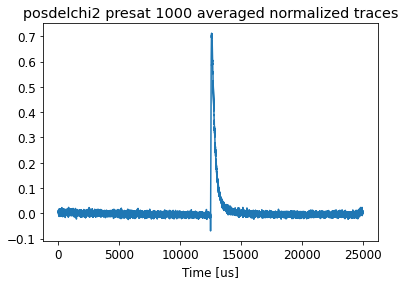

In [219]:
plt.plot(x_avg_low[0])
plt.xlabel('Time [us]')
#plt.ylabel('Current [uA]')
plt.title('posdelchi2 presat 1000 averaged normalized traces')

In [220]:
with open(yaml_path) as f:
    yaml_dict = yaml.load(f)
NLIN = (qp.OFnonlin(np.loadtxt
                (yaml_dict['CPDv21Ge']
                ['psd_path']) * 1e-20, 1.25e6)
       )

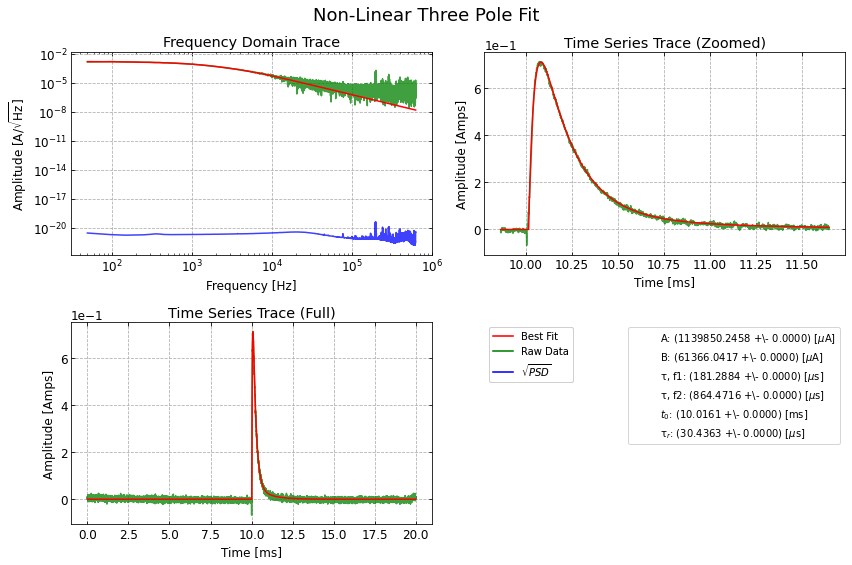

In [222]:
#three pole fit for template of the lower cuts

#returns amplitude or pulse height, rise time, fall time, time offset 
low_gooda, low_goodb, low_goodrise, low_goodf1, low_goodf2, low_tao = (NLIN.fit_falltimes(
    x_avg_low[0], npolefit=3, guess=(1, 0.5, 10e-6, 60e-6, 1000e-6, 10e-3), lgcplot=True))

# Generating two templates for the suspected ge gaas pulses

In [ ]:
#4-20 kev is the range where we can discern a difference between ofamp and eabs between two pulse shapes

#x,t is the suspected gaas pulse shape concentration (lower ofamp, higher eabs?) -> it is kept under 15 kev
#calibratedeabs to avoid any saturated events
#x2,t2 is the suspected ge pulse shape (which continues interrupted in ofamp vs eabs space) 

#we pulled 100 events from each 

In [31]:
with open(yaml_path) as f:
    yaml_dict = yaml.load(f)
NLIN = (qp.OFnonlin(np.loadtxt
                (yaml_dict['CPDv21Ge']
                ['psd_path']), 1.25e6)
       )

## Template creation for GaAs

In [96]:
x_gaas.shape

(100, 1, 25000)

Text(0.5, 0, 'Time [us]')

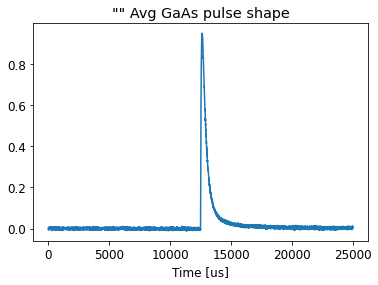

In [114]:
x_temp = np.zeros(x_gaas.shape)
for ii in range(x_gaas.shape[0]):
    ts = np.roll(x_gaas[ii,0],-int(df_r19nos.oft0_constrained_CPDv21Ge[cout_gaas].iloc[ii]*fs))
    ts-= np.mean(ts[0:6000])
    x_temp[ii] = ts/ts.max()

x_avg_gaas = np.mean(x_temp, axis = 0) 
plt.plot(x_avg_gaas[0])
plt.title('"" Avg GaAs pulse shape')
plt.xlabel('Time [us]')

1618025477866839.0
[[ 2.30934253e-16  2.36932773e-17  9.99541944e-21 -3.19328669e-20
  -3.68953939e-19 -2.74941317e-21]
 [ 2.36932746e-17  1.79238248e-17  1.28233005e-21 -9.23480466e-21
  -3.74406430e-19 -1.82050901e-22]
 [ 9.99541940e-21  1.28233016e-21  5.08300744e-25 -1.38698969e-24
  -2.27372096e-23 -1.62438105e-25]
 [-3.19328659e-20 -9.23480492e-21 -1.38698965e-24  7.09251820e-24
   1.75927560e-22  2.61253484e-25]
 [-3.68953881e-19 -3.74406428e-19 -2.27372071e-23  1.75927554e-22
   9.36328056e-21  2.66145048e-24]
 [-2.74941319e-21 -1.82050935e-22 -1.62438106e-25  2.61253499e-25
   2.66145120e-24  1.01162822e-25]]
(array([1.63226636e+00, 7.04359403e-02, 4.86129199e-05, 2.54955037e-04,
       1.82394805e-03, 9.99794869e-03]), array([1.51965211e-08, 4.23365383e-09, 7.12952133e-13, 2.66317821e-12,
       9.67640458e-11, 3.18061035e-13]), array([[ 2.30934253e-16,  2.36932773e-17,  9.99541944e-21,
        -3.19328669e-20, -3.68953939e-19, -2.74941317e-21],
       [ 2.36932746e-17,  1.79

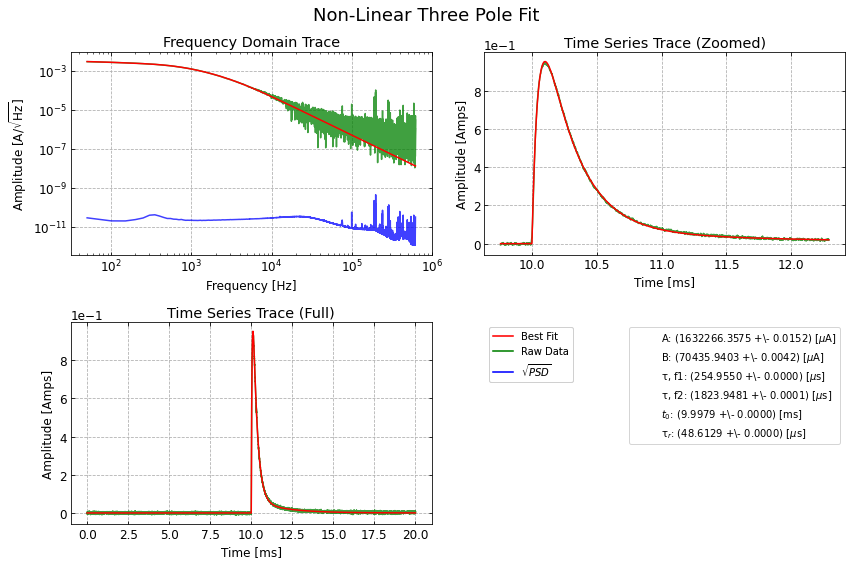

In [115]:
#returns amplitude or pulse height, rise time, fall time, time offset 
#1.5e-6, 0.1e-6, 18e-6, 100e-6, 1000e-6, 10.008e-3
threepolefit_gaas = NLIN.fit_falltimes(x_avg_gaas[0], npolefit=3, guess=(1, 0.1, 18e-6, 100e-6, 1000e-6, 10.008e-3), lgcplot=True, lgcfullrtn=True)
print(threepolefit_gaas[3]*(len(NLIN.data)-NLIN.dof))
print(threepolefit_gaas[2])
print(threepolefit_gaas)

### Plotting the GaAs template

In [116]:
A = threepolefit_gaas[0][0]
B = threepolefit_gaas[0][1]
tau_rise = threepolefit_gaas[0][2]
tau_f1 = threepolefit_gaas[0][3]
tau_f2 = threepolefit_gaas[0][4]
t0 = threepolefit_gaas[0][5]
print(A,B,tau_rise,tau_f1,tau_f2,t0)

1.6322663575123193 0.07043594033178832 4.861291992410945e-05 0.0002549550368590747 0.001823948050157712 0.009997948690895198


In [119]:
gaas_temp_v1 = NLIN.threepoletime(A,B,tau_rise,tau_f1,tau_f2,t0)
#np.savetxt("gaas_temp_v1_I2_D20221004_T151534.txt", gaas_temp_v1)
gaas_temp_load = np.loadtxt('gaas_temp_v1_I2_D20221004_T151534.txt')


In [106]:
#collection efficiencies in each falltime (when integrated to infinity)
alpha = A*(tau_f1-tau_rise)
beta =  B*(tau_f2-tau_rise)

A_colleff_inf = 100*alpha/(alpha+beta)
B_colleff_inf = 100*beta/(alpha+beta)

print('Collection efficiencies when template from gaas is integrated to infinity')
print('A = ',A_colleff_inf, "B =", B_colleff_inf)
print(alpha+beta)

Collection efficiencies when template from gaas is integrated to infinity
A =  72.86151999691667 B = 27.138480003083334
2.1716461320702056e-10


In [107]:
#collection efficiencies in each falltime (when integrated to 10ms)
alpha_10 = A*(tau_f1*(1-np.exp(-0.010/tau_f1))-tau_rise*(1-np.exp(-0.010/tau_rise)))
beta_10 =  B*(tau_f2*(1-np.exp(-0.010/tau_f2))-tau_rise*(1-np.exp(-0.010/tau_rise)))

A_colleff_10 = 100*alpha_10/(alpha_10+beta_10)
B_colleff_10 = 100*beta/(alpha_10+beta_10)

print('Collection efficiencies when template is integrated to 10ms')
print('A = ',A_colleff_10, "B =", B_colleff_10)

Collection efficiencies when template is integrated to 10ms
A =  72.94529297910502 B = 27.16968263791738


In [108]:
A_colleff = falltime_collectionefficiency(A,tau_f1,tau_rise)
B_colleff = falltime_collectionefficiency(B,tau_f2,tau_rise)

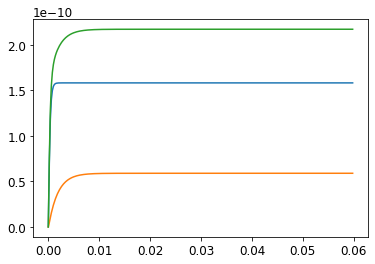

In [109]:
plt.plot(
    np.arange(0,0.06,0.0002),
    A_colleff(np.arange(0,0.06,0.0002))
)
plt.plot(
    np.arange(0,0.06,0.0002),
    B_colleff(np.arange(0,0.06,0.0002))
)
plt.plot(
    np.arange(0,0.06,0.0002),
    A_colleff(np.arange(0,0.06,0.0002))+B_colleff(np.arange(0,0.06,0.0002))
)

4.688504576642812e-07
[0.         0.         0.         ... 0.0002929  0.00029278 0.00029265]


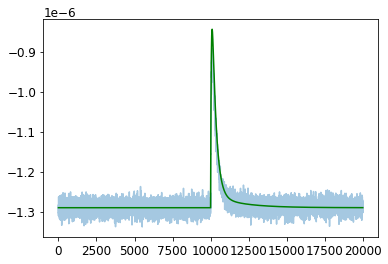

In [121]:
#plotting the gaas template vs a gaas traces, and a ge traces
trace_number = 50
plt.plot(t_gaas*1e6, x_gaas[trace_number,0], alpha=0.4)
gaas_temp_rolled = np.roll(gaas_temp_load,int(
    df_r19nos.oft0_constrained_CPDv21Ge[cout_gaas].iloc[trace_number]*fs))
plt.plot(t_gaas*1e6, (gaas_temp_rolled*
    df_r19nos.ofamp_constrained_CPDv21Ge[cout_gaas].iloc[trace_number])+
    df_r19nos.baseline_CPDv21Ge[cout_gaas].iloc[trace_number],color='green')

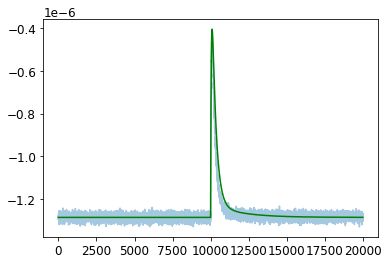

In [125]:
#plotting the gaas template vs a gaas traces, and a ge traces
trace_number = 10
plt.plot(t_ge*1e6, x_ge[trace_number,0], alpha=0.4)
gaas_temp_rolled = np.roll(gaas_temp_load,int(
    df_r19nos.oft0_constrained_CPDv21Ge[cout_ge].iloc[trace_number]*fs))
plt.plot(t_ge*1e6, (gaas_temp_rolled*
    df_r19nos.ofamp_constrained_CPDv21Ge[cout_ge].iloc[trace_number])+
    df_r19nos.baseline_CPDv21Ge[cout_ge].iloc[trace_number],color='green')

## Template creation for Ge

Text(0.5, 0, 'Time [us]')

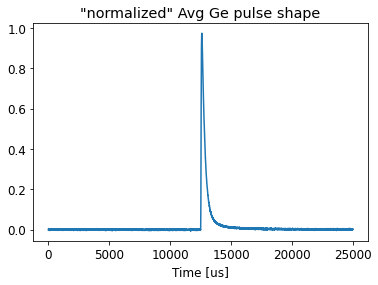

In [126]:
x_temp = np.zeros(x_ge.shape)
for ii in range(x_ge.shape[0]):
    ts2 = np.roll(x_ge[ii,0],-int(df_r19nos.oft0_constrained_CPDv21Ge[cout_ge].iloc[ii]*fs))
    ts2-= np.mean(ts2[0:6000])
    x_temp[ii] = ts2/ts2.max()

x_avg_ge = np.mean(x_temp, axis = 0) 
plt.plot(x_avg_ge[0])
plt.title('"normalized" Avg Ge pulse shape')
plt.xlabel('Time [us]')

582915323414510.6


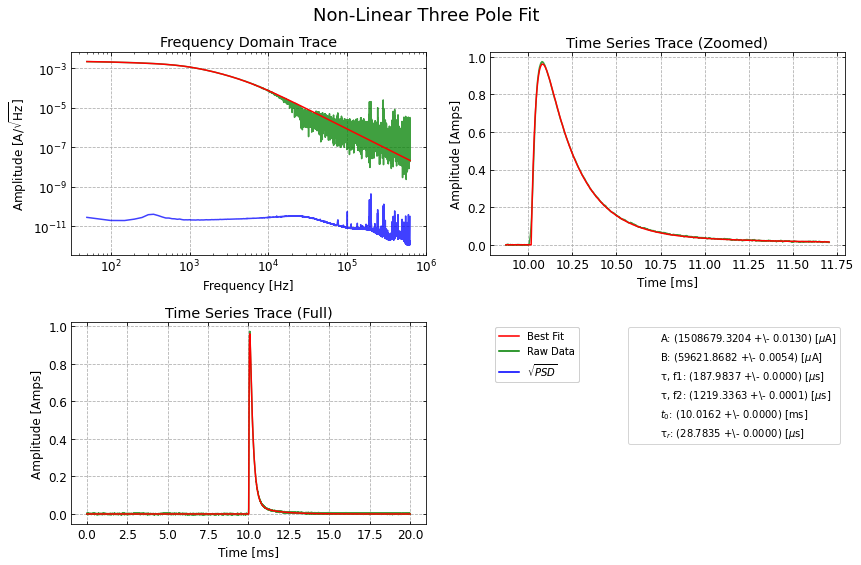

In [127]:
#returns amplitude or pulse height, rise time, fall time, time offset 
threepolefit_ge = NLIN.fit_falltimes(x_avg_ge[0], npolefit=3, guess=(1, 1, 18e-6, 100e-6, 1000e-6, 10.008e-3), lgcplot=True, lgcfullrtn=True)
print(threepolefit_ge[3]*(len(NLIN.data)-NLIN.dof))

In [128]:
A = threepolefit_ge[0][0]
B = threepolefit_ge[0][1]
tau_rise = threepolefit_ge[0][2]
tau_f1 = threepolefit_ge[0][3]
tau_f2 = threepolefit_ge[0][4]
t0 = threepolefit_ge[0][5]
print(A,B,tau_rise,tau_f1,tau_f2,t0)

1.5086793203937012 0.05962186817205553 2.8783455244066262e-05 0.0001879837123057778 0.001219336261870646 0.010016157456949506


In [135]:
ge_temp_v1 = NLIN.threepoletime(A,B,tau_rise,tau_f1,tau_f2,t0)
#np.savetxt("ge_temp_v1_I2_D20221004_T151534.txt", ge_temp_v1)
ge_temp_load = np.loadtxt('ge_temp_v1_I2_D20221004_T151534.txt')


1.5040404402281325e-06
[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.66046825e-05
 1.65937918e-05 1.65829083e-05]


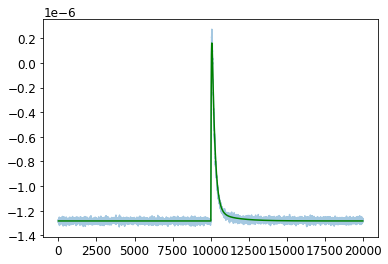

In [140]:
#plotting the ge template vs a gaas traces, and a ge traces
trace_number = 1
plt.plot(t_ge*1e6, x_ge[trace_number,0], alpha=0.4)
ge_temp_rolled = np.roll(ge_temp_load,int(
    df_r19nos.oft0_constrained_CPDv21Ge[cout_ge].iloc[trace_number]*fs))
plt.plot(t_ge*1e6, (ge_temp_rolled*
    df_r19nos.ofamp_constrained_CPDv21Ge[cout_ge].iloc[trace_number])+
    df_r19nos.baseline_CPDv21Ge[cout_ge].iloc[trace_number],color='green')

print(df_r19nos.ofamp_constrained_CPDv21Ge[cout_ge].iloc[trace_number])
print(ge_temp_rolled)

# optimization 4 pole param fitting


In [104]:
def gaussian(x, mu, sigma):
  return 1/(np.sqrt(2*np.pi)*sigma)*np.exp(-(x-mu)**2/(2*sigma**2))

In [102]:
x=np.linspace(0.01, 0.0125, 100)
temp_func = lambda x, tau0, a, tau1, tau2: a*(np.exp((-(x-tau0))/tau1)-np.exp((-(x-tau0))/tau2))

A = 1.4731
B = 0.0736
D = 1.5655

tau0 = 0.01
tauf1 = 0.000185
tauf2 = 0.000957
taur1 = 0.0000282

tauf4 = 0.000250
taur3 = 0.0000482

y1 = temp_func(x, tau0, a=A, tau1=tauf1, tau2=taur1)+temp_func(x, tau0, a=B, tau1=tauf2, tau2=taur1)
y2 = temp_func(x, tau0, a=D, tau1=tauf4, tau2=taur3)


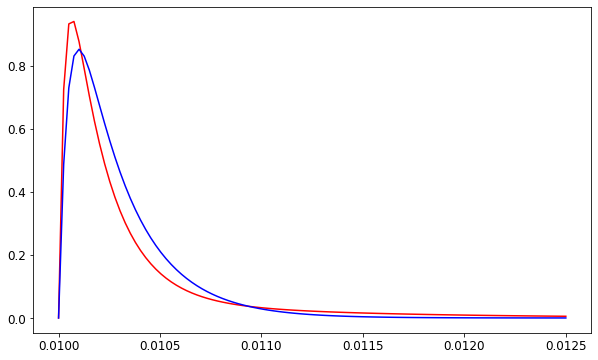

In [103]:
plt.figure(figsize=(10,6))
plt.plot(x, y1, color='r')
plt.plot(x, y2, color='b')
plt.show()

In [ ]:
deriv_dyda = (np.exp((-(x-0.01))/0.000185)-np.exp((-(x-0.01))/0.0000282))


# Calibrating ofamp 

There are several approaches to calibration we could try. 
1. Calibrating by dI/dP(0) directly:
<br>
While this is basically the same as the other method, which uses dI/dP implicitly, we will still describe it as a seperate method here.
One way of estimating where the OF Amp calibration source peaks will show is to use the following calibration coeff formula:
$$Coeff = \frac{integral(\textrm{OF Template})}{(dI/dP(0)}/\textrm{collec eff})$$
<br>
2. Calibrating from calibrated Eabs:
<br>
In this approach, we proceed as follows: 
* Calculate and convert the Eabs and convert it to true energy by dividng by the collec eff
* Calibrate the OF Amp to energy by determining the slope of the calibrated Eabs to OF Amp
<br>
This is practically the same thing we do in the first approach, but dI/dP is used implicitly. 

In [ ]:
#Plotting the calibrated energy absorbed using the collec eff from run 10 (16%) against ofamp
#We only will calibrate up to/before saturation 

slope = [1.30855763e-07]


Text(0, 0.5, 'Uncalibrated OF Amp con')

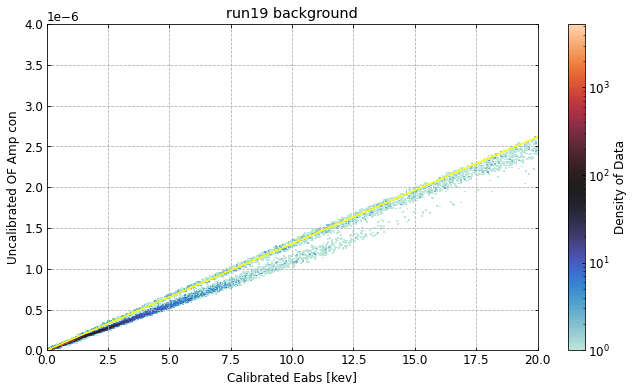

In [72]:
fig, ax = dp.densityplot(
    calibratedenergy_r19nos,
    df_r19nos.ofamp_constrained_CPDv21Ge,
    cut= c_goodevents_r19nos,
    xlims=(0,20),
    ylims=(0,0.4e-5)
   # ylims=(-3.25,-2)
    )
ax.plot(fitpoints,
        (fitslope)*fitpoints,
        color='yellow')
print('slope =',fitslope)
ax.set_title('run19 background')
ax.set_xlabel('Calibrated Eabs [kev]')
ax.set_ylabel('Uncalibrated OF Amp con')

In [68]:
# We want to avoid high density points in this calibration fitting since it can skew the linearity of the fit
# We also want to avoid the high density population of gaas events, since this will skew our fit as well. 
ctemp_calibr = dp.inrange(calibratedenergy_r19nos, 4, 7)

In [131]:
#finding slope from scipy.optimize.curve_fit (forcing intercept through 0)
linfit_func = lambda x, a: a*x
fitpoints = np.arange(80)
params = optimize.curve_fit(linfit_func,calibratedenergy_r19nos[c_goodevents_r19nos&ctemp_calibr&ctemp_r19nos_ge],
                            df_r19nos.ofamp_constrained_CPDv21Ge[c_goodevents_r19nos&ctemp_calibr&ctemp_r19nos_ge])
fitslope = params[0]
print(fitslope)

[1.30855763e-07]


In [76]:
calibratedofamp_r19nos_constrained = df_r19nos.ofamp_constrained_CPDv21Ge/fitslope
calibratedofamp_r19nos_nodelay = df_r19nos.ofamp_nodelay_CPDv21Ge/fitslope

Text(0, 0.5, 'Calibrated OF Amp [keV]')

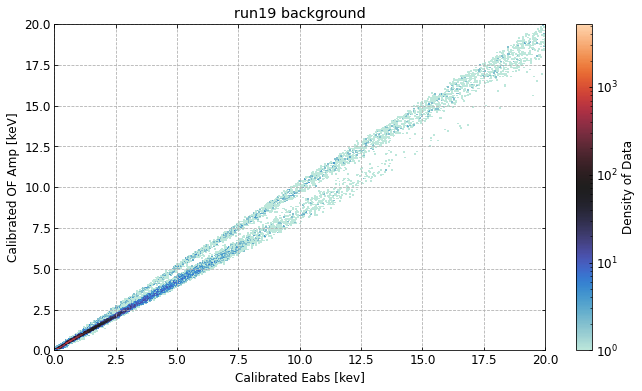

In [77]:
fig, ax = dp.densityplot(
    calibratedenergy_r19nos,
    calibratedofamp_r19nos_constrained,
    cut= c_goodevents_r19nos,
    xlims=(0,20),
    ylims=(0,20)
   # ylims=(-3.25,-2)
    )

ax.set_title('run19 background')
ax.set_xlabel('Calibrated Eabs [kev]')
ax.set_ylabel('Calibrated OF Amp [keV]')

# collection eff integration function

In [48]:
def falltime_collectionefficiency(amp,tau_f,tau_r):
    return lambda t : amp*(tau_f*(1-np.exp(-t/tau_f))-tau_r*(1-np.exp(-t/tau_r)))
